In [1]:
import os
import numpy as np
import itertools
import time
import random
from collections import OrderedDict, Counter, defaultdict
from functools import partial
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils.rnn import pad_sequence
import math, copy, time
from torch.autograd import Variable
import matplotlib.pyplot as plt
%matplotlib inline

import copy
from torch.utils.data import Dataset, DataLoader
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from torch.utils.data import random_split

import math
import json
from typing import Callable, Iterable, Tuple
from torch.optim import Optimizer
from torch.utils.data import WeightedRandomSampler

import wandb
wandb.login()
from pytorch_lightning.loggers import WandbLogger

import collections

wandb: Currently logged in as: chucooleg (use `wandb login --relogin` to force relogin)


## Data -- Generation

In [2]:
def generate_cards(attributes, attr_order, num_attributes, num_attr_vals):
    
    attr_order = attr_order[:num_attributes]
    attributes = {att_k:attributes[att_k][:num_attr_vals] for att_k in attributes if att_k in attr_order}
    
    cards = []
    idx_to_card = {}
    card_to_idx = {}

    i = 0
    attr_vals = [attributes[attr] for attr in attr_order]
    for combo in itertools.product(*attr_vals):
        card = tuple(combo)
        cards.append(card)
        card_to_idx[card] = i
        idx_to_card[i] = card
        i += 1
    
    assert len(cards) == len(set(cards))
    print(f'Generated {len(cards)} unqiue cards')                
    return cards, idx_to_card, card_to_idx


def num_shared_attributes(card1, card2):
    matching_concepts = tuple(s1 if s1==s2 else '-' for s1,s2 in zip(card1,card2))
    num_matching_concepts = len([c for c in matching_concepts if c != '-'])
    return matching_concepts, num_matching_concepts


def generate_card_pairs(cards, card_to_idx):
    '''
    find all combos of cards, filter down to the ones that share concepts.
    '''
    cardpairs_with_shared_concepts = []
    cardpairs_without_shared_concepts = []

    cardpair_to_idx, idx_to_cardpair, idx = {}, {}, 0
    num_matching_concepts_all = {}
    for card1, card2 in itertools.combinations(cards,2):
        if card1 != card2:
            matching_concepts, num_matching_concepts = num_shared_attributes(card1, card2)
            num_matching_concepts_all[(card1, card2)] = num_matching_concepts
            if num_matching_concepts:
                cardpairs_with_shared_concepts.append(((card_to_idx[card1], card_to_idx[card2]), matching_concepts))
            else:
                cardpairs_without_shared_concepts.append(((card_to_idx[card1], card_to_idx[card2]), matching_concepts))
            idx_to_cardpair[idx] = (card_to_idx[card1], card_to_idx[card2])
            cardpair_to_idx[(card_to_idx[card1], card_to_idx[card2])] = idx
            idx += 1
    print(f'Generated {len(cardpairs_with_shared_concepts) + len(cardpairs_without_shared_concepts)} cardpairs')
    print(f'-- {len(cardpairs_with_shared_concepts)} cardpairs with shared concept')
    print(f'-- {len(cardpairs_without_shared_concepts)} cardpairs without shared concept')
    print(Counter(num_matching_concepts_all.values()).most_common())
    return cardpairs_with_shared_concepts, cardpairs_without_shared_concepts, cardpair_to_idx, idx_to_cardpair


def match_concept_to_card(concept, card):
    '''
    Given a concept, determine if card matches.
    
    Arguments:
        concept: ('red', 'void', '-', '-')
        card: ex1. ('red', 'void', 'triangle', 'XOX')
              ex2. ('green', 'void', 'square', 'OXX')
    Returns:
        match: bool. ex1. True,
                     ex2. False
    '''
    match = 0
    for ct, cd in zip(concept, card):
        # As long as one concept matches, it is a match!
        if ct == cd:
            match += 1
    return match


def default_to_regular(d):
    if isinstance(d, defaultdict):
        d = {k: default_to_regular(v) for k, v in d.items()}
    return d

def gen_card_data(attributes, attr_order, num_attributes, num_attr_vals, num_unseen_cardpairs=100, debug=False):
    
    # all cards
    cards, idx_to_card, card_to_idx = generate_cards(attributes, attr_order, num_attributes, num_attr_vals)
    # all card pairs
    cardpairs_with_shared_concepts, cardpairs_without_shared_concepts, cardpair_to_idx, idx_to_cardpair = \
        generate_card_pairs(cards, card_to_idx)
    
    # generate answers
    all_matches = []
    number_of_shared_concepts_per_match = []
    cardpair_to_matches = defaultdict(lambda : defaultdict(int))
#     for cardpair in cardpairs_with_shared_concepts + cardpairs_without_shared_concepts: # NOTE!!
    for cardpair in cardpairs_with_shared_concepts:
        shared_concept = cardpair[1]
        # look for all matching cards
        # ((card pair query), matching card)
        for card in cards:
            num_matched_concepts = match_concept_to_card(shared_concept, card)
            if num_matched_concepts:
                all_matches.append((cardpair_to_idx[cardpair[0]], card_to_idx[card]))
                cardpair_to_matches[cardpair_to_idx[cardpair[0]]][card_to_idx[card]] = num_matched_concepts
                number_of_shared_concepts_per_match.append(num_matched_concepts)
    cardpair_to_matches = default_to_regular(cardpair_to_matches)
    print('Total number of matches = ', len(all_matches))
    print('Number of shared concepts per match = ', Counter(number_of_shared_concepts_per_match).most_common())
    
    # hold out some cardpairs
    unseen_cardpair_indices = list(np.random.choice(len(cardpair_to_idx), size=num_unseen_cardpairs, replace=False))
    train_cardpair_indices = [idx for idx in range(len(cardpair_to_idx)) if idx not in unseen_cardpair_indices]
    assert len(set(unseen_cardpair_indices) | set(train_cardpair_indices)) == len(cardpair_to_idx)
    
    data = {
        'idx_to_key': idx_to_card,
        'key_to_idx': card_to_idx,
        'query_to_idx': cardpair_to_idx, 
        'idx_to_query': idx_to_cardpair,
        'all_matches': all_matches, # list of tuples (query idx, answer card)
        'query_to_keys': cardpair_to_matches, # lookup query idx:{'card1':num matched concepts, 'card2':num matched concepts,...}
        'unseen_query_indices': unseen_cardpair_indices,
        'seen_query_indices': train_cardpair_indices
    }
    return data


attributes = {
    'color': ['red', 'green', 'blue', 'orange', 'cyan', 'magenta', 'black', 'yellow'],
    'fill': ['void', 'dashed', 'solid', 'checkered', 'dotted', 'mosaic', 'noise', 'brushed'],
    'shape': ['square', 'circle', 'triangle', 'star', 'hexagon', 'pentagon', 'ellipse', 'rectangle'],
    'config': ['OOO', 'OOX', 'OXO', 'OXX', 'XOO', 'XOX', 'XXO', 'XXX']
}

attr_order = ['color', 'fill', 'shape', 'config']

num_attributes = 2
num_attr_vals = 8
game_data = gen_card_data(attributes, attr_order, num_attributes, num_attr_vals, num_unseen_cardpairs=0, debug=False)

Generated 64 unqiue cards
Generated 2016 cardpairs
-- 448 cardpairs with shared concept
-- 1568 cardpairs without shared concept
[(0, 1568), (1, 448)]
Total number of matches =  3584
Number of shared concepts per match =  [(1, 3584)]


## Data -- Distribution, Splits

In [3]:
distribution_epsilon = 1e-100

count_table = np.zeros((len(game_data['idx_to_key']), len(game_data['idx_to_query'])))
        
for q, k in game_data['all_matches']:
    count_table[k, q] += 1    
        
xy = count_table/np.sum(count_table)
xy += distribution_epsilon
xy /= np.sum(xy)

x = np.sum(xy,0)
y = np.sum(xy,1)
xyind = y[None].T @ x[None]

In [4]:
# + 0.1
[(0.0029940119760479044, 270), (0.003548458638278998, 54)]
# + nothing
Counter(list(xy.reshape(-1))).most_common()

[(1e-100, 125440), (0.00027901785714285713, 3584)]

In [5]:
np.sum(count_table)

3584.0

In [6]:
xy_rank = np.linalg.matrix_rank(xy)
print('xy_rank=',xy_rank)

xy_div_xyind_rank = np.linalg.matrix_rank((xy/xyind))
print('xy_div_xyind_rank=',xy_div_xyind_rank)

xy_rank= 15
xy_div_xyind_rank= 15


In [36]:
figsize = (20,15)
# figrange = (fx_s, fx_e, fy_s, fy_e)
# figrange = (0, len(game_data['idx_to_key']), 0, len(game_data['idx_to_query']))
figrange = (0, len(game_data['idx_to_key']), 0, 300)

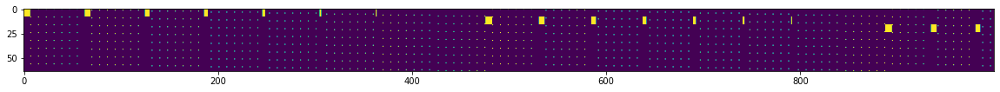

In [8]:
# all
plt.figure(figsize = figsize)
plt.imshow((xy)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

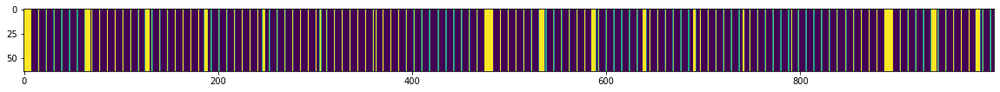

In [9]:
# all
plt.figure(figsize = figsize)
plt.imshow((xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

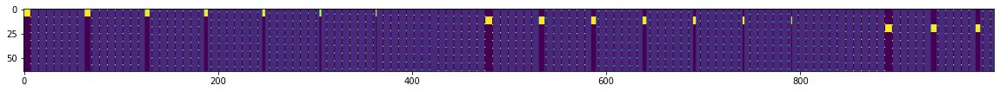

In [10]:
# all
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [11]:
Counter(list((xy/xyind).reshape(-1))).most_common()

[(0.9999999999999988, 64288),
 (0.9999999999999986, 21952),
 (2.8672000000000013e-96, 19600),
 (0.9999999999999989, 14112),
 (2.867200000000001e-96, 5488),
 (8.000000000000004, 2800),
 (8.000000000000002, 784)]

## Dataset

In [12]:
### One embed per query!

class GameDataset(Dataset):
    
    def __init__(self, raw_data, debug=False):
        '''
        raw_data: object returned by gen_card_data.
        '''
        super().__init__()
        self.raw_data = raw_data
        self.debug = debug
        # y
        self.query_support_size = len(self.raw_data['idx_to_query'])
        # x
        self.key_support_size = len(self.raw_data['idx_to_key'])
        
    def __len__(self):
        return self.query_support_size * self.key_support_size
    
    def __getitem__(self, idx):
        '''
        key_idx: (xy_i) * (xy.shape[1]=self.query_support_size) + (xy_j)
        '''
        x_i, y_j = idx//self.query_support_size, idx%self.query_support_size
        all_matches = list(self.raw_data['query_to_keys'].get(y_j, {}).keys())
        gt = np.zeros(self.key_support_size)
        gt[all_matches] = 1.0
        
        if self.debug:
            yj1, yj2 = self.raw_data['idx_to_query'][y_j]
            print('query\n', y_j,":", yj1, yj2, self.raw_data['idx_to_key'][yj1], self.raw_data['idx_to_key'][yj2])
            print('key\n', x_i, self.raw_data['idx_to_key'][x_i])
            print('all matches \n', [self.raw_data['idx_to_key'][m] for m in all_matches])
        
        return (
            idx, 
            torch.tensor([y_j]).long(), # query
            torch.tensor([x_i]).long(), # gt key
            torch.tensor(gt).long()     # all gt keys
        )    

game_dataset = GameDataset(raw_data=game_data, debug=True)
game_dataset[10] 
print('-----')
game_dataset[7] # 7 has zero prob of being sampled

query
 10 : 0 11 ('red', 'void') ('green', 'checkered')
key
 0 ('red', 'void')
all matches 
 []
-----
query
 7 : 0 8 ('red', 'void') ('green', 'void')
key
 0 ('red', 'void')
all matches 
 [('red', 'void'), ('green', 'void'), ('blue', 'void'), ('orange', 'void'), ('cyan', 'void'), ('magenta', 'void'), ('black', 'void'), ('yellow', 'void')]


(7,
 tensor([7]),
 tensor([0]),
 tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]))

In [13]:
class GameTestFullDataset(Dataset):
    
    def __init__(self, raw_data, debug=False):
        '''
        raw_data: object returned by gen_card_data.
        queries_with_shared_attr_only: bool.
        '''
        super().__init__()
        self.raw_data = raw_data
        self.debug = debug
        # y
        self.query_support_size = len(self.raw_data['idx_to_query'])
        # x
        self.key_support_size = len(self.raw_data['idx_to_key'])
        
    def __len__(self):
        return len(self.raw_data['idx_to_query'])
    
    def __getitem__(self, idx):
        '''
        key_idx: int. 0 to query_support_size-1
        '''
        y_j = idx
        x_i = torch.empty(1) # just a meaningless value
        all_matches = list(self.raw_data['query_to_keys'].get(y_j, {}).keys())
        gt = np.zeros(self.key_support_size)
        gt[all_matches] = 1.0

        if self.debug:
            yj1, yj2 = self.raw_data['idx_to_query'][y_j]
            print('query\n', y_j,":", yj1, yj2, self.raw_data['idx_to_key'][yj1], self.raw_data['idx_to_key'][yj2])
            print('all matches \n', [self.raw_data['idx_to_key'][m] for m in all_matches])
            
            
        return (
            idx, 
            torch.tensor([y_j]).long(), # query
            torch.tensor([x_i]).long(), # gt key
            torch.tensor(gt).long()     # all gt keys
        ) 
    
game_testdataset = GameTestFullDataset(raw_data=game_data, debug=True)
game_testdataset[10]
print('-----')
game_testdataset[7] # 7 has zero prob of being sampled

query
 10 : 0 11 ('red', 'void') ('green', 'checkered')
all matches 
 []
-----
query
 7 : 0 8 ('red', 'void') ('green', 'void')
all matches 
 [('red', 'void'), ('green', 'void'), ('blue', 'void'), ('orange', 'void'), ('cyan', 'void'), ('magenta', 'void'), ('black', 'void'), ('yellow', 'void')]


(7,
 tensor([7]),
 tensor([0]),
 tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]))

In [14]:
class GameDataModule(pl.LightningDataModule):
    
    def __init__(self, batch_size, raw_data, seen_train_xy, seen_val_xy, debug=False):
        super().__init__()
        self.batch_size = batch_size
        self.dataset = GameDataset(raw_data=raw_data, debug=debug)
#         self.testdataset = GameTestFullDataset(raw_data=raw_data, debug=debug)
        self.seen_train_xy = seen_train_xy
        self.seen_val_xy = seen_val_xy
        self.setup_samplers()
        
    def setup_samplers(self):
        self.train_sampler = WeightedRandomSampler(
            weights=self.seen_train_xy.reshape(-1), num_samples=self.batch_size, replacement=True
        ) 
        self.val_sampler = WeightedRandomSampler(
            weights=self.seen_val_xy.reshape(-1), num_samples=self.batch_size, replacement=True
        )
        
    def setup(self, stage=None):
        if stage == 'fit' or stage is None:
            self.train = self.dataset
            self.val = self.dataset
#         if stage == 'test' or stage is None:
#             self.test = self.testdataset
            
    def train_dataloader(self):
        train_loader = DataLoader(
            self.train, batch_size=self.batch_size, shuffle=False, sampler=self.train_sampler
        )
        return train_loader
    
    def val_dataloader(self):
        val_loader = DataLoader(
            self.val, batch_size=self.batch_size,  shuffle=False, sampler=self.val_sampler
        )
        return val_loader
    
#     def test_dataloader(self):
#         test_loader = DataLoader(
#             self.test, batch_size=self.batch_size, shuffle=False
#         )
#         return test_loader  

## Model Architecture

In [15]:
def construct_full_model(hparams):
    '''
    return: nn.Module.
    '''
    # embeddings
    query_embed_X = ScaledEmbedding(hparams['query_support_size'], hparams['d_model'])
    key_embed_X = ScaledEmbedding(hparams['key_support_size'], hparams['d_model'])
    embed_dropout = nn.Dropout(hparams['embed_dropout'])
    
    # full model
    model = EncoderPredictor(
        inp_query_layer = nn.Sequential(
            OrderedDict([
                ('scaled_embed', query_embed_X),
                ('embed_dropout', embed_dropout)
            ])
        ),
        inp_key_layer = nn.Sequential(
            OrderedDict([
                ('scaled_embed', key_embed_X),
                ('embed_dropout', embed_dropout)
            ])
        ),
        classifier = nn.Sequential(
            OrderedDict([   
                ('linear1', nn.Linear(2*hparams['d_model'], hparams['d_model'])),
                ('nonLinear1', nn.ReLU()),
                ('linear-out', nn.Linear(hparams['d_model'], 1)),
            ])
        ) if not hparams['dotproduct_bottleneck'] else None, 
        
        key_support_size = hparams['key_support_size'],
        d_model = hparams['d_model'],
        debug = hparams['debug'],
    )
    
    return model

In [16]:
class ScaledEmbedding(nn.Module):

    def __init__(self, V, d_model):
        super(ScaledEmbedding, self).__init__()
        self.embedding = nn.Embedding(V, d_model)
        # scale embedding to have variance 0.01
        nn.init.normal_(self.embedding.weight, mean=0., std=(0.01)**(1/2))
        self.d_model = d_model

    def forward(self, tokens):
        '''
        tokens: shape (batch_size=b, len)
        '''
        # shape (b, len, d_model)
        embedded = self.embedding(tokens) * math.sqrt(self.d_model)
        if torch.max(embedded) > 2000.:
            import pdb; pdb.set_trace()
        return embedded

In [17]:
class EncoderPredictor(nn.Module):
    
    def __init__(self, inp_query_layer, inp_key_layer, classifier, key_support_size, d_model, debug=False):
        super().__init__()
        self.inp_query_layer = inp_query_layer
        self.inp_key_layer = inp_key_layer
        self.classifier = classifier
        self.key_support_size = key_support_size
        self.d_model = d_model
        
    def forward(self, X_query, X_key, val_bool, debug=False):
        '''
        X_query: (b, 1)
        X_key: (b, 1) if test bool, else (b, num matched cards) or None.
        '''
        if X_key is not None: assert X_query.shape == X_key.shape
        if val_bool:
            return self.forward_norm_support(X_query, debug=debug)
        else:
            assert X_key is not None, 'X_key should not be None for normalizing over minibatch keys.'
            return self.forward_norm_minibatch(X_query, X_key, debug=debug)

    def forward_norm_minibatch(self, X_query, X_key, debug=False):
        b = X_query.shape[0]
        assert X_query.shape == (b, 1)
        
        # shape(b, d_model)
        query_repr = self.encode_query(X_query).squeeze(1)
        assert query_repr.shape == (b, self.d_model)
        
        # shape(b, d_model)
        key_repr = self.encode_key(X_key).squeeze(1)
        assert key_repr.shape == (b, self.d_model)

        if self.classifier:
            # shape(b, b, d_model)
            query_repr_tiled = query_repr.unsqueeze(1).expand(b, b, self.d_model)
            # shape(b, b, d_model)
            key_repr_tiled = key_repr.unsqueeze(0).expand(b, b, self.d_model)
            # shape(b, b, 2*d_model)
            query_key_concat = torch.cat([query_repr_tiled, key_repr_tiled], dim=2)
            assert query_key_concat.shape == (b, b, 2*self.d_model)
            # shape(b*b, 2*d_model)
            query_key_concat = query_key_concat.reshape(b*b, 2*self.d_model)
            # shape(b*b, 1)
            logits = self.classifier(query_key_concat)
            assert logits.shape == (b*b, 1)
            # shape(b, b)
            logits = logits.squeeze(1).reshape(b, b)
        else:
            # shape(b, b) dotproduct=logit matrix
            logits = torch.matmul(query_repr, key_repr.T)
        assert logits.shape == (b, b)
        
        # shape(b, b)
        return logits

    def forward_norm_support(self, X_query, debug=False):
        b = X_query.shape[0]
        assert X_query.shape == (b, 1)
        
        # shape(b, d_model)
        query_repr = self.encode_query(X_query).squeeze(1)
        assert query_repr.shape == (b, self.d_model)

        # shape(size(support), d_model)
        keys_repr = self.encode_all_keys()
        assert keys_repr.shape == (self.key_support_size, self.d_model)
        
        if self.classifier:
            # shape(b, size(support), d_model)
            query_repr_tiled = query_repr.unsqueeze(1).expand(b, self.key_support_size, self.d_model)
            # shape(b, size(support), d_model)
            key_repr_tiled = keys_repr.unsqueeze(0).expand(b, self.key_support_size, self.d_model)
            # shape(b, size(support), 2*d_model)
            query_key_concat = torch.cat([query_repr_tiled, key_repr_tiled], dim=2)
            # shape(b*size(support), 2*d_model)
            query_key_concat = query_key_concat.reshape(b*self.key_support_size, 2*self.d_model)
            # shape(b*size(support), 1)
            logits = self.classifier(query_key_concat)
            # shape(b, size(support))
            logits = logits.squeeze(1).reshape(b, self.key_support_size)
        else:
            # shape(b, size(support)) dotproduct=logit matrix
            logits = torch.matmul(query_repr, keys_repr.T)
        assert logits.shape == (b, self.key_support_size)
        
        # shape(b, size(support)) 
        return logits

    def encode_query(self, X):
        '''
        X: (batch_size=b,1)
        '''
        b = X.shape[0] 
        # shape(b, 1, embed_dim)
        inp_embed = self.inp_query_layer(X)
        assert inp_embed.shape == (b, 1, self.d_model)
        return inp_embed     
        
    def encode_key(self, X):
        '''
        X: (batch_size=b)
        '''
        b = X.shape[0] 
        # shape(b, 1, embed_dim)
        inp_embed = self.inp_key_layer(X) 
        assert inp_embed.shape == (b, 1, self.d_model)
        return inp_embed  

    def encode_all_keys(self):
        
        # shape(size(support), embed_dim)
        all_embed = self.inp_key_layer.scaled_embed.embedding.weight
        assert all_embed.requires_grad == True
        assert all_embed.shape == (self.key_support_size, self.d_model)
        
        return all_embed

## Loss, Metric

In [18]:
class InfoCELoss(nn.Module):
    '''
    InfoCE Loss on a (b, b) logits matrix with Temperature scaling
    '''

    def __init__(self, temperature_const=1.0):
        super().__init__()
        self.temperature_const = temperature_const
        self.CE_loss = nn.CrossEntropyLoss(reduction='sum')

    def forward(self, logits, debug=False):
        '''
        logits: shape (batch_size=b, b)
        '''
        assert logits.shape[0] == logits.shape[1]
        b = logits.shape[0]
        
        logits /= self.temperature_const
        
        labels = torch.arange(b).type_as(logits).long()
        sum_loss_per_row = self.CE_loss(logits, labels)
        sum_loss_per_col = self.CE_loss(logits.T, labels)
        
        if debug:
            print('sum_loss_per_row=',sum_loss_per_row)
            print('sum_loss_per_col=',sum_loss_per_col)

        loss = (sum_loss_per_row + sum_loss_per_col) * 0.5
        return loss


# ---------------------------    
loss_criterion = InfoCELoss(temperature_const=0.1)

logits = torch.tensor([
    [1.,2.,3.],
    [6.,7.,4.],
    [5.,8.,9.]
])
print('avg loss=',loss_criterion(logits, True))
print('-------------')
logits = torch.tensor([
    [3.,2.,3.],
    [6.,7.,4.],
    [5.,8.,9.]
])
print('avg loss=',loss_criterion(logits, True))


# ref
# sum_loss_per_row= tensor(20.0001)
# sum_loss_per_col= tensor(60.0001)
# avg loss= tensor(40.0001)
# -------------
# sum_loss_per_row= tensor(0.6933)
# sum_loss_per_col= tensor(40.0001)
# avg loss= tensor(20.3467)

sum_loss_per_row= tensor(20.0001)
sum_loss_per_col= tensor(60.0001)
avg loss= tensor(40.0001)
-------------
sum_loss_per_row= tensor(0.6933)
sum_loss_per_col= tensor(40.0001)
avg loss= tensor(20.3467)


In [19]:
class ThresholdedMetrics(nn.Module):
    
    def __init__(self, raw_data):
        '''
        tot_k: total number of candidates. e.g. 81 cards
        '''
        super().__init__()
        self.raw_data = raw_data
        self.key_support_size = len(self.raw_data['idx_to_key'])
        self.threshold = 1.0 / (self.key_support_size)
        self.softmax = nn.Softmax(dim=1)

    def breakdown_errors(self, X_query, corrects):
        '''
        X_query: shape (b,1) (if one embed per query)
        corrects: shape (b, support size)
        '''
        b = X_query.shape[0]
        assert corrects.shape == (b, self.key_support_size)
        
        X_query_list = X_query.squeeze(-1)
        wrongs = (1 - corrects).cpu().numpy()
        
        num_matched_concepts = [
             self.raw_data['query_to_keys'].get(X_query_list[batch_i].item(), {}).get(card_idx, 0)
            for batch_i in range(b) for card_idx in range(self.key_support_size)  
        ]
        
        num_matched_concepts = np.array(num_matched_concepts).reshape(b, self.key_support_size)
        assert num_matched_concepts.shape == wrongs.shape
        
        wrongs_mask = wrongs.reshape(-1).tolist()
        num_matched_concepts = num_matched_concepts.reshape(-1).tolist()

        error_count_by_num_matched_concepts = {k:0 for k in range(num_attributes)}
        total_count_by_num_matched_concepts = {k:0 for k in range(num_attributes)}
        for w,k in zip(wrongs_mask, num_matched_concepts):
            if w == 1:
                error_count_by_num_matched_concepts[k] += 1
            total_count_by_num_matched_concepts[k] += 1    

        error_counts, total_counts = {}, {}
        for k in range(num_attributes):
            err_ct = error_count_by_num_matched_concepts[k]
            tot_ct = total_count_by_num_matched_concepts[k]
            error_counts[f'error_rate_for_{k}_matched_concepts'] = 0 if tot_ct == 0 else (err_ct *1.0 / tot_ct)
            total_counts[f'total_count_for_{k}_matched_concepts'] = tot_ct

        return {**error_counts, **total_counts}    
    
    def forward(self, X_query, logits, X_keys, full_test_bool=False, breakdown_errors_bool=False, debug=False):
        b = X_query.shape[0]
        assert X_query.shape == (b, 1)
        b, key_support_size = logits.shape
        assert key_support_size == self.key_support_size
        assert logits.shape == X_keys.shape
        
        if full_test_bool:
            # filter down to query cards with >0 true matches
            queryIdxs_with_nonzero_matches = list(self.raw_data['query_to_keys'].keys())
            X_query_flat = X_query.squeeze(-1)
            fil = torch.stack([(X_query_flat == qId) for qId in queryIdxs_with_nonzero_matches], dim=1).any(dim=1)
            assert fil.shape == (b, )
            
            # queries with shared attributes
            fil_metrics = self.compute_metrics(X_query[fil], logits[fil], X_keys[fil], breakdown_errors_bool, debug)
            fil_metrics = {'nonNullQueries_'+k:fil_metrics[k] for k in fil_metrics}
            
            # queries without shared attributes
            not_fil = torch.logical_not(fil)
            not_fil_metrics = self.compute_metrics(X_query[not_fil], logits[not_fil], X_keys[not_fil], breakdown_errors_bool, debug)
            not_fil_metrics = {'NullQueries_'+k:not_fil_metrics[k] for k in not_fil_metrics}
            
            # all queries
            all_metrics = self.compute_metrics(X_query, logits, X_keys, breakdown_errors_bool, debug)
            
            return {**fil_metrics, **not_fil_metrics, **all_metrics}
        else:
            return self.compute_metrics(X_query, logits, X_keys, breakdown_errors_bool, debug)
    
    def compute_metrics(self, X_query, logits, X_keys, breakdown_errors_bool=False, debug=False):
        '''
        X_query: shape (b,1) (if one embed per query)
        logits: shape (b, support size)
        X_keys: shape (b, support size). value 1.0 at where card matches. value 0 otherwise.
        '''
        b, key_support_size = logits.shape
        
        # model predictions, shape (b, support size)
        binary_predictions = (self.softmax(logits) >= self.threshold).type(torch.float)
        # ground truth, shape (b, support size)
        gt = X_keys
        # correct predictions, shape (b, support size)
        corrects = (binary_predictions == gt).type(torch.float)
        
        # accuracy, computed per query, average across queries
        # (b,)
        accuracy_row = torch.sum(corrects, dim=1) / key_support_size
        # scalar
        accuracy_meanrows = torch.mean(accuracy_row)
        # accuracy, computed per query-key, average across all
        accuracy_all = torch.sum(corrects) / (b * key_support_size)
        
        # precision, computed per query, average across queries
        # (b,)
        precision_row = torch.sum((corrects * binary_predictions), dim=1) / torch.sum(binary_predictions, dim=1)
        # scalar
        precision_meanrows = torch.mean(precision_row)
        # precision, computed per query-key, average across all
        precision_all = torch.sum((corrects * binary_predictions)) / torch.sum(binary_predictions)

        # recall, computed per query, average across queries
        # (b,)
        recall_row = torch.sum((corrects * gt), dim=1) / torch.sum(gt, dim=1)
        # scalar
        recall_meanrows = torch.mean(recall_row)
        # recall, computed per query-key, average across all
        recall_all = torch.sum((corrects * gt)) / torch.sum(gt)
        
        # f1, computed per query, average across queries
        # (b,)
        f1_row = 2 * (precision_row * recall_row) / (precision_row + recall_row)
        # scalar
        f1_meanrows = torch.mean(f1_row)
        # f1, computed per query-key, average across all
        f1_all = (precision_all * recall_all) / (precision_all + recall_all)
        
        if breakdown_errors_bool:
            error_breakdown_by_num_matched_concepts = self.breakdown_errors(X_query, corrects)
        else:
            error_breakdown_by_num_matched_concepts = {} 
            
        if debug:
            print('####################################################')
            print('Metrics Per Query:')
            print('accuracy_rows', accuracy_row)
            print('precision_row', precision_row)
            print('recall_row', recall_row)
            print('f1_row', f1_row)
            print('####################################################')
            print('Metrics Averaged Across Queries')
            print('accuracy_meanrows', accuracy_meanrows)
            print('precision_meanrows', precision_meanrows)
            print('recall_meanrows', recall_meanrows)
            print('f1_meanrows', f1_meanrows)
            print('####################################################')
            print('Metrics Averaged Across All Query-Key Pairs:')
            print('accuracy_all', accuracy_all)
            print('precision_all', precision_all)
            print('recall_all', recall_all)
            print('f1_all', f1_all)
            print('####################################################')
            print('error_breakdown', error_breakdown_by_num_matched_concepts)
            
        metrics = {
            'accuracy_by_Query': accuracy_meanrows,
            'precision_by_Query': precision_meanrows,
            'recall_by_Query': recall_meanrows,
            'f1_by_Query': f1_meanrows,
            'accuracy_by_QueryKey': accuracy_all,
            'precision_by_QueryKey': precision_all,
            'recall_by_QueryKey': recall_all,
            'f1_by_QueryKey': f1_all
        }
        metrics = {
            **metrics, **error_breakdown_by_num_matched_concepts
        }
        return metrics


def test_metric_module():
    key_support_size=3
    thresh=1./key_support_size

    m_f = ThresholdedMetrics(raw_data=game_data)
    m_f.key_support_size = 3

    logits = torch.tensor(
        [
            [thresh, thresh, thresh],
            [thresh, thresh, thresh],
            [thresh, thresh, thresh]
        ]
    )
    X_keys = torch.tensor(
        [
            [1,0,0],
            [0,1,0],
            [1,1,1]
        ]
    )

    print(m_f(None, logits, X_keys, debug=True))
    print('----------------------------------------------')
    
    logits = torch.tensor(
        [
            [0.4, 0.2, 0.4],
            [thresh, thresh, thresh],
            [thresh, thresh, thresh]
        ]
    )
    X_keys = torch.tensor(
        [
            [1,0,0],
            [0,1,0],
            [1,1,1]
        ]
    )

    print(m_f(None, logits, X_keys, debug=True))
    
    
# test_metric_module()

# reference output
# accuracy_row tensor([0.3333, 0.3333, 1.0000])
# precision_row tensor([0.3333, 0.3333, 1.0000])
# recall_row tensor([1., 1., 1.])
# f1_row tensor([0.5000, 0.5000, 1.0000])
# {'accuracy': tensor(0.5556), 'precision': tensor(0.5556), 'recall': tensor(1.), 'f1': tensor(0.6667)}
# ----------------------------------------------
# accuracy_row tensor([0.6667, 0.3333, 1.0000])
# precision_row tensor([0.5000, 0.3333, 1.0000])
# recall_row tensor([1., 1., 1.])
# f1_row tensor([0.6667, 0.5000, 1.0000])
# {'accuracy': tensor(0.6667), 'precision': tensor(0.6111), 'recall': tensor(1.), 'f1': tensor(0.7222)}

## Training Module

In [20]:
# Build Lightning Module
# https://colab.research.google.com/drive/1F_RNcHzTfFuQf-LeKvSlud6x7jXYkG31#scrollTo=UIXLW8CO-W8w

thresholded_metrics = ThresholdedMetrics(raw_data=game_data)

class TrainModule(pl.LightningModule):
    
    def __init__(self, hparams, gt_distributions):
        '''
        hparams: dictionary of hyperparams
        gt_distributions: dictionary that stores the groundtruth 'xy', 'xyind' distributions.
                         each is a key_support_size by query_support_size matrix that sums up to 1.0
        '''
        super().__init__()
        self.hparams = hparams
        self.debug = hparams['debug']
        self.save_hyperparameters()
        
        self.model = construct_full_model(hparams)
        self.loss_criterion = InfoCELoss(temperature_const=self.hparams['loss_temperature_const'])
        self.metrics = thresholded_metrics

        self.key_support_size = self.hparams['key_support_size']
        self.query_support_size = self.hparams['query_support_size']
        
        # for pulling model p(x,y) and p(x,y)/[pxpy]
        self.populate_logits_matrix = hparams['populate_logits_matrix']
        if self.populate_logits_matrix:
            self.register_buffer(
                name='model_logits_matrix',
                tensor= torch.zeros(hparams['key_support_size'], hparams['query_support_size'])
            )
            self.setup_gt_distributions(gt_distributions)
        
    def log_metrics(self, metrics_dict):
        for k, v in metrics_dict.items():
            self.log(k, v)
            
    def get_max_memory_alloc(self):
        devices_max_memory_alloc = {}
        for i in range(torch.cuda.device_count()):
            device = torch.device(f'cuda:{i}')
            devices_max_memory_alloc[device] = torch.cuda.max_memory_allocated(device) / 1e6
            torch.cuda.reset_max_memory_allocated(device)
        return devices_max_memory_alloc
    
    ###################################################
    
    def forward(self, X_query, X_key, X_keys, val_bool, full_test_bool=False, debug=False):
        '''
        X_query: (b, 1)
        X_key: (b, 1)
        X_keys: (b, key_support_size) 1s and 0s.
        test_bool: boolean.
        '''
        batch_size = X_query.shape[0]
        
        # ToDo batch_size_b
        
        # shape (b,support) if test_bool else (b, b)
        logits = self.model(X_query, X_key, val_bool, debug=debug)
        # scalar
        loss = None if val_bool else self.loss_criterion(logits, debug=debug)
        # scalar
        metrics = self.metrics(
            logits=logits, X_keys=X_keys, X_query=X_query, 
            debug=debug, full_test_bool=full_test_bool, breakdown_errors_bool=True, 
        ) if val_bool else None

        return logits, loss, metrics
    
    ###################################################
    
    def setup_gt_distributions(self, gt_distributions):
        '''called once during init to setup groundtruth distributions'''
        assert gt_distributions['xy'].shape == gt_distributions['xyind'].shape
        
        # (key_support_size, query_support_size)
        self.register_buffer(
            name='gt_xy',
            tensor= torch.tensor(gt_distributions['xy'])
        )        
        # (key_support_size, query_support_size)
        self.register_buffer(
            name='gt_xyind',
            tensor= torch.tensor(gt_distributions['xyind'])
        )        
        # (key_support_size, query_support_size)
        self.register_buffer(
            name='gt_xy_div_xyind',
            tensor= self.gt_xy/self.gt_xyind
        )
        # scalar
        self.register_buffer(
            name='one',
            tensor= torch.tensor([1.0])
        )   
        # scalar
        self.register_buffer(
            name='gt_mi',
            tensor= self.compute_mutual_information(self.gt_xy, self.gt_xy_div_xyind)
        ) 
   
    
    def populate_model_logits_matrix(self, query_idx, logits):
        '''
        query_idx: shape (b,)
        logits: shape(b, key_support_size)
        '''  
        assert query_idx.shape[0] == logits.shape[0]
        b = query_idx.shape[0]
        assert logits.shape[1] == self.key_support_size
        for i in range(b):
            self.model_logits_matrix[:,query_idx[i]] = logits[i]
    
    def compute_mutual_information(self, xy, xy_div_xyind):
        '''
        xy: p(xy). shape(b, key_support_size)
        xy_div_xyind_hat: p(xy)/[p(x)(y)].
                          shape(b, key_support_size)
        '''
        assert torch.isclose(torch.sum(xy), self.one.type_as(xy))
        assert xy.shape == xy_div_xyind.shape == (
            self.key_support_size, self.query_support_size
        )
        pmi = torch.log(xy_div_xyind)
        mi = torch.sum(xy * pmi)
        return mi
    
    def pull_model_distribution(self, debug=True):

        # sanity check
        sum_logits = torch.sum(self.model_logits_matrix)
        assert sum_logits != 0.0
        
        if debug:
            print('Sum of model logits matrix\n', sum_logits)
            print('Number of model logits with zero value\n', torch.sum(self.model_logits_matrix == 0.0)) 
            print('Variance of model logits\n', torch.var(self.model_logits_matrix))
        
        # estimate the full distribution
        # hat( k * pxy/(pxpy)
        f = torch.exp(self.model_logits_matrix)
        # hat( k * pxy)
        xy_hat = f * self.gt_xyind
        # hat( pxy)
        xy_hat = (xy_hat / torch.sum(xy_hat))
        
        # estimate exp(pmi)
        # hat(k)
        k_hat = torch.sum(f) / torch.sum(self.gt_xy_div_xyind)
        # hat(pxy/(pxpy)
        xy_div_xyind_hat = (f / k_hat)
        if torch.any(torch.isnan(xy_div_xyind_hat)):
            import pdb; pdb.set_trace()
        
        # estimate MI
        # scalar
        mi_hat = self.compute_mutual_information(xy_hat, xy_div_xyind_hat)
        # scalar
        mi_gt_minus_hat = self.gt_mi - mi_hat
        
        # estimate KL divergence
        kl_div_val = F.kl_div(torch.log(xy_hat), self.gt_xy)

        # estimate ranks
        xy_hat = xy_hat.detach().cpu().numpy()
        xy_div_xyind_hat = xy_div_xyind_hat.detach().cpu().numpy()
        # hat(pxy rank)
        xy_hat_rank = np.linalg.matrix_rank(xy_hat)
        # hat(pxy/(pxpy rank)
        xy_div_xyind_hat_rank = np.linalg.matrix_rank(xy_div_xyind_hat) 
        
        pulled_distribution_results = {
            'xy_hat':xy_hat,
            'xy_div_xyind_hat':xy_div_xyind_hat,
            'xy_hat_rank':xy_hat_rank,
            'xy_div_xyind_hat_rank':xy_div_xyind_hat_rank,
            'mi_hat':mi_hat,
            'mi_gt_minus_hat':mi_gt_minus_hat,
            'kl_div':kl_div_val
        }
        
        return pulled_distribution_results

    ###################################################
    
    def training_step(self, batch, batch_nb):
        
        # _, (b, 1), (b, 1), (b, support size)
        _, X_query, X_key, X_keys = batch
        # scalar
        _, loss, _ = self(X_query, X_key, None, val_bool=False, debug=self.debug)
        # dict
        _, _, metrics = self(X_query, None, X_keys, val_bool=True, debug=self.debug)
        
        if self.debug:
            print('-----------------------------')
            print('train step')
            print(Counter(torch.sum(X_keys, dim=1).tolist()).most_common())
            print(
                'X_query:',X_query[0], '\nX_key:',
                X_key[0], '\nloss:', loss, '\nmetrics:\n', [(m,metrics[m]) for m in metrics]
            )
        
        # log
        step_metrics = {**{'train_loss': loss}, **{'train_'+m:metrics[m] for m in metrics}}
        self.log_metrics(step_metrics)
        return loss
    
    def validation_step(self, batch, batch_nb):
        
        # _, (b, 1), (b, 1), (b, support size)
        _, X_query, X_key, X_keys = batch
        _, loss, _ = self(X_query, X_key, None, val_bool=False, debug=self.debug)
        _, _, metrics = self(X_query, None, X_keys, val_bool=True, debug=self.debug)
        
        if self.debug:
            print('-----------------------------')
            print('validation step')
            print(Counter(torch.sum(X_keys, dim=1).tolist()).most_common())
            print(
                'X_query:',X_query[0], '\X_key:',
                X_key[0], '\nloss:', loss, '\nmetrics:', [(m,metrics[m]) for m in metrics]
            )
            
        # log 
        step_metrics = {**{'val_loss': loss}, **{'val_'+m:metrics[m] for m in metrics}}
        devices_max_memory_alloc = self.get_max_memory_alloc()
        for device, val in devices_max_memory_alloc.items():
            step_metrics[f'step_max_memory_alloc_cuda:{device}'] = val
        self.log_metrics(step_metrics)
        return step_metrics
    
    def test_step(self, batch, batch_nb):
        
        # (b,1), (b,1), _, (b, support size)
        query_idx, X_query, _, X_keys = batch
        
        # compute scores for all keys
        # shape(b, key_support_size), _, dictionary
        logits, _, metrics = self(X_query, None, X_keys, val_bool=True, full_test_bool=True, debug=self.debug)
        
        if self.populate_logits_matrix:
            self.populate_model_logits_matrix(query_idx, logits)
        
        # log
        step_metrics = {'test_'+m:metrics[m] for m in metrics}
        self.log_metrics(step_metrics)
        return step_metrics 
    
    ###################################################
    
    def aggregate_metrics_at_epoch_end(self, outputs):
        # log metrics
        epoch_metrics = {}
        metric_names = outputs[0].keys()
        for m in metric_names:
            if not ('max_memory_alloc_cuda' in m or 'count' in m or 'rate' in m):
                epoch_metrics['avg_'+m] = torch.stack([x[m] for x in outputs]).mean()
            elif '_matched_concepts' in m:
                epoch_metrics['avg_'+m] = np.mean([x[m] for x in outputs])
        self.log_metrics(epoch_metrics)
        return epoch_metrics         
    
    def validation_epoch_end(self, outputs):
        averaged_metrics = self.aggregate_metrics_at_epoch_end(outputs)
        return averaged_metrics
    
    def test_epoch_end(self, outputs):        
        averaged_metrics = self.aggregate_metrics_at_epoch_end(outputs)
        try:
            assert 'avg_test_error_rate_for_1_matched_concepts' in averaged_metrics
        except:
            import pdb; pdb.set_trace()
            
        return averaged_metrics
    
    ###################################################
    
    def configure_optimizers(self):
        opt = torch.optim.Adam(
            params=self.model.parameters(),
            lr=self.hparams['lr'],
            betas=(
                self.hparams['adam_beta1'], self.hparams['adam_beta2']),
            eps=self.hparams['adam_epsilon'],
            weight_decay=self.hparams['adam_weight_decay']
        )
        return opt

## hparams, init train module

In [23]:
# W&B References
# https://docs.wandb.com/library/integrations/lightning
# colab example
# https://colab.research.google.com/github/wandb/examples/blob/master/colabs/pytorch-lightning/Supercharge_your_Training_with_Pytorch_Lightning_%2B_Weights_%26_Biases.ipynb
# step by step guide
# https://wandb.ai/cayush/pytorchlightning/reports/Use-Pytorch-Lightning-with-Weights-Biases--Vmlldzo2NjQ1Mw


# Distributed Weighted Sampler
# https://discuss.pytorch.org/t/how-to-use-my-own-sampler-when-i-already-use-distributedsampler/62143/8
# https://github.com/PyTorchLightning/pytorch-lightning/discussions/3716#discussioncomment-238296

# torch lightning -- how sampler is added or removed
# https://pytorch-lightning.readthedocs.io/en/stable/multi_gpu.html?highlight=sampler#remove-samplers


hparams = {
    # game difficulty
    'num_attributes': num_attributes,
    'num_attr_vals': num_attr_vals,
    # distribution
    'distribution_epsilon': distribution_epsilon,
    'xy_size': xy.shape,
    # 
    'batch_size': 128,
    # Arch
    'key_support_size': len(game_data['idx_to_key']),
    'query_support_size': len(game_data['idx_to_query']),
    # embedding
    'd_model': 144,
    'embed_dropout': 0.0,
    # final prediction
    'dotproduct_bottleneck':True,
    # loss
    'loss_temperature_const': 1.0,
    # optimizer
    'lr': 0.001,
    'adam_beta1': 0.9,
    'adam_beta2': 0.999,
    'adam_epsilon': 1e-08,
    'warmup_steps': 12000,
    'adam_weight_decay':0,
    'gradient_clip_val': 0,
    # others
    'debug':False,
    'populate_logits_matrix': True
}

pl.seed_everything(42)

# model
trainmodule =  TrainModule(hparams, gt_distributions={'xy':xy, 'xyind':xyind})# , raw_data=game_data)
model_summary = pl.core.memory.ModelSummary(trainmodule, mode='full')
print(model_summary,'\n')

# data
game_datamodule = GameDataModule(
    batch_size = hparams['batch_size'],
    raw_data = game_data,
    seen_train_xy = xy,
    seen_val_xy = xy,
    debug=hparams['debug']
)

# logger
run_name = 'CardGame:OR;attr{}-val{};epsilon{};d_model{};params{}K-dotproduct'.format(num_attributes, num_attr_vals, str(distribution_epsilon), hparams['d_model'], round(max(model_summary.param_nums)/1000,2))
project_name = 'ContrastiveLearning-cardgame-Scaling'
wd_logger = WandbLogger(name=run_name, project=project_name)
print('RUN NAME :\n', run_name)
# check point path
ckpt_dir_PATH = os.path.join('checkpoints', project_name, run_name)

Global seed set to 42


   | Name                                         | Type               | Params
-------------------------------------------------------------------------------------
0  | model                                        | EncoderPredictor   | 299 K 
1  | model.inp_query_layer                        | Sequential         | 290 K 
2  | model.inp_query_layer.scaled_embed           | ScaledEmbedding    | 290 K 
3  | model.inp_query_layer.scaled_embed.embedding | Embedding          | 290 K 
4  | model.inp_query_layer.embed_dropout          | Dropout            | 0     
5  | model.inp_key_layer                          | Sequential         | 9.2 K 
6  | model.inp_key_layer.scaled_embed             | ScaledEmbedding    | 9.2 K 
7  | model.inp_key_layer.scaled_embed.embedding   | Embedding          | 9.2 K 
8  | loss_criterion                               | InfoCELoss         | 0     
9  | loss_criterion.CE_loss                       | CrossEntropyLoss   | 0     
10 | metrics                      

## Run Training

In [24]:
# checkpoints
os.makedirs(ckpt_dir_PATH, exist_ok=True)
checkpoint_callback = ModelCheckpoint(
    monitor='avg_val_accuracy_by_Query',
    dirpath=ckpt_dir_PATH,
    filename='{epoch:02d}-{val_loss:.2f}',
    save_top_k=6,
    save_last=True,
    mode='max',
)

# trainer
trainer = pl.Trainer(
    gpus=[1], 
    min_epochs=2, max_epochs=60000, 
    precision=32, 
    logger=wd_logger,
    log_gpu_memory='all',
    weights_summary = 'full',
    gradient_clip_val=hparams['gradient_clip_val'],
    replace_sampler_ddp=False,
    callbacks=[checkpoint_callback]
)

#fit
with torch.autograd.detect_anomaly():
    trainer.fit(trainmodule, game_datamodule)
    
wandb.save(os.path.join(ckpt_dir_PATH, 'last.ckpt'))

GPU available: True, used: True
TPU available: None, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
<ipython-input-24-e10bd6447acb>:26: UserWarning: Anomaly Detection has been enabled. This mode will increase the runtime and should only be enabled for debugging.
  with torch.autograd.detect_anomaly():


wandb: WARNING Serializing object of type ndarray that is 1032304 bytes
wandb: WARNING Serializing object of type ndarray that is 1032304 bytes

   | Name                                         | Type               | Params
-------------------------------------------------------------------------------------
0  | model                                        | EncoderPredictor   | 299 K 
1  | model.inp_query_layer                        | Sequential         | 290 K 
2  | model.inp_query_layer.scaled_embed           | ScaledEmbedding    | 290 K 
3  | model.inp_query_layer.scaled_embed.embedding | Embedding          | 290 K 
4  | model.inp_query_layer.embed_dropout          | Dropout            | 0     
5  | model.inp_key_layer                          | Sequential         | 9.2 K 
6  | model.inp_key_layer.scaled_embed             | ScaledEmbedding    | 9.2 K 
7  | model.inp_key_layer.scaled_embed.embedding   | Embedding          | 9.2 K 
8  | loss_criterion                              

Validation sanity check:   0%|          | 0/1 [00:00<?, ?it/s]

/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


Epoch 0:  50%|█████     | 1/2 [00:00<00:00,  7.13it/s, loss=5.39e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Validating:   0%|          | 0/1 [00:00<?, ?it/s]

/home/user/miniconda/lib/python3.8/site-packages/torch/cuda/memory.py:231: FutureWarning: torch.cuda.reset_max_memory_allocated now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  warnings.warn(
/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The validation_epoch_end should not return anything as of 9.1. To log, use self.log(...) or self.write(...) directly in the LightningModule
  warnings.warn(*args, **kwargs)
/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The dataloader, train dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)



Epoch 1:  50%|█████     | 1/2 [00:00<00:00,  8.61it/s, loss=5.5e+03, v_num=bywv] 
Validating: 0it [00:00, ?it/s]
Epoch 2:  50%|█████     | 1/2 [00:00<00:00,  7.99it/s, loss=5.45e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3:  50%|█████     | 1/2 [00:00<00:00,  8.12it/s, loss=5.34e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4:  50%|█████     | 1/2 [00:00<00:00,  9.60it/s, loss=5.22e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5:  50%|█████     | 1/2 [00:00<00:00,  7.44it/s, loss=5.19e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6:  50%|█████     | 1/2 [00:00<00:00,  9.60it/s, loss=5.22e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7:  50%|█████     | 1/2 [00:00<00:00,  9.03it/s, loss=5.19e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8:  50%|█████     | 1/2 [00:00<00:00,  8.04it/s, loss=5.12e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9:  50%|█████     | 1/2 [00:00<00:00,  8.54it/s, loss=5.06e+03, v_num=bywv]
Validating: 0

Epoch 37:  50%|█████     | 1/2 [00:00<00:00,  7.21it/s, loss=3.68e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38:  50%|█████     | 1/2 [00:00<00:00,  8.20it/s, loss=3.62e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39:  50%|█████     | 1/2 [00:00<00:00,  7.47it/s, loss=3.57e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40:  50%|█████     | 1/2 [00:00<00:00,  9.41it/s, loss=3.55e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41:  50%|█████     | 1/2 [00:00<00:00,  9.34it/s, loss=3.5e+03, v_num=bywv] 
Validating: 0it [00:00, ?it/s]
Epoch 42:  50%|█████     | 1/2 [00:00<00:00,  9.62it/s, loss=3.46e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=3.41e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=3.37e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=3.35e+03, v_num=bywv]
Valid

Epoch 73: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=2.33e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 74: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=2.33e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 75: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=2.3e+03, v_num=bywv] 
Validating: 0it [00:00, ?it/s]
Epoch 76: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=2.29e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 77: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=2.29e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 78: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=2.26e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 79: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=2.25e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 80: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=2.22e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 81: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=2.2e+03, v_num=bywv] 
Valid

Validating: 0it [00:00, ?it/s]
Epoch 111: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=1.68e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 112: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=1.66e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 113: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=1.64e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 114: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=1.64e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 115: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=1.61e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 116: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=1.6e+03, v_num=bywv] 
Validating: 0it [00:00, ?it/s]
Epoch 117: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=1.59e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 118: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=1.57e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 119: 100%|██████████| 2/2 [00:00<00:00, 17.

Epoch 148: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=1.25e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 149: 100%|██████████| 2/2 [00:00<00:00,  8.38it/s, loss=1.24e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 150: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=1.23e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 151: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=1.21e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 152: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=1.21e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 153: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=1.19e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 154: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=1.17e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 155: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=1.15e+03, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 156: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=1.14e+03, v_num=by

Epoch 184: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=980, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 185: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=982, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 186: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=975, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 187: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=977, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 188: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=975, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 189: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=972, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 190: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=956, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 191: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=948, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 192: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=936, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 193:

Epoch 222: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=792, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 223: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=783, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 224: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=776, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 225: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=763, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 226: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=764, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 227: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=764, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 228: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=768, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 229: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=770, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 230: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=763, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 231:

Epoch 261: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=698, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 262: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=699, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 263: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=695, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 264: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=687, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 265: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=684, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 266: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=677, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 267: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=680, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 268: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=676, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 269: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=674, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 270:

Epoch 300: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=617, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 301: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=614, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 302:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=612, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 303: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=610, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 304: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=611, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 305: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=608, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 306: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=605, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 307: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=600, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 308: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=594, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 309:

Epoch 338: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=592, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 339: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=584, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 340: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=586, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 341: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=585, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 342: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=581, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 343: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=579, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 344: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=574, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 345: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=574, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 346: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=572, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 347:

Validating: 0it [00:00, ?it/s]
Epoch 376: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=559, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 377: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=558, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 378: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=557, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 379: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=555, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 380: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=553, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 381: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=554, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 382: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=551, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 383:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=552, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 384: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=552, v_num=bywv]
Validating

Epoch 414: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=542, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 415: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=540, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 416: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=540, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 417: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=539, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 418: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=540, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 419: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=540, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 420: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=540, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 421: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=539, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 422: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=538, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 423:

Epoch 453: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=531, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 454: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=531, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 455: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=529, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 456: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=532, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 457: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=532, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 458: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=531, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 459: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=530, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 460: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=529, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 461: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=530, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 462:

Epoch 492: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=523, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 493: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=521, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 494: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=522, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 495: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=523, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 496: 100%|██████████| 2/2 [00:00<00:00, 13.52it/s, loss=523, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 497: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=523, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 498: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=524, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 499: 100%|██████████| 2/2 [00:00<00:00,  8.30it/s, loss=523, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 500: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=523, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 501:

Epoch 530: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=525, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 531: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=524, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 532: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=526, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 533: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=525, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 534: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=525, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 535: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=525, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 536: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=524, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 537: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=524, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 538: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=523, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 539:

Epoch 567: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=529, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 568: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=530, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 569: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=530, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 570: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=533, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 571: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=531, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 572: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=532, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 573: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=531, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 574: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=532, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 575: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=529, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 576:

Epoch 606: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=513, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 607: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=512, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 608: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=510, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 609: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=510, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 610: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=512, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 611: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=510, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 612: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=509, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 613: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=511, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 614: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=512, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 615:

Epoch 644: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=519, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 645: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=518, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 646: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=520, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 647: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=522, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 648: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=519, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 649: 100%|██████████| 2/2 [00:00<00:00,  7.36it/s, loss=517, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 650: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=516, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 651: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=517, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 652: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=517, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 653:

Epoch 684: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=509, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 685: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=511, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 686: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=513, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 687: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=513, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 688: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=512, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 689: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=513, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 690: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=513, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 691: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=511, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 692: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=511, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 693:

Epoch 723: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=522, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 724: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=523, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 725: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=521, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 726: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=521, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 727: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=519, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 728: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=519, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 729: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=518, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 730: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=518, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 731: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=520, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 732:

Epoch 762: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=509, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 763: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=505, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 764: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=507, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 765: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=508, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 766: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=509, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 767: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=509, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 768:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=510, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 769: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=508, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 770: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=509, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 771:

Epoch 799: 100%|██████████| 2/2 [00:00<00:00,  7.75it/s, loss=513, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 800: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=510, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 801: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=507, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 802: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=507, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 803: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=507, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 804: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=509, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 805: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=507, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 806: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=507, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 807: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=511, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 808:

Validating: 0it [00:00, ?it/s]
Epoch 838: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=510, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 839: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=509, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 840: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=510, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 841: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=509, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 842: 100%|██████████| 2/2 [00:00<00:00, 12.97it/s, loss=509, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 843: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=509, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 844: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=509, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 845: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=506, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 846: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=506, v_num=bywv]
Validating

Epoch 876: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=513, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 877: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=512, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 878: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=510, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 879: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=511, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 880: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=512, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 881: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=512, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 882: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=513, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 883: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=512, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 884: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=513, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 885:

Epoch 914: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=507, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 915: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=507, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 916: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=506, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 917: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=504, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 918: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=507, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 919: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=506, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 920: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=508, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 921: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=508, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 922: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=507, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 923:

Epoch 953: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=507, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 954: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=506, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 955: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=506, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 956: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=509, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 957: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=511, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 958: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=512, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 959: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=512, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 960: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=512, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 961: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=512, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 962:

Epoch 991: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=505, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 992: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=503, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 993: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=500, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 994: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=500, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 995: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=499, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 996: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=500, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 997: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=499, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 998: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=498, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 999: 100%|██████████| 2/2 [00:00<00:00,  8.53it/s, loss=498, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1000

Epoch 1030: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=504, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1031: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=506, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1032: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=505, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1033: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=505, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1034: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=507, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1035: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=506, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1036: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=506, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1037: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=505, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1038: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=508, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 1069: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=501, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1070: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=502, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1071: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=505, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1072: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=504, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1073: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=501, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1074: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=499, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1075: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=498, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1076: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=498, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1077: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=499, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 1107: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=503, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1108: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=504, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1109: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=504, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1110: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=506, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1111: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=505, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1112: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=506, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1113: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=509, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1114: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=508, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1115: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=507, v_num=bywv]
V

Epoch 1146: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=511, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1147: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=510, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1148: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=510, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1149: 100%|██████████| 2/2 [00:00<00:00,  8.37it/s, loss=512, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1150: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=512, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1151: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=507, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1152: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=509, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1153: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=511, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1154: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=508, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 1183: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=507, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1184: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=507, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1185: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=504, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1186: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=504, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1187: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=502, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1188: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=501, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1189: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=499, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1190: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=498, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1191: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=498, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 1220: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=505, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1221: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=505, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1222: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=504, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1223: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=505, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1224: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=504, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1225: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=504, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1226: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=504, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1227: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=502, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1228: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=501, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 1260: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=496, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1261: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=496, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1262: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=493, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1263: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=493, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1264: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=495, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1265: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=499, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1266: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=500, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1267: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=504, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1268: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=502, v_num=bywv]
V

Epoch 1298: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=502, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1299: 100%|██████████| 2/2 [00:00<00:00,  8.08it/s, loss=501, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1300: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=502, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1301: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=503, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1302: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=503, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1303:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=503, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1304:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=501, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1305:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=502, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1306: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=501, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 1336: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=500, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1337:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=499, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1338: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=501, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1339: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=499, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1340: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=500, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1341: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=500, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1342: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=500, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1343: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=500, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1344: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=498, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 1375: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=490, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1376: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=490, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1377: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=491, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1378: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=493, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1379: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=492, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1380: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=492, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1381: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=496, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1382: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=496, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1383: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=497, v_num=bywv]
V

Epoch 1415: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=492, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1416: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=494, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1417: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=493, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1418: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=495, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1419: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=495, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1420: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=495, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1421: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=495, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1422: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=499, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1423: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=498, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 1454: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=498, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1455: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=497, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1456: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=497, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1457: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=497, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1458: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=496, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1459: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=497, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1460: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=496, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1461: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=495, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1462: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=496, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 1493: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=488, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1494: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=486, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1495: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=485, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1496: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=486, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1497: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=488, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1498: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=487, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1499: 100%|██████████| 2/2 [00:00<00:00,  9.11it/s, loss=487, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1500:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=489, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1501:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=489, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 1531: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=493, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1532: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=492, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1533: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=491, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1534: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=492, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1535: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=491, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1536: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=490, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1537: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=490, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1538: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=489, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1539: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=490, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 1569: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=485, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1570: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=484, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1571:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=482, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1572: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=481, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1573: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=483, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1574: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=484, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1575: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=484, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1576: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=486, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1577: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=489, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 1608: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=492, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1609: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=491, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1610: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=492, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1611: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=491, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1612: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=491, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1613: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=490, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1614: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=487, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1615: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=489, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1616: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=490, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 1647: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=486, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1648: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=487, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1649: 100%|██████████| 2/2 [00:00<00:00,  9.51it/s, loss=489, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1650: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=489, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1651: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=488, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1652: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=490, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1653: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=492, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1654: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=492, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1655: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=491, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 1687: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=482, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1688: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=484, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1689: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=485, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1690: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=486, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1691: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=487, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1692: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=484, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1693: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=488, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1694: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=488, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1695: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=491, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 1726: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=491, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1727: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=492, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1728: 100%|██████████| 2/2 [00:00<00:00, 13.42it/s, loss=491, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1729: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=494, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1730: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=493, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1731: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=494, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1732: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=492, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1733: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=491, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1734: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=488, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 1766: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=488, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1767: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=488, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1768: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=488, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1769: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=487, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1770: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=486, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1771: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=484, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1772: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=483, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1773: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=485, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1774: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=485, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 1805: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=480, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1806: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=479, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1807: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=479, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1808: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=478, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1809: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=481, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1810: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=482, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1811:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=483, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1812: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=483, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1813: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=484, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 1844: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=478, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1845: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=479, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1846: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=480, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1847: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=477, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1848: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=476, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1849: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s, loss=476, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1850: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=477, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1851: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1852: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=476, v_num=bywv]
V

Epoch 1884: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=482, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1885: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=483, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1886: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=482, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1887: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=481, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1888: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=480, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1889: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=480, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1890: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=480, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1891: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=479, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1892: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=477, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 1924: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=482, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1925: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=483, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1926: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=481, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1927: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=480, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1928: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=481, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1929: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=483, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1930: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=484, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1931: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=483, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1932: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=483, v_num=bywv]
V

Epoch 1962: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=479, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1963: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=480, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1964: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=481, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1965: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=482, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1966: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=484, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1967: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=483, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1968: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=481, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1969: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=482, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 1970: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=482, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 2000: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=478, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2001: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=477, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2002: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=479, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2003: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=480, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2004: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=479, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2005: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=478, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2006: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=477, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2007: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=478, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2008: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=479, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 2040: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=480, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2041:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=481, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2042: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=481, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2043: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=481, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2044: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=482, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2045: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=482, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2046: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=481, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2047: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=478, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2048: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=476, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 2078: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=467, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2079: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=468, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2080: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=469, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2081: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=469, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2082: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=469, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2083: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=471, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2084: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=471, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2085: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=471, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2086: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=473, v_num=bywv]
V

Epoch 2116: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=473, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2117: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=475, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2118: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=475, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2119: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=476, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2120:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=476, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2121: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=479, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2122: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=481, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2123: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=482, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2124: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=481, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 2154: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=477, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2155: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=477, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2156: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=476, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2157: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=475, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2158: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=475, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2159: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2160:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=472, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2161: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=473, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2162: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=473, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 2194: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2195: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2196: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=475, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2197: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=476, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2198: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=476, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2199: 100%|██████████| 2/2 [00:00<00:00,  8.22it/s, loss=477, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2200: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=475, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2201: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=475, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2202: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=475, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 2234: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=473, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2235: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=473, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2236: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=471, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2237: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=471, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2238: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=473, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2239: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=470, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2240: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=469, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2241: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=469, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2242: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=469, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 2273: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=475, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2274: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=475, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2275: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2276: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=472, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2277: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=472, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2278: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=469, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2279: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=468, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2280: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=466, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2281: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=466, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 2313: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=473, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2314: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2315: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2316: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=473, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2317: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2318: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=473, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2319: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2320: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=476, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2321: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 2351: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=476, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2352: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=477, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2353: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=476, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2354: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=476, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2355: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2356: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2357: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=473, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2358: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2359: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 2391: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=478, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2392: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=478, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2393: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=477, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2394: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=475, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2395: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=477, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2396: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=478, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2397: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=476, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2398: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2399: 100%|██████████| 2/2 [00:00<00:00,  8.63it/s, loss=473, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 2430: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=466, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2431: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=466, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2432: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=466, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2433: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=467, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2434: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=467, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2435: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=467, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2436: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=466, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2437: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=467, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2438: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=468, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 2471: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=472, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2472: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=472, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2473: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=470, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2474: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=469, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2475: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=470, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2476: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=470, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2477: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=472, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2478: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=470, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2479: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=470, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 2512: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=477, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2513:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=478, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2514: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=478, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2515: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=475, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2516: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2517: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2518:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2519: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=475, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2520: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=475, v_num=bywv]
V

Epoch 2550:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=472, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2551: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=471, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2552: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=472, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2553: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2554: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=475, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2555: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2556: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=473, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2557: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=472, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2558: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=470, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 2589: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=465, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2590: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=467, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2591: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=467, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2592: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=467, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2593: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=465, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2594: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=464, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2595: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=463, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2596: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=463, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2597: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=464, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 2628: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=470, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2629: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=468, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2630: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=470, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2631: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=471, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2632: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=472, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2633:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2634: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=474, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2635:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=475, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2636: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=477, v_num=bywv]
V

Epoch 2666: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=458, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2667: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=457, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2668: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=456, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2669: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=457, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2670: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=458, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2671: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=457, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2672: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=458, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2673: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=457, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2674: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=459, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 2705: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=462, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2706: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=462, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2707: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=461, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2708: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=463, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2709: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=462, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2710: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=461, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2711:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=461, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2712: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=461, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2713: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=462, v_num=bywv]
V

Epoch 2745: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=466, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2746: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=465, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2747: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=465, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2748: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=463, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2749: 100%|██████████| 2/2 [00:00<00:00,  9.09it/s, loss=464, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2750: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=465, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2751: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=464, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2752: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=463, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2753: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=462, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 2784: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=470, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2785: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=470, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2786: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=472, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2787: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=471, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2788: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=469, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2789: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=469, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2790: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=469, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2791: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=468, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2792: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=469, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 2823: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=453, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2824: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=452, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2825: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=453, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2826: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=451, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2827: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=452, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2828: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=451, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2829: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=454, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2830: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=454, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2831: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=455, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 2860: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=463, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2861: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=464, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2862: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=461, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2863: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=463, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2864: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=460, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2865: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=459, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2866: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=459, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2867: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=459, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2868: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=462, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 2900: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=457, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2901: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=456, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2902: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=457, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2903: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=459, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2904: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=458, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2905: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=460, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2906: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=460, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2907: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=461, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2908: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=460, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 2939: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=448, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2940: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2941: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2942: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=451, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2943: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=451, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2944: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2945: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=450, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2946: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2947: 100%|██████████| 2/2 [00:00<00:00, 13.17it/s, loss=450, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 2979: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=458, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2980: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=458, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2981: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=457, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2982: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=456, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2983: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=457, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2984: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=456, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2985: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=454, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2986: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=453, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 2987: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=454, v_num=bywv]
V

Epoch 3018: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=460, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3019: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=461, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3020: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=462, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3021: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=463, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3022: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=461, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3023: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=459, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3024: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=457, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3025: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=458, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3026: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=458, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 3056: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=456, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3057: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=456, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3058: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=458, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3059: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=458, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3060: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=458, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3061: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=458, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3062: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=458, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3063:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=459, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3064: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=458, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 3095: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=459, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3096: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=459, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3097: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=458, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3098: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=456, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3099: 100%|██████████| 2/2 [00:00<00:00,  9.64it/s, loss=457, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3100: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=456, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3101: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=458, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3102: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=461, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3103: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=460, v_num=bywv]
V

Epoch 3133: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=451, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3134: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=451, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3135: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=451, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3136: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=450, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3137: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=450, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3138: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=450, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3139: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3140: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=448, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3141: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=447, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 3172: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=453, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3173: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=453, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3174: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=451, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3175: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3176: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=448, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3177: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=446, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3178: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=446, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3179: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=446, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3180: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=447, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 3211: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=447, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3212: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=447, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3213: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=448, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3214: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3215:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=452, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3216: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=453, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3217: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=453, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3218: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=452, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3219: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=452, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 3249: 100%|██████████| 2/2 [00:00<00:00,  8.62it/s, loss=448, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3250: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=447, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3251: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=447, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3252: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=446, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3253: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=448, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3254: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=450, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3255: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=448, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3256: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3257: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=448, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 3289: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=458, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3290: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=460, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3291: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=459, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3292: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=458, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3293: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=457, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3294: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=456, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3295: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=457, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3296: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=457, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3297: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=457, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 3328: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=451, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3329: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=451, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3330: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=451, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3331: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3332: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=452, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3333: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=452, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3334: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=453, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3335: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=450, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3336: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=452, v_num=bywv]
V

Epoch 3366: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=448, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3367: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=447, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3368: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=447, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3369: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=448, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3370: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3371:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=450, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3372: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3373: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3374: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=451, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 3406: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=447, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3407: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=448, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3408: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=448, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3409: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3410: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3411: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=450, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3412:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=451, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3413: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=450, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3414: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=451, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 3447: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=446, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3448: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=447, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3449: 100%|██████████| 2/2 [00:00<00:00,  9.04it/s, loss=448, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3450: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3451: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3452: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3453: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3454: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=450, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3455: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=451, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 3486: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3487: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=445, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3488: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3489: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3490: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=446, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3491: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=446, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3492: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=446, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3493: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3494: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 3525: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=453, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3526: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=453, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3527: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=452, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3528: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=451, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3529: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3530: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=448, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3531: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=449, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3532: 100%|██████████| 2/2 [00:00<00:00, 13.44it/s, loss=448, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3533: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=448, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 3565: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=451, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3566: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=448, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3567: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=446, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3568: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=445, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3569:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=447, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3570: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=447, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3571: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=447, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3572: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=447, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3573: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=447, v_num=bywv]
V

Epoch 3603: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=448, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3604: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=447, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3605: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=446, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3606: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=445, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3607: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3608: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3609: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3610: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3611: 100%|██████████| 2/2 [00:00<00:00, 13.17it/s, loss=441, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 3641: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3642: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3643: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3644: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3645: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3646: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3647: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3648: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=445, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3649: 100%|██████████| 2/2 [00:00<00:00,  7.82it/s, loss=446, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 3680: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3681: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3682: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=445, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3683: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=441, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3684: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=441, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3685:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3686: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3687: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3688: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 3720: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3721: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3722: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=445, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3723: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3724: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3725: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3726: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=440, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3727: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=441, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3728: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 3759: 100%|██████████| 2/2 [00:00<00:00, 13.83it/s, loss=440, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3760: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=441, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3761: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3762: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3763: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3764:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3765: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3766:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3767: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 3798: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3799: 100%|██████████| 2/2 [00:00<00:00,  8.37it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3800: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3801: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3802: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3803:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3804: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=440, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3805:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=441, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3806: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=440, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 3837: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=437, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3838: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=437, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3839: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=437, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3840: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=440, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3841: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=440, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3842: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=441, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3843: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3844: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3845: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=445, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 3877: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3878: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3879: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3880: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3881: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3882: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3883: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3884:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3885: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=442, v_num=bywv]
V

Validating: 0it [00:00, ?it/s]
Epoch 3915: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3916: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3917: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3918: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=444, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3919: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3920: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3921: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=443, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3922: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3923: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=443, v_num=bywv]
V

Epoch 3954: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=440, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3955: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=440, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3956: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3957: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3958: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3959: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3960: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3961:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=440, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3962:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=441, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 3993: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=441, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3994: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=440, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3995: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=441, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3996: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3997: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=440, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3998: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=440, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 3999: 100%|██████████| 2/2 [00:00<00:00,  9.16it/s, loss=439, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4000: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=439, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4001: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=439, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 4033: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=440, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4034: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=440, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4035: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=441, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4036: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=441, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4037: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=441, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4038: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4039: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4040: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=442, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4041: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=443, v_num=bywv]
V

Epoch 4073: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=438, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4074: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=439, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4075: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=438, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4076: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=439, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4077: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=439, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4078: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=438, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4079: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=436, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4080: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=437, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4081: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=439, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 4112: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=437, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4113: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=436, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4114: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=436, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4115: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=435, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4116: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=435, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4117: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=435, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4118: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=437, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4119: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=437, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4120: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=438, v_num=bywv]
V

Epoch 4151: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=436, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4152: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=436, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4153: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=437, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4154: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=437, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4155: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=439, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4156:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=438, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4157: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=439, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4158: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=438, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4159: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=437, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4190: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=438, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4191: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=439, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4192: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=439, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4193: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=439, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4194: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=439, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4195: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=439, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4196:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=441, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4197:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=440, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4198: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=439, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4230: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=434, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4231: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=433, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4232: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=432, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4233: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=432, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4234: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=431, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4235:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=432, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4236: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=430, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4237: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=429, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4238: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=429, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4269:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=434, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4270: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=433, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4271: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=432, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4272: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=432, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4273: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=432, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4274: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=432, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4275: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=432, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4276: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=432, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4277:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=433, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4307: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=429, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4308: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=428, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4309: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=430, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4310: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=431, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4311: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=430, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4312: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=430, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4313: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=429, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4314: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=429, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4315: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=430, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4344: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=435, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4345: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=433, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4346: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=432, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4347: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=433, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4348: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=433, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4349: 100%|██████████| 2/2 [00:00<00:00,  9.02it/s, loss=433, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4350: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=432, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4351: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=431, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4352: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=432, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4384: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=433, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4385: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=433, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4386: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=435, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4387: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=435, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4388: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=434, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4389: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=434, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4390: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=435, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4391: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=436, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4392: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=436, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4424: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=434, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4425: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=434, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4426: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=434, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4427: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=435, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4428: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=436, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4429: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=436, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4430: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=436, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4431: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=436, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4432: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=437, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4464: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=435, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4465: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=435, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4466: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=435, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4467: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=434, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4468: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=435, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4469: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=437, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4470: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=436, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4471: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=435, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4472: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=433, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4502: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=433, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4503: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=431, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4504: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=431, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4505: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=431, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4506: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=430, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4507: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=430, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4508:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=429, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4509: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=430, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4510: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=429, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4542: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=432, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4543: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=433, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4544: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=433, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4545: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=433, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4546: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=433, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4547: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=431, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4548: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=430, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4549: 100%|██████████| 2/2 [00:00<00:00,  9.09it/s, loss=430, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4550:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=430, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4581: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=438, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4582: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=437, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4583: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=438, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4584: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=439, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4585: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=437, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4586: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=438, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4587: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=437, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4588: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=435, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4589: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=436, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4621: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=429, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4622: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=429, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4623: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=429, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4624: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=428, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4625: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=427, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4626: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=428, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4627: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=427, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4628: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4629: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4660: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=427, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4661: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4662: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4663: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4664: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4665: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4666: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4667: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4668: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4698: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4699: 100%|██████████| 2/2 [00:00<00:00,  9.20it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4700: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4701: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=423, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4702: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4703: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4704: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=427, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4705: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4706: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 4738: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4739: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4740: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4741: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4742:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4743: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4744: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4745: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=427, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4746: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=427, v_num=bywv]
V

Epoch 4776: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4777: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4778: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4779: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4780: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4781: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4782: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4783: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4784: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=423, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4815: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=432, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4816:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=431, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4817: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=431, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4818: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=433, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4819: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=433, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4820: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=434, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4821: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=433, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4822: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=432, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4823:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=431, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4853: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4854: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4855: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4856: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4857: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4858: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4859: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4860: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4861: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4892: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=423, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4893: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4894: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4895: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4896: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4897: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4898: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4899: 100%|██████████| 2/2 [00:00<00:00,  9.48it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4900: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4931: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4932:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=423, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4933: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=423, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4934: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=423, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4935: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4936: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4937: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4938: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4939: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=427, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 4971: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=423, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4972: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=423, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4973: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4974: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4975: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4976: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4977: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4978: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 4979: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5010: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=423, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5011: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5012: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5013: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=423, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5014: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=422, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5015: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=421, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5016: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=422, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5017: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5018: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5048: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5049: 100%|██████████| 2/2 [00:00<00:00,  8.92it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5050: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5051: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5052: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=427, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5053: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=429, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5054: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=427, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5055: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5056: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5088: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=427, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5089: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5090: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5091: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5092: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5093: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=428, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5094: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=428, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5095: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=426, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5096: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5126: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5127: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5128: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5129: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5130: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=425, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5131: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=423, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5132: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=423, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5133: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=423, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5134: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=424, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5166: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5167: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5168: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5169: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5170: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5171: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5172: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=421, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5173: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=421, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5174: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5205: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5206: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5207:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5208: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=415, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5209: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5210: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5211: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5212: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5213: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5244:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5245: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5246: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5247: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5248: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5249: 100%|██████████| 2/2 [00:00<00:00,  8.78it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5250: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5251: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5252: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5283: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5284: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=421, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5285: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=421, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5286: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=422, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5287: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=421, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5288: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=421, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5289: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=421, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5290: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=421, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5291: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5323: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5324: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5325: 100%|██████████| 2/2 [00:00<00:00, 15.59it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5326: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5327: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5328: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5329: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5330: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5331: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=415, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5363: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5364: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5365: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5366: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=421, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5367: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=421, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5368: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5369: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5370: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5371: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 5402: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5403: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5404: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5405: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5406:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5407: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5408: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5409: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5410:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=418, v_num=bywv]
V

Epoch 5440: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5441: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5442: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5443: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5444: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5445: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5446:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5447: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=415, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5448:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5478: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=413, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5479: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=413, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5480: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=414, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5481: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=414, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5482: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5483: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=414, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5484: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=413, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5485: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=413, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5486: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=414, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5518: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5519: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5520: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5521: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5522: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5523: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5524: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5525: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=421, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5526: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5557: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5558:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5559: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5560: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5561: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5562: 100%|██████████| 2/2 [00:00<00:00, 13.58it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5563:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5564: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=422, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5565: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=421, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5597: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=415, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5598:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=415, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5599: 100%|██████████| 2/2 [00:00<00:00,  9.58it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5600: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5601: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5602:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5603: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5604: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5605:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5637: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5638: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5639: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5640: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5641: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5642: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5643: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5644:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5645: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5677: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=415, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5678: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5679: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5680: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5681:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=414, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5682: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=413, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5683: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=413, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5684: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=413, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5685: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=413, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 5717: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=422, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5718: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=422, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5719: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=421, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5720: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=421, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5721: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=420, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5722: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=421, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5723: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=421, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5724: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=419, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5725: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=418, v_num=bywv]
V

Epoch 5755: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5756: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5757: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=415, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5758: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=415, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5759: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=415, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5760: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5761: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5762: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=414, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5763: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=414, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5794: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=413, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5795: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5796:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5797: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5798: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5799: 100%|██████████| 2/2 [00:00<00:00,  8.80it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5800: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5801: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5802: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5833: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5834: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=410, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5835: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5836: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=410, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5837: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=410, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5838: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5839: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5840: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=413, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5841: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 5873: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5874: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=410, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5875: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5876: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5877: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5878: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=413, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5879: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5880: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=414, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5881: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=413, v_num=bywv]
V

Epoch 5912: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5913: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5914: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5915: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5916: 100%|██████████| 2/2 [00:00<00:00, 13.31it/s, loss=418, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5917: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5918: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5919: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=417, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5920: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=416, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5950: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=409, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5951: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5952: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5953: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5954: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=410, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5955: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=410, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5956: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=409, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5957: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=409, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5958: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=409, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 5988: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5989: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5990: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5991: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5992: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5993: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5994: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5995: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 5996: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 6028: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=410, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6029: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6030: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6031: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6032: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=413, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6033: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6034: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6035: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6036: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 6068: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6069: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6070:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6071: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6072: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=413, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6073: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=414, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6074: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=413, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6075: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=414, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6076: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=414, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 6108: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6109: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6110: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6111: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=410, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6112: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6113: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=413, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6114: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6115: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6116: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=410, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 6147: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6148: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6149: 100%|██████████| 2/2 [00:00<00:00,  8.88it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6150: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6151: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6152: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6153: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6154: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6155: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 6186: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6187: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6188: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6189: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6190: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6191: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6192: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6193: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6194:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 6225: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=409, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6226: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=410, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6227:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6228: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6229:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6230: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6231: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6232: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=412, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6233: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=411, v_num=bywv]
V

Epoch 6263: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6264: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6265: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6266: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6267: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6268: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6269: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=410, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6270: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=410, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6271: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 6302: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6303: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6304: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6305: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6306: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=409, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6307: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6308: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6309: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6310: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 6341: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6342: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6343: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6344: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6345: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6346: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6347: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6348: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6349: 100%|██████████| 2/2 [00:00<00:00,  9.13it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 6378: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6379: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6380: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6381: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6382: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6383: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6384: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6385: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6386: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 6419: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6420: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6421: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6422: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6423: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6424: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6425: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6426: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6427: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 6457: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=410, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6458: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=410, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6459: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=409, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6460: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6461: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6462: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6463: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=409, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6464: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6465: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=409, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 6496: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6497: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6498: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6499: 100%|██████████| 2/2 [00:00<00:00,  9.26it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6500: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6501: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6502: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6503: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6504: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 6535: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6536: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6537: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=408, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6538: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6539: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6540: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6541: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6542: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6543: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 6576: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6577: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=404, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6578: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6579: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6580: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6581: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6582: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6583: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6584: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 6614: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=410, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6615: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6616: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=411, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6617:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=409, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6618: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=409, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6619:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=410, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6620: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=410, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6621: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=410, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6622: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=409, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 6653: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6654: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=404, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6655: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6656:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6657: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6658: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6659: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6660: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6661: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 6692: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6693: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6694: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6695: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6696:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=404, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6697: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6698: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6699: 100%|██████████| 2/2 [00:00<00:00,  9.02it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6700: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 6731: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6732: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6733: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6734: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6735: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6736: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6737: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6738: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6739: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 6771: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6772: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6773: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=404, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6774: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6775: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6776: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6777: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6778: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6779: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=405, v_num=bywv]
V

Epoch 6810: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=404, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6811: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=404, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6812: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6813: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=404, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6814: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6815: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6816: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6817: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6818: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 6849: 100%|██████████| 2/2 [00:00<00:00,  8.05it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6850: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6851: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6852: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6853: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6854: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6855: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=404, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6856: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=404, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6857: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=402, v_num=bywv]
V

Epoch 6887: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=404, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6888: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6889: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6890: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6891: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6892: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6893: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6894:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6895: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 6927: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6928: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6929: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6930: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6931: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6932: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6933: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6934: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6935: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=400, v_num=bywv]
V

Epoch 6965: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6966: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6967: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6968: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6969: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6970: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6971: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=405, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6972: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=406, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 6973: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=407, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7004: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7005: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7006: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7007: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7008:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7009: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7010: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7011: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7012:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7043: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7044: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7045: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7046: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7047: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7048: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7049: 100%|██████████| 2/2 [00:00<00:00,  9.62it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7050: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7051: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7083: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7084: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7085: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7086: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7087: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7088: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7089: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7090: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7091: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7122: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7123: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7124: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7125: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7126:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7127: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7128: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7129: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7130: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7160: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7161: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7162: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7163: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7164: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7165: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7166: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7167: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7168: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7199: 100%|██████████| 2/2 [00:00<00:00,  8.57it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7200: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7201: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7202: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7203: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7204: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7205: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7206: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7207: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7239: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7240: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7241:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7242: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7243: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7244: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7245: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7246: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7247: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7279: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=396, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7280: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7281: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7282: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7283:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7284: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7285: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7286:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7287: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7319: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7320: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7321: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7322: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7323: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7324: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7325: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7326: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7327: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=396, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7360: 100%|██████████| 2/2 [00:00<00:00, 13.42it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7361: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7362:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7363: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7364:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7365: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7366: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7367: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7368: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7398: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7399: 100%|██████████| 2/2 [00:00<00:00,  9.76it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7400: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7401: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7402: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7403: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=401, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7404: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7405: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=402, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7406: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=403, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7438: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7439:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=396, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7440: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7441: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=396, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7442: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=396, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7443: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7444: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7445:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=396, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7446: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7478: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7479: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7480: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7481:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7482: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7483: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7484: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7485: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7486: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7518: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7519: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7520: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7521: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7522: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7523: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7524:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7525:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7526: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 7559: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7560: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7561: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7562: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7563: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7564: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7565: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7566: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7567: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=397, v_num=bywv]
V

Epoch 7599: 100%|██████████| 2/2 [00:00<00:00,  8.01it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7600: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7601: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7602: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7603: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=400, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7604: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7605:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7606: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7607: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7639:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7640: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7641: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7642: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7643: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7644: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7645: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7646: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=396, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7647: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 7680: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7681: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7682: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7683: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7684: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7685: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7686:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7687: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7688: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=393, v_num=bywv]
V

Validating: 0it [00:00, ?it/s]
Epoch 7721: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7722: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7723: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7724: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7725: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7726: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7727: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7728: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7729: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=400, v_num=bywv]
V

Epoch 7761: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7762: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7763: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7764: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7765: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7766: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7767: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7768: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7769:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7802: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7803:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=396, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7804: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7805: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7806: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7807: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7808: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=396, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7809:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=396, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7810: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=396, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7842: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7843: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7844:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7845: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7846: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7847: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7848: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=396, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7849: 100%|██████████| 2/2 [00:00<00:00,  9.64it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7850: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7882: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=396, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7883: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7884:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7885: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7886: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7887: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7888: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7889: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7890: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7923: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7924: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=396, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7925: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7926: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7927: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7928: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7929: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7930: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7931: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=399, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 7963: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7964: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7965: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7966: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7967: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7968: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7969: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7970: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 7971: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8003:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8004: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8005: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8006: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8007: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8008: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8009: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8010: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8011: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8043: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8044: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8045: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8046: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8047: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8048: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8049: 100%|██████████| 2/2 [00:00<00:00,  9.51it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8050: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8051: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8083: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8084: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8085: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8086:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8087: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8088: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8089: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8090: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8091: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8123: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8124: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8125: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8126: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8127: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8128: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8129: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8130:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8131: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8162:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8163: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8164:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8165: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8166: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8167: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8168: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8169: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8170: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8202:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8203: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8204:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8205: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8206: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8207: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8208:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8209: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8210: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8243: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=396, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8244: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8245:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=396, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8246: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=396, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8247: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8248: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8249: 100%|██████████| 2/2 [00:00<00:00,  9.21it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8250: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=397, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8251: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=398, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8282: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8283: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8284: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8285: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8286: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8287: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8288: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8289: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8290: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8321: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8322: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8323:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8324: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8325: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8326: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8327: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8328: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8329:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8361: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8362: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8363:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8364: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8365: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8366: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8367:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8368: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8369: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8401: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8402: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8403: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8404: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8405: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8406: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8407: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8408: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8409: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8442: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8443: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8444: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8445:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8446: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8447: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8448: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8449: 100%|██████████| 2/2 [00:00<00:00,  8.41it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8450: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8483: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8484: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8485:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8486: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8487: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8488: 100%|██████████| 2/2 [00:00<00:00, 13.74it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8489: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8490: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8491: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8523: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8524: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8525: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8526: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8527: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8528: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8529:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8530: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8531: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8562: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8563: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8564: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8565: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8566: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8567: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8568:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8569: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=395, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8570:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=394, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8603: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8604:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8605: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8606: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8607: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8608: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8609:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8610: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8611:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8642: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8643:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8644: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8645: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8646:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8647: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8648: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8649: 100%|██████████| 2/2 [00:00<00:00,  8.19it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8650: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8682: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8683:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8684:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8685:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8686: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8687: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8688: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8689: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8690: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8722: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8723: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8724: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8725: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8726:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8727: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8728: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8729: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8730: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8762: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8763:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8764: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8765: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8766: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8767: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8768: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8769: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8770: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8802:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8803: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8804: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8805: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8806: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8807: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8808: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8809: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8810: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8842: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8843: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8844: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8845: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8846: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8847: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8848: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8849: 100%|██████████| 2/2 [00:00<00:00,  9.77it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8850: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8883: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8884: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8885: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8886: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8887: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8888: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8889: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8890:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8891: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 8922:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8923: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8924: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8925: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8926: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8927: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8928:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=392, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8929: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8930: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=393, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 8964: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8965: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8966: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8967: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8968: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8969:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8970: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8971: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 8972:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=389, v_num=bywv]
V

Validating: 0it [00:00, ?it/s]
Epoch 9005: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9006: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9007: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9008: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9009: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9010:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9011: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9012: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9013: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=390, v_num=bywv]
V

Epoch 9044: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9045:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9046: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9047: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9048: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9049: 100%|██████████| 2/2 [00:00<00:00,  9.20it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9050: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9051: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9052: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 9085: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9086: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9087: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9088:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9089: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9090: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9091: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9092: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9093: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=390, v_num=bywv]
V

Validating: 0it [00:00, ?it/s]
Epoch 9125: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9126: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9127: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9128: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9129: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9130: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9131: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9132: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=391, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9133: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=392, v_num=bywv]
V

Epoch 9165: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9166: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9167: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9168: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9169: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9170: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9171: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9172: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9173: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 9205: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9206: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9207:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9208: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9209:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9210: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9211: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9212: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9213: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 9245: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9246: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9247: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9248: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9249: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9250: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9251: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9252: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9253: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=386, v_num=bywv]
V

Epoch 9285: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9286: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9287: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9288: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9289: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9290: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9291: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9292:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9293: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 9324: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9325: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9326: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9327: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9328: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9329: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9330: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9331:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9332: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=387, v_num=bywv]
V

Epoch 9364: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9365: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9366: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9367: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9368: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9369:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9370:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9371: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9372: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 9405: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9406: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9407: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9408: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9409: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9410:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9411: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9412: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9413:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=389, v_num=bywv]
V

Validating: 0it [00:00, ?it/s]
Epoch 9446: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9447: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9448: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9449: 100%|██████████| 2/2 [00:00<00:00,  7.35it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9450: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=390, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9451: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9452: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9453: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9454: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=388, v_num=bywv]
V

Validating: 0it [00:00, ?it/s]
Epoch 9487:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9488:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9489: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9490:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9491: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9492:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9493: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9494: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9495: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=387, v_num=bywv]
V

Epoch 9528: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9529:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9530: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9531: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9532: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9533: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9534: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=389, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9535:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9536:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 9569: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9570:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9571: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9572: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9573: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9574: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9575: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9576: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9577:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 9610: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9611: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9612: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9613: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9614: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9615: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9616: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9617: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9618: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 9651: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9652: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9653:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9654: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9655: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9656: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9657: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9658:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9659: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 9691: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9692: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9693:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9694: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9695:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9696: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9697: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9698: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9699: 100%|██████████| 2/2 [00:00<00:00,  9.16it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 9733:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9734: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9735: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9736:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9737:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9738:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9739:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9740: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9741: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 9774: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9775:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9776: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9777: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9778:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9779:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9780: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9781:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9782: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 9814: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9815: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9816:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9817:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9818: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9819: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9820: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9821:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9822: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 9855: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9856: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9857: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9858: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9859: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9860: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9861: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9862:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9863: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 9897: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9898: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9899: 100%|██████████| 2/2 [00:00<00:00,  8.61it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9900: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9901:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9902:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9903: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9904: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9905: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=385, v_num=bywv]
V

Epoch 9938: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9939:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9940: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9941: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9942:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9943:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9944:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9945: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9946: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 9980: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9981:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9982:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9983: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9984: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9985: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9986: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=388, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9987: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 9988: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=387, v_num=bywv]
Validating: 0it [00:00, ?it/s]
E

Epoch 10019:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10020: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10021: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10022:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10023: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10024: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10025: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10026:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10027: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=385, v_num=bywv]
Validating: 0it [00:00,

Epoch 10059: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10060: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10061:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10062:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10063:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10064:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10065: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10066:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10067: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=387, v_num=bywv]
Validating: 0it [00:00,

Epoch 10100: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10101: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10102: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10103: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10104: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10105: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10106: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10107:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10108: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=381, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10141: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10142: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10143: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10144: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10145:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10146: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10147: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10148: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10149: 100%|██████████| 2/2 [00:00<00:00,  9.50it/s, loss=385, v_nu

Epoch 10182: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10183: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10184:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10185:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10186:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10187: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10188: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10189: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10190: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=383, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10223: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10224: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10225: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10226: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10227: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10228: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=386, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10229: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10230: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10231:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=384, v_nu

Epoch 10264: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10265: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10266:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10267: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10268: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10269: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10270: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10271:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10272: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=384, v_num=bywv]
Validating: 0it [00:00,

Epoch 10305:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10306: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10307: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10308: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10309: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10310:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10311: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10312: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10313: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=384, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10346:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10347:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10348: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10349: 100%|██████████| 2/2 [00:00<00:00,  9.08it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10350: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10351: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10352:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10353: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10354:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=381, v_nu

Epoch 10386:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10387: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10388: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10389: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10390:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10391: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10392: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10393:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10394:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=385, v_num=bywv]
Validating: 0it [00:00,

Epoch 10427: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10428: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10429:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10430: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10431: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10432: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10433:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10434: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10435:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=383, v_num=bywv]
Validating: 0it [00:00,

Epoch 10467:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10468:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10469:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10470: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10471:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10472: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10473:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10474: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10475:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=383, v_num=bywv]
Validating: 0it [00:00,

Epoch 10507:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10508:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10509: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10510: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10511: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10512: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10513: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10514: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10515:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=383, v_num=bywv]
Validating: 0it [00:00,

Epoch 10548: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10549: 100%|██████████| 2/2 [00:00<00:00,  8.99it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10550: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10551: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10552:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10553:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10554:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10555: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10556:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=385, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10589:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10590:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10591: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10592:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10593:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10594: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10595: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10596: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10597: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=383, v_nu

Epoch 10629: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10630: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10631:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10632: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10633: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10634:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10635: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10636: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10637: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=382, v_num=bywv]
Validating: 0it [00:00,

Epoch 10670: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10671: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10672:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10673:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10674: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10675: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10676:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10677: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10678: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=382, v_num=bywv]
Validating: 0it [00:00,

Epoch 10711: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10712: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10713: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10714:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10715:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10716:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10717:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10718: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10719: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=380, v_num=bywv]
Validating: 0it [00:00,

Epoch 10751:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10752:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10753: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10754: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10755: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10756: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10757:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10758:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10759:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=378, v_num=bywv]
Validating: 0it [00:00,

Epoch 10790: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10791:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10792: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10793: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10794:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10795: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10796: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10797: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10798: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=385, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10830: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10831: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10832: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10833:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10834:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10835: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10836:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10837: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10838: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=382, v_nu

Epoch 10870: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10871:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10872:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10873: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10874: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10875: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10876: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10877: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10878: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=382, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10911: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10912: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10913:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10914: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10915: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10916:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10917: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10918:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10919:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=380, v_nu

Epoch 10951: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10952: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10953: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10954: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10955: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=385, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10956: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10957: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10958: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10959:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=383, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10992: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10993: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10994:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10995: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10996: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10997: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10998: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 10999: 100%|██████████| 2/2 [00:00<00:00,  9.76it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11000:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=381, v_nu

Epoch 11032:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11033: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11034: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11035: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11036: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11037: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11038: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11039: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11040: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=379, v_num=bywv]
Validating: 0it [00:00,

Epoch 11072: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11073: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11074: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11075: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11076: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11077:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11078: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11079: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11080: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=381, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11113: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11114: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11115: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=384, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11116: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11117:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11118:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11119:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11120: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11121: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=382, v_nu

Epoch 11152: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11153: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11154:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11155:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11156: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11157: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11158: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11159: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11160: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=382, v_num=bywv]
Validating: 0it [00:00,

Epoch 11193:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11194:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11195:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11196:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11197:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11198:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11199: 100%|██████████| 2/2 [00:00<00:00,  8.63it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11200: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11201: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=379, v_num=bywv]
Validating: 0it [00:00,

Epoch 11234:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11235: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11236: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11237:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11238:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11239: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11240:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11241: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11242: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=379, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11275: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11276: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11277: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11278: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11279: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11280:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11281: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11282: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11283: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=380, v_nu

Epoch 11315:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11316:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11317: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11318: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11319: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11320: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11321: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11322: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11323: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=378, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11356:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11357: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11358:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11359:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11360: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11361: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11362: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11363: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11364: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=380, v_nu

Epoch 11396: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11397:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11398:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11399: 100%|██████████| 2/2 [00:00<00:00,  9.42it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11400: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11401: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11402: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11403:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11404: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=377, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11437:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11438: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11439:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11440: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11441: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11442:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11443: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11444: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11445: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=381, v_nu

Epoch 11477: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11478: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11479: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11480: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11481: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11482: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11483:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11484: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11485: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=381, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11518:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11519: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11520: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11521:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11522: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11523: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11524:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11525: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11526: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=378, v_nu

Epoch 11558:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11559: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11560:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11561:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11562: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11563: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11564: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11565:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11566: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=380, v_num=bywv]
Validating: 0it [00:00,

Epoch 11599: 100%|██████████| 2/2 [00:00<00:00,  9.82it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11600: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11601: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11602: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11603:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11604: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11605:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11606: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=383, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11607:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=383, v_num=bywv]
Validating: 0it [00:00,

Epoch 11640: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11641: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11642: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11643:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11644:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11645: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11646: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11647: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11648: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=378, v_num=bywv]
Validating: 0it [00:00,

Epoch 11680: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11681: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11682: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11683: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11684: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11685:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11686:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11687: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11688:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=379, v_num=bywv]
Validating: 0it [00:00,

Epoch 11719: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11720:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11721: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11722: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11723: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11724:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11725:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11726: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11727: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=380, v_num=bywv]
Validating: 0it [00:00,

Epoch 11760:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11761: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11762: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11763:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11764: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11765: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11766:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11767:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11768: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=379, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11801: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11802: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11803: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11804: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11805: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11806:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=382, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11807: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11808: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11809: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=380, v_nu

Epoch 11842: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11843: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11844: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11845: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11846: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11847: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11848: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11849: 100%|██████████| 2/2 [00:00<00:00,  9.10it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11850: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=378, v_num=bywv]
Validating: 0it [00:00,

Epoch 11882: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11883: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11884: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11885:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11886: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11887: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11888: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11889:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11890:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=382, v_num=bywv]
Validating: 0it [00:00,

Epoch 11923:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11924: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11925:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11926:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11927: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11928:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11929: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11930:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11931: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=378, v_num=bywv]
Validating: 0it [00:00,

Epoch 11963: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11964:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11965: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11966:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11967: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11968: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11969: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11970: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 11971:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=378, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12004:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12005:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12006: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12007: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12008:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12009: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12010: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12011: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12012: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=377, v_nu

Epoch 12044:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12045: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12046: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12047: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12048: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12049: 100%|██████████| 2/2 [00:00<00:00,  9.68it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12050: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12051: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12052:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=377, v_num=bywv]
Validating: 0it [00:00,

Epoch 12084: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12085: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12086: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12087: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12088: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12089: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12090: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12091: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12092:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=377, v_num=bywv]
Validating: 0it [00:00,

Epoch 12125:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12126:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12127:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12128:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12129: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12130:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12131: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12132: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12133:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=378, v_num=bywv]
Validating: 0it [00:00,

Epoch 12166: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12167: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12168: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12169:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12170:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12171:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12172: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12173:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12174:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=380, v_num=bywv]
Validating: 0it [00:00,

Epoch 12207: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12208:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12209: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12210: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12211: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12212: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12213:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12214:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12215: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=380, v_num=bywv]
Validating: 0it [00:00,

Epoch 12248:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12249: 100%|██████████| 2/2 [00:00<00:00,  9.45it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12250: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12251: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12252: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12253: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12254: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12255: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12256: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=380, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12289:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12290: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12291: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12292:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12293: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12294:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12295:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12296:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12297: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=381, v_nu

Epoch 12329: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12330: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12331: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12332: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12333: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12334: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12335:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12336:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12337: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=377, v_num=bywv]
Validating: 0it [00:00,

Epoch 12370: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12371: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12372: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12373:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12374: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12375:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12376: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12377:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12378: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=378, v_num=bywv]
Validating: 0it [00:00,

Epoch 12411: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12412:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12413: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12414: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12415: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12416:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12417: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12418:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12419: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=377, v_num=bywv]
Validating: 0it [00:00,

Epoch 12451: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12452: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12453: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12454: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12455: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12456: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12457:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12458:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12459: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=380, v_num=bywv]
Validating: 0it [00:00,

Epoch 12491: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12492: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12493: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12494: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12495: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12496: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12497:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12498: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12499: 100%|██████████| 2/2 [00:00<00:00,  9.85it/s, loss=377, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12533:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12534:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12535: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12536: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12537:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12538: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12539: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12540:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12541: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=377, v_nu

Epoch 12573:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12574: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12575: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12576:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=381, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12577: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12578: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12579: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12580: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12581: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=378, v_num=bywv]
Validating: 0it [00:00,

Epoch 12614: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12615:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12616:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12617:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12618: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12619: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12620: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12621: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12622: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=378, v_num=bywv]
Validating: 0it [00:00,

Epoch 12654: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12655:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12656:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12657:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12658: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12659:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12660: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12661: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12662: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=377, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12695: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12696:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12697:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12698:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12699: 100%|██████████| 2/2 [00:00<00:00,  9.30it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12700: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12701: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12702: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12703:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=378, v_nu

Epoch 12736: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12737: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12738: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12739: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12740:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12741: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12742: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12743: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12744: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=375, v_num=bywv]
Validating: 0it [00:00,

Epoch 12777:  50%|█████     | 1/2 [00:00<00:00, 10.29it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12778:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12779: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12780: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12781: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12782: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12783: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12784: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12785: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=376, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12817: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12818: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12819: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12820:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12821: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12822:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12823: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12824: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12825: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=376, v_nu

Epoch 12857: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12858: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12859:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12860: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12861:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12862: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12863: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12864: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12865: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=377, v_num=bywv]
Validating: 0it [00:00,

Epoch 12896: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12897: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12898: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12899: 100%|██████████| 2/2 [00:00<00:00,  9.13it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12900: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12901: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12902: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12903: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12904:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=378, v_num=bywv]
Validating: 0it [00:00,

Epoch 12937: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12938: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12939: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12940:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12941: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12942: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12943: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12944:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12945: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=375, v_num=bywv]
Validating: 0it [00:00,

Epoch 12977: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12978:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12979: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12980:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12981:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12982: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12983:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12984: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 12985: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=379, v_num=bywv]
Validating: 0it [00:00,

Epoch 13018:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13019:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13020: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13021: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13022: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13023: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13024: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13025: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13026: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=376, v_num=bywv]
Validating: 0it [00:00,

Epoch 13059: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13060: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13061: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13062: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13063: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13064:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13065:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13066: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13067: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=378, v_num=bywv]
Validating: 0it [00:00,

Epoch 13099: 100%|██████████| 2/2 [00:00<00:00,  8.76it/s, loss=380, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13100:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13101: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13102:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13103: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13104: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13105:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13106: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13107:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=378, v_num=bywv]
Validating: 0it [00:00,

Epoch 13140: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13141:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13142: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13143: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13144:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13145:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13146:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13147: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13148:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=377, v_num=bywv]
Validating: 0it [00:00,

Epoch 13180: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13181:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13182:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13183:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13184:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13185: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13186: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13187: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13188: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=376, v_num=bywv]
Validating: 0it [00:00,

Epoch 13221: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13222: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13223:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13224: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13225:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13226: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13227:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13228: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13229: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=377, v_num=bywv]
Validating: 0it [00:00,

Epoch 13261: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13262: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13263: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13264:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13265: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13266: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13267: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13268: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13269: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=378, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13302: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13303: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13304: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13305: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13306: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13307: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13308: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13309: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13310:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=373, v_nu

Epoch 13343: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13344: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13345: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13346:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13347: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13348:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13349: 100%|██████████| 2/2 [00:00<00:00,  9.47it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13350: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13351:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=378, v_num=bywv]
Validating: 0it [00:00,

Epoch 13383: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13384: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13385:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13386:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13387: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13388: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13389: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13390: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13391: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=376, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13424:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13425: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13426: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13427: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13428: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13429: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13430: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13431: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13432:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=378, v_nu

Epoch 13464: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13465:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13466: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13467: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13468: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13469: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13470:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13471: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13472: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=376, v_num=bywv]
Validating: 0it [00:00,

Epoch 13505:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13506: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13507: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13508: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13509: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13510: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13511: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13512: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13513:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=376, v_num=bywv]
Validating: 0it [00:00,

Epoch 13545: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13546:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13547: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13548: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13549: 100%|██████████| 2/2 [00:00<00:00,  8.51it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13550: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13551: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13552:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13553: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=378, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13586: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13587: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13588: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13589: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13590:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13591:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13592:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13593:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=379, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13594:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=379, v_nu

Epoch 13626:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13627:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13628: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13629: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13630: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13631:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13632: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13633: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13634: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=376, v_num=bywv]
Validating: 0it [00:00,

Epoch 13666: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13667:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13668: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13669: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13670: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13671: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13672: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13673:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13674: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=377, v_num=bywv]
Validating: 0it [00:00,

Epoch 13707:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13708: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13709: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13710:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13711: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13712: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13713: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13714: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13715:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=376, v_num=bywv]
Validating: 0it [00:00,

Epoch 13748:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13749: 100%|██████████| 2/2 [00:00<00:00,  9.54it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13750: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13751:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13752:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13753: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13754: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13755: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13756:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=376, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13788:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13789:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13790: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13791: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13792: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13793:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13794:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13795:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13796: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=376, v_nu

Epoch 13828: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13829: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13830: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13831: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13832:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13833:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13834: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13835: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13836: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=376, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13869: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13870:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13871: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13872:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13873: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13874: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13875: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13876: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13877:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=377, v_nu

Epoch 13910: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13911: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13912: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13913:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13914:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13915: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13916: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13917: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13918: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=375, v_num=bywv]
Validating: 0it [00:00,

Epoch 13950: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13951: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13952: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13953: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13954:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13955:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13956: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13957: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13958: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=376, v_num=bywv]
Validating: 0it [00:00,

Epoch 13990:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13991: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13992: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13993: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13994:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13995: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13996:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13997:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 13998:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=377, v_num=bywv]
Validating: 0it [00:00,

Epoch 14031: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14032: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14033: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14034: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14035:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14036:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14037: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14038: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14039: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 14071: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14072: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14073: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14074: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14075:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14076:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14077: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14078:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14079: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=373, v_num=bywv]
Validating: 0it [00:00,

Epoch 14112: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14113:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14114:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14115: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14116:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14117:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14118: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14119:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14120: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=375, v_num=bywv]
Validating: 0it [00:00,

Epoch 14152: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14153:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14154:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14155: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14156: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14157: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14158:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14159: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14160: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 14193: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14194: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14195: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14196: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14197:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14198: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14199: 100%|██████████| 2/2 [00:00<00:00,  9.20it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14200: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14201: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=373, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14234: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14235:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14236: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14237: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14238:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14239: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14240:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14241:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14242: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=374, v_nu

Epoch 14274: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14275:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14276:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14277: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14278: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14279: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14280: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14281: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14282: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=375, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14315: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14316: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14317:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14318: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14319: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14320:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14321: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14322: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14323: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=375, v_nu

Epoch 14354: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14355: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14356: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14357:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14358: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14359:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14360: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14361:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14362: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 14395: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14396: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14397: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14398: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14399: 100%|██████████| 2/2 [00:00<00:00,  9.86it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14400: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14401:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14402:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14403: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=376, v_num=bywv]
Validating: 0it [00:00,

Epoch 14436: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14437: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14438: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14439: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14440: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14441: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14442: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14443: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=378, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14444: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=378, v_num=bywv]
Validating: 0it [00:00,

Epoch 14477: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14478: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14479: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14480: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14481: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14482:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14483: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14484: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14485:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=376, v_num=bywv]
Validating: 0it [00:00,

Epoch 14518:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14519: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14520: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14521:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14522: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14523: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14524:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14525: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14526:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Epoch 14558:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14559:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14560: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14561: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14562: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14563: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14564: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14565:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14566:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=375, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14599: 100%|██████████| 2/2 [00:00<00:00,  9.49it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14600: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14601:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14602: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14603: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14604: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14605: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14606: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14607:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=376, v_nu

Epoch 14639: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14640: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14641: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14642: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14643: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14644: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14645:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14646:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14647: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=375, v_num=bywv]
Validating: 0it [00:00,

Epoch 14679:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14680: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14681:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14682: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14683: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14684: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14685:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14686: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14687: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 14719: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14720: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14721: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14722: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14723: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14724: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14725: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14726: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14727:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=373, v_num=bywv]
Validating: 0it [00:00,

Epoch 14759: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14760: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14761: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14762: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14763: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14764:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14765:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14766: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14767:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 14800:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14801:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14802: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14803:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14804: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14805: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14806: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14807: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14808:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 14840: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14841: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14842: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14843: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14844: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14845: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14846: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14847: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14848: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=375, v_num=bywv]
Validating: 0it [00:00,

Epoch 14880: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14881: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14882: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14883: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14884: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14885: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14886: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14887:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14888: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 14920: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14921: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14922:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14923: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14924: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14925: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14926: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14927: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14928: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 14960: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14961: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14962: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14963: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14964: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14965: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14966: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14967:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 14968:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=375, v_num=bywv]
Validating: 0it [00:00,

Epoch 15001: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15002:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15003: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=377, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15004: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15005: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15006:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15007:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15008:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15009: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=375, v_num=bywv]
Validating: 0it [00:00,

Epoch 15042:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15043:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15044: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15045: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15046: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15047: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15048: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15049: 100%|██████████| 2/2 [00:00<00:00,  9.38it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15050: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 15082:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15083:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15084: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15085: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15086:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15087:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15088:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15089: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15090: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 15122: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15123: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15124:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15125: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15126: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15127: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15128:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15129: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15130: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=375, v_num=bywv]
Validating: 0it [00:00,

Epoch 15162: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15163:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15164:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15165: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15166:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15167: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15168: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15169: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15170: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=373, v_num=bywv]
Validating: 0it [00:00,

Epoch 15202: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15203:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15204: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15205: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15206:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15207: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15208:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15209: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15210: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=377, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 15243:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15244: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15245: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15246: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15247: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15248:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15249: 100%|██████████| 2/2 [00:00<00:00,  9.62it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15250: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15251:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=374, v_nu

Epoch 15283: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15284:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15285: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15286: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15287: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15288:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15289:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15290: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15291: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 15323: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15324:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15325: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15326:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15327: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15328: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15329: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15330: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15331:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 15363: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15364:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15365:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15366: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15367: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15368:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15369: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15370: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15371: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 15404:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15405: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15406:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15407: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15408:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15409: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15410:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15411:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15412: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 15445:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15446: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15447: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15448:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15449: 100%|██████████| 2/2 [00:00<00:00,  9.08it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15450: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15451: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15452: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15453: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 15486:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15487: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15488:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15489:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15490:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15491: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15492:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15493: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15494: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=373, v_num=bywv]
Validating: 0it [00:00,

Epoch 15526: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15527: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15528: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15529: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15530:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15531:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15532: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15533: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15534: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Epoch 15566: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15567: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15568:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15569: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15570: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15571: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15572: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15573: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15574: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=373, v_num=bywv]
Validating: 0it [00:00,

Epoch 15606:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15607: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15608: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15609:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15610:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15611: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15612: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15613:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15614:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 15646: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15647: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15648:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15649: 100%|██████████| 2/2 [00:00<00:00,  9.61it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15650: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15651:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15652: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15653: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15654: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=373, v_num=bywv]
Validating: 0it [00:00,

Epoch 15686: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15687: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15688:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15689: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15690: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15691: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15692: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15693:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15694: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=375, v_num=bywv]
Validating: 0it [00:00,

Epoch 15726: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15727:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15728:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15729: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15730: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15731:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15732: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15733: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15734: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=376, v_num=bywv]
Validating: 0it [00:00,

Epoch 15766:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15767: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15768: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15769: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15770:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15771: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15772:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15773: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15774:  50%|█████     | 1/2 [00:00<00:00, 10.29it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 15805: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15806:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15807: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15808:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15809:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15810: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15811: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15812: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15813: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=375, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 15846: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15847: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15848:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15849: 100%|██████████| 2/2 [00:00<00:00,  9.57it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15850:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15851: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15852: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15853:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15854:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=374, v_nu

Epoch 15886: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15887:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15888: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15889:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15890: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15891:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15892: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15893: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15894:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 15926:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15927: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15928: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15929: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15930: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15931: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15932: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15933:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15934: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 15966: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15967:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15968: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15969: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15970: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15971: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15972: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15973:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 15974:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 16007: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16008:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16009: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16010: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16011: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16012: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16013: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16014: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16015: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Epoch 16047:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16048: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16049: 100%|██████████| 2/2 [00:00<00:00,  8.89it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16050: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16051: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16052: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16053: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16054: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16055: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Epoch 16088:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16089: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16090: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16091: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16092:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16093: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16094: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16095: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16096: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=373, v_num=bywv]
Validating: 0it [00:00,

Epoch 16128: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16129: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16130: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16131: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16132: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16133: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16134: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16135: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16136: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=375, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16169: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16170:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16171:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16172:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16173:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16174: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16175:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16176:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16177: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=374, v_nu

Epoch 16209: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16210: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16211:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16212: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16213: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16214: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16215:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16216: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16217: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Epoch 16250: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16251: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16252: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16253: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16254: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16255: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16256: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16257: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16258: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=375, v_num=bywv]
Validating: 0it [00:00,

Epoch 16291: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16292: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16293:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16294: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16295:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16296: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16297: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16298:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16299: 100%|██████████| 2/2 [00:00<00:00,  9.26it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 16332:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16333: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16334: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16335: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16336: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16337:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16338: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16339: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16340: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 16373:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16374:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16375:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16376: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16377:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16378:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16379: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16380: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16381: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=373, v_num=bywv]
Validating: 0it [00:00,

Epoch 16414: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16415: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16416: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16417: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16418:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16419: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16420:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16421: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16422: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 16455: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16456: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16457:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16458: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16459: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16460:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16461: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16462:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16463: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 16496: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16497:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16498: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16499: 100%|██████████| 2/2 [00:00<00:00,  9.25it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16500:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16501:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16502: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16503: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16504: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 16537: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16538:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16539:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16540: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16541: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16542: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16543: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16544: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16545:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16578: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16579:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16580: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16581: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16582:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16583:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16584: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16585: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16586: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=371, v_nu

Epoch 16618: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16619: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16620:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16621: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16622:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16623: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16624: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16625:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16626: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16659: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16660: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16661: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16662: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16663: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16664: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16665: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16666: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16667: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=371, v_nu

Epoch 16699: 100%|██████████| 2/2 [00:00<00:00,  9.86it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16700: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16701: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16702: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16703: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16704: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16705:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16706:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16707: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 16740:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16741: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16742: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16743: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16744:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16745: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16746: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16747: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16748: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 16780: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16781: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16782:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16783: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16784:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16785: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16786:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16787: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16788: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 16821: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16822: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16823:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16824:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16825:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16826: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16827: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16828: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16829: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=373, v_num=bywv]
Validating: 0it [00:00,

Epoch 16862:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16863: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16864: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16865: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16866: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16867: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16868: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16869: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16870: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Epoch 16903:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16904: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16905: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16906: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16907:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16908:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16909:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16910: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16911: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 16944:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16945: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16946: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16947:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16948: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16949: 100%|██████████| 2/2 [00:00<00:00,  9.55it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16950: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16951:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16952:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=373, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16986: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16987:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16988: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16989:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16990:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16991: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16992: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16993: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 16994: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=371, v_nu

Epoch 17026: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17027: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17028: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17029: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17030: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17031: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17032:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17033: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17034: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17068:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17069: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17070: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17071: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17072: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17073:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17074: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17075: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17076: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=372, v_nu

Epoch 17109: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17110:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17111:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17112: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17113: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17114: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17115: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17116: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17117: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17150: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17151:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17152: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17153:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17154: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17155:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17156: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17157:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17158: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=372, v_nu

Epoch 17191:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17192: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=376, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17193: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17194: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17195: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17196:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17197: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17198: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17199: 100%|██████████| 2/2 [00:00<00:00,  9.59it/s, loss=375, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17232:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17233:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17234: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17235:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17236: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17237:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17238: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17239: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17240:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=374, v_nu

Epoch 17272:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17273: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17274: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17275: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17276: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17277: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17278: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17279:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17280:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 17312: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17313: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17314: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17315: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17316:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17317:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17318: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17319:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17320: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=373, v_num=bywv]
Validating: 0it [00:00,

Epoch 17353: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17354: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17355:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17356: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17357:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17358: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17359: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17360: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17361:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 17393: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17394:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17395: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17396: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17397: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17398: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17399: 100%|██████████| 2/2 [00:00<00:00,  9.63it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17400:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17401: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=373, v_num=bywv]
Validating: 0it [00:00,

Epoch 17433:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17434: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17435: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17436: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17437: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17438: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17439:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17440: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17441:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 17474:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17475: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17476: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17477: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17478: 100%|██████████| 2/2 [00:00<00:00, 13.52it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17479: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17480: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17481: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17482: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Epoch 17514:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17515: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17516:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17517: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17518: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17519:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17520: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17521:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17522: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17555: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17556: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17557: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17558:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17559: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17560:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17561: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17562: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17563: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=373, v_nu

Epoch 17595:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17596: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17597: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17598: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17599: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17600: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17601: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17602: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17603:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 17636:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17637: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17638:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17639: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17640: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17641: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17642: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17643:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17644:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=373, v_num=bywv]
Validating: 0it [00:00,

Epoch 17676:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17677: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17678: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17679:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17680: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17681: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17682: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17683: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17684: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17718:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17719: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17720:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17721: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17722: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17723:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=375, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17724: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17725: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17726: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=374, v_nu

Epoch 17758: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17759: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17760:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17761: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17762: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17763:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17764: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17765:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17766: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=373, v_num=bywv]
Validating: 0it [00:00,

Epoch 17799: 100%|██████████| 2/2 [00:00<00:00,  9.03it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17800: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17801: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17802:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17803:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17804:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17805:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17806:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17807: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17840: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17841:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17842:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17843:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17844:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17845: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17846: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17847: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17848: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=373, v_nu

Epoch 17881: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17882:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17883: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17884: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17885: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17886: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17887: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17888: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17889: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 17921:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17922:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17923: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17924: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17925:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17926:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17927: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17928: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17929: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Epoch 17962: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17963: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17964:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17965:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17966: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17967: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17968: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17969: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 17970: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 18002: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18003: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18004:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18005:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18006: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18007: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18008: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18009: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18010: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 18043: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18044: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18045: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18046: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18047: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18048: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18049: 100%|██████████| 2/2 [00:00<00:00,  9.66it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18050: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18051: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 18083: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18084:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18085: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18086: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18087: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18088: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18089: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18090: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18091: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=373, v_num=bywv]
Validating: 0it [00:00,

Epoch 18124: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18125: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18126: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18127: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18128: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18129:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18130: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18131:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18132: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18165: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18166: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18167:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18168: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18169: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18170: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18171: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18172: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18173: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=372, v_nu

Epoch 18205: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18206:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18207: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18208: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18209:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18210: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18211:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18212:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18213: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Epoch 18246: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18247:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18248: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18249: 100%|██████████| 2/2 [00:00<00:00,  9.28it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18250:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18251: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18252:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18253:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18254:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Epoch 18287: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18288: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18289: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18290: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18291: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18292: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18293: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18294:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18295: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18328: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18329: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18330: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18331: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18332: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18333: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18334: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18335:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18336: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=372, v_nu

Epoch 18368:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18369: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18370: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18371: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18372: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18373: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18374:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18375:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18376: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18409: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18410: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18411: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18412:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18413: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18414:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18415: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18416:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18417: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=371, v_nu

Epoch 18450: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18451:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18452: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18453: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18454: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18455: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18456: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18457: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18458:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 18491: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18492: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18493: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18494: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18495: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18496: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18497:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18498:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18499: 100%|██████████| 2/2 [00:00<00:00,  9.35it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 18531:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18532: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18533:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18534: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18535:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18536:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18537: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18538: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18539: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18572: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18573:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18574: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18575: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18576: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18577: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18578:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18579:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18580: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=371, v_nu

Epoch 18611: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18612: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18613: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18614: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18615: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18616: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18617: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18618:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18619:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 18651: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18652: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18653: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18654: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18655: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18656: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18657:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18658:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18659:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 18691: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18692: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18693: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18694:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18695: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18696:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18697:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18698: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18699: 100%|██████████| 2/2 [00:00<00:00,  8.75it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 18732: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18733: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18734:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18735: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18736:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18737: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18738: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18739:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18740: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=373, v_num=bywv]
Validating: 0it [00:00,

Epoch 18772:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18773: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18774: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18775: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18776:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18777: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18778: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18779: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18780: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 18811:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18812: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18813: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18814: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18815: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18816: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18817:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18818:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18819:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 18852:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18853: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18854: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18855:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18856: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18857: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18858:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18859:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18860: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18893:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18894:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18895: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18896:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18897: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18898: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18899: 100%|██████████| 2/2 [00:00<00:00,  9.43it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18900: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18901: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=371, v_nu

Epoch 18934: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18935: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18936: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18937: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18938: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18939: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18940: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18941:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18942: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 18974: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18975: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18976: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18977: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18978: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18979:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18980: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18981:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 18982: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 19015: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19016: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19017: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19018:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19019: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19020: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19021: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19022:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19023: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19056: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19057: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19058: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19059:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19060: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19061: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19062:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19063: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19064: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=372, v_nu

Epoch 19095: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19096: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19097: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19098:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19099: 100%|██████████| 2/2 [00:00<00:00,  9.15it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19100:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19101: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19102:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19103: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 19136: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19137:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19138:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19139: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19140:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19141: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19142:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19143: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19144: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=373, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19177: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19178: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19179: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19180: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19181: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19182: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19183:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19184: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19185: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=369, v_nu

Epoch 19217: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19218:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19219: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19220: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19221: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19222: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19223: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19224: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19225: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 19258: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19259: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19260: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19261: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19262: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19263: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19264: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19265: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19266: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 19298: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19299: 100%|██████████| 2/2 [00:00<00:00, 10.05it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19300: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19301: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19302: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19303:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19304: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19305:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=374, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19306: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=374, v_num=bywv]
Validating: 0it [00:00,

Epoch 19338:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19339:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19340: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19341: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19342:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19343:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19344: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19345:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19346: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19380: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19381:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19382: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19383: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19384: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19385:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19386: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19387: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19388:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=373, v_nu

Epoch 19421: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19422: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19423:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19424:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19425: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19426:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19427: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19428: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19429: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19461:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19462: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19463: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19464: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19465: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19466: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19467: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19468:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19469: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=373, v_nu

Epoch 19501: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19502: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19503: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19504: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19505:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19506:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19507: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19508: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19509:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 19541: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19542:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19543: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19544: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19545: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19546: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19547: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19548: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19549: 100%|██████████| 2/2 [00:00<00:00,  9.14it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 19581: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19582:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19583: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19584:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19585: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19586: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19587:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19588: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19589: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 19621:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19622: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19623: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19624: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19625: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19626: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19627: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19628: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19629: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Epoch 19660: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19661: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19662:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19663:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19664: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19665: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19666: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19667: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19668:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 19701:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19702:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19703: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19704:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19705: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19706: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19707: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19708: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19709: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 19742:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19743: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19744:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19745: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19746: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19747:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19748: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19749: 100%|██████████| 2/2 [00:00<00:00,  9.32it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19750: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Epoch 19783: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19784: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19785:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19786: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19787: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19788: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19789: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19790: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19791:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 19824: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19825: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19826: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19827: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19828: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19829:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19830: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19831: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19832:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 19864: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19865: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19866:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19867: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19868: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19869: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19870: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19871: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19872: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 19905:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19906: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19907: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19908: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19909:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19910: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19911: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19912: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19913: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19946: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19947: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19948: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19949: 100%|██████████| 2/2 [00:00<00:00,  9.71it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19950: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19951:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19952:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19953: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19954:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=371, v_nu

Epoch 19987: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19988: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19989: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19990: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19991: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19992: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19993: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19994: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 19995: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 20027: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20028: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20029: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20030: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20031: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20032: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20033:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20034: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20035: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 20068: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20069: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20070: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20071: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20072:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20073: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20074: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20075: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20076:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 20108: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20109: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20110: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20111: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20112:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20113:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20114: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20115: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20116:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 20148:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20149: 100%|██████████| 2/2 [00:00<00:00,  9.50it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20150: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20151: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20152: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20153: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20154: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20155: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20156:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 20188: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20189: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20190:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20191: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20192: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20193: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20194:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20195: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20196: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 20229: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20230:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20231: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20232: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20233:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20234:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20235:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20236: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20237: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 20270: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20271: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20272:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20273: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20274:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20275: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20276: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20277: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20278: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 20310: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20311:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20312: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20313: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20314: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20315: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20316: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20317: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20318: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 20352:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20353: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20354: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20355: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20356: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20357:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20358: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20359: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20360: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 20392: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20393:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20394: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20395:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20396:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20397: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20398:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20399: 100%|██████████| 2/2 [00:00<00:00,  9.32it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20400: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 20433: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20434: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20435:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20436: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20437: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20438: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20439: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20440: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20441: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20474: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20475:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20476:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20477: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20478: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20479: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20480: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20481: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20482: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=370, v_nu

Epoch 20514: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20515: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20516:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20517: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20518:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20519: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20520: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20521:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20522: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 20555: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20556: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20557:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20558:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20559:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20560: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20561:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20562: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20563: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 20595: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20596:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20597: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20598: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20599: 100%|██████████| 2/2 [00:00<00:00,  9.60it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20600: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20601: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20602: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20603:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 20636: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20637: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20638: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20639: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20640: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20641: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20642: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20643: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20644: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20677: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20678: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20679:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20680: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20681: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20682: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20683: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20684: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20685:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=371, v_nu

Epoch 20717: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20718:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20719:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20720:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20721: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20722: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20723: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20724:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20725: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 20757:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20758: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20759: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20760:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20761: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20762: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20763: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20764:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20765: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 20798: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20799: 100%|██████████| 2/2 [00:00<00:00,  9.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20800: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20801: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20802: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20803:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20804: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20805: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20806: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 20838: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20839:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20840: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20841:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20842:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20843: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20844: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20845: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20846:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 20878: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20879:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20880: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20881: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20882:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20883: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20884:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20885:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20886: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 20919:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20920: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20921: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20922: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20923: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20924: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20925: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20926: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20927:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20960:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20961: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20962: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20963:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20964:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20965: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20966: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20967: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 20968: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=372, v_nu

Epoch 21000: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21001:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21002: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21003: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21004: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21005: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21006: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21007: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21008: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21041: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21042: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21043:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21044: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21045:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21046:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21047: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21048: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21049: 100%|██████████| 2/2 [00:00<00:00,  9.73it/s, loss=369, v_nu

Epoch 21081: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21082: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21083: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21084:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21085:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21086: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21087: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21088: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21089: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 21121:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21122: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21123:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21124: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21125: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21126: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21127: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21128: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21129: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 21162: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21163: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21164: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21165: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21166: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21167: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21168: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21169: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21170: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21202: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21203: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21204: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21205:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21206: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21207:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21208:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21209: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21210: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=371, v_nu

Epoch 21242: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21243: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21244: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21245: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21246: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21247: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=373, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21248: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21249: 100%|██████████| 2/2 [00:00<00:00,  9.59it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21250: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Epoch 21282: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21283: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21284: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21285:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21286:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21287: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21288: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21289: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21290:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 21322: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21323: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21324: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21325: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21326: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21327: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21328: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21329: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21330:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 21363:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21364:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21365: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21366: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21367: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21368: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21369: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21370: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21371: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 21404: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21405: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21406:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21407:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21408: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21409: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21410: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21411: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21412: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Epoch 21445: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21446: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21447:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21448: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21449: 100%|██████████| 2/2 [00:00<00:00,  9.90it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21450: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21451:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21452: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21453: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 21486: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21487:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21488:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21489: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21490: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21491: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21492: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21493: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21494: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 21526:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21527: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21528: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21529: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21530: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21531:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21532: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21533:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21534:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21567: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21568:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21569: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21570: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21571:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21572: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21573: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21574: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21575:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=369, v_nu

Epoch 21608: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21609: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21610: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21611:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21612: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21613: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21614: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21615: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21616: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21648: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21649: 100%|██████████| 2/2 [00:00<00:00,  8.26it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21650: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21651: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21652: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21653: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21654: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21655: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21656: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_nu

Epoch 21687:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21688: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21689: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21690: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21691: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21692: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21693: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21694: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21695: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21728:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21729: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21730: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21731:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21732: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21733: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21734: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21735: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21736: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=371, v_nu

Epoch 21769:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21770: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21771: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21772: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21773: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21774: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21775: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21776: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21777: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 21810:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21811: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21812: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21813: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21814: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21815:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21816:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21817: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21818:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 21850: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21851: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21852: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21853: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21854:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21855: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21856: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21857:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21858:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 21890: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21891: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21892: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21893: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21894:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21895: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21896:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21897:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21898: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 21931: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21932:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21933: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21934: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21935:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21936: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21937:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21938:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21939:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 21971: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21972: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21973: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21974:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21975: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21976: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21977: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21978:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 21979: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 22012: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22013:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22014:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22015:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22016: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22017:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22018:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22019:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22020: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 22052: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22053: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22054: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22055:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22056: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22057: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22058:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22059: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22060: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 22094: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22095:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22096:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22097: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22098:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22099: 100%|██████████| 2/2 [00:00<00:00,  9.77it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22100: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22101: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22102: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 22135: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22136:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22137:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22138:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22139: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22140:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22141: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22142: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22143: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 22176: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22177: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22178: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22179: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22180: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22181:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22182:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22183: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22184: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 22217: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22218: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22219: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22220: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22221: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22222: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22223: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22224: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22225:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=370, v_nu

Epoch 22258: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22259: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22260: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22261: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22262:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22263: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22264: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22265:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22266: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 22299: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22300: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22301:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22302: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22303: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22304: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22305: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22306: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22307:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 22339: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22340: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22341:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22342:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22343:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22344: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22345:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22346: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22347: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Epoch 22380: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22381: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22382: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22383:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22384:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22385: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22386:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22387: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22388: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 22421:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22422: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22423: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22424: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22425: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22426: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22427: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22428: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22429: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 22462: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22463: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22464: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22465:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22466: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22467: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22468: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22469:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22470:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=371, v_nu

Epoch 22503: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22504: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22505: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22506:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22507: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22508:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22509: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22510: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22511: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 22544: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22545: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22546:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22547: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22548: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22549: 100%|██████████| 2/2 [00:00<00:00,  9.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22550: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22551:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22552: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=369, v_nu

Epoch 22585: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22586: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22587: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22588:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22589: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22590:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22591: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22592:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22593: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 22626: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22627: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22628:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22629: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22630: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22631: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22632: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22633: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22634:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 22667:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22668: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22669: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22670: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22671: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22672: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22673:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22674: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22675: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 22708: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22709: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22710:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22711: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22712: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22713: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22714: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22715: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22716: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 22749: 100%|██████████| 2/2 [00:00<00:00,  9.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22750: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22751: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22752: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22753: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22754: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22755: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22756: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22757: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 22790: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22791: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22792: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22793: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22794: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22795:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22796: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22797: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22798: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 22831:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22832: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22833: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22834: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22835: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22836:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22837: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22838: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22839: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 22871: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22872: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22873:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22874: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22875: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22876: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22877: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22878: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22879: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 22913: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22914: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22915:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22916: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22917: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22918: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22919: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22920:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22921: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=370, v_nu

Epoch 22953:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22954: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22955: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22956: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22957: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22958:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22959: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22960:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22961: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Epoch 22994: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22995: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22996: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22997: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22998: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 22999: 100%|██████████| 2/2 [00:00<00:00,  9.72it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23000: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23001:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23002: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 23034: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23035: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23036: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23037: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23038: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23039: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23040:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23041: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23042: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 23075: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23076:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23077: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23078: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23079: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23080: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23081: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23082:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23083:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 23116: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23117:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23118:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23119: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23120: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23121: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23122: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23123: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23124: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=369, v_nu

Epoch 23157: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23158: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23159: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23160: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23161: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23162: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23163:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23164: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23165: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 23198: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23199: 100%|██████████| 2/2 [00:00<00:00,  9.51it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23200:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23201: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23202:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23203: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23204: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23205:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23206: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 23240: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23241:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23242: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23243:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23244: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23245:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23246: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23247: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23248: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_nu

Epoch 23281: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23282: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23283:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23284:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23285: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23286: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23287:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23288: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23289:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 23321: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23322: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23323: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23324: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23325: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23326: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23327: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23328:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23329: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 23362: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23363: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23364: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23365: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23366:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23367: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23368: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23369: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23370:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 23403:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23404: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23405: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23406:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23407: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23408:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23409: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23410: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23411:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 23444:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23445:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23446: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23447:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23448:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23449: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23450: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23451:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23452: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 23486:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23487: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23488: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23489:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23490: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23491:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23492: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23493: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23494: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=370, v_nu

Epoch 23527: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23528: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23529: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23530:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23531: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23532: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23533: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23534: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23535:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 23568: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23569: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23570:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23571:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23572: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23573: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23574: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23575: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23576:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 23609:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23610: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23611: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23612:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23613:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23614: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23615: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23616: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23617:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 23650: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23651:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23652: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23653:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23654: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23655: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23656: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23657: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23658:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 23691: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23692: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23693:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23694: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23695:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23696: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23697: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23698: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23699: 100%|██████████| 2/2 [00:00<00:00,  9.12it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 23732: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23733:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23734:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23735: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23736:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23737: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23738: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23739:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23740:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 23772:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23773: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23774: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23775: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23776: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23777: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23778: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23779: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23780:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 23813: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23814:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23815: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23816: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23817: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23818: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23819: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23820: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23821: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 23853:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23854:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23855:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23856: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23857: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23858:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23859:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23860:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23861: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 23894: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23895:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23896: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23897:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23898:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23899: 100%|██████████| 2/2 [00:00<00:00,  9.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23900: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23901:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23902: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 23935: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23936:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23937:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23938: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23939:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23940: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23941:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23942: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23943:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 23976: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23977: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23978: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23979: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23980: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23981:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23982: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23983:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 23984: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 24017: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24018:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24019:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24020:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24021:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24022: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24023:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24024: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24025: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 24058:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24059: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24060: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24061: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24062: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24063: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24064: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24065: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24066: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 24099: 100%|██████████| 2/2 [00:00<00:00,  9.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24100:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24101:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24102: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24103: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24104: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24105: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24106: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24107: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Epoch 24140: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24141: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24142:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24143: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24144:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24145: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24146: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24147: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24148:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 24181: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24182: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24183: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24184:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24185: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24186:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24187: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24188: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24189: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 24222:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24223: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24224:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24225: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24226: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24227: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24228: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24229:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24230: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 24263: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24264: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24265:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24266: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24267:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24268: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24269: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24270: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24271: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 24304:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24305: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24306:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24307: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24308: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24309: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24310:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24311: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24312:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 24345:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24346: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24347: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24348: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24349: 100%|██████████| 2/2 [00:00<00:00,  9.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24350: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24351:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24352:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24353: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 24386: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24387:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24388: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24389:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24390:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24391:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24392: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24393: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24394: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 24427: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24428: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24429: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24430:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24431: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24432: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24433:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24434: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24435: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 24467:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24468:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24469: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24470: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24471:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24472: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24473: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24474: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24475:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 24508: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24509:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24510: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24511: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24512: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24513: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24514:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24515: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24516: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 24550: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24551: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24552:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24553:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24554: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24555: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24556: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24557:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24558: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 24590: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24591:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24592: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24593: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24594: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24595: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24596: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24597:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24598:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 24631:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24632: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24633: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24634:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24635:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24636:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24637:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24638: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24639: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24672: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24673: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24674: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24675: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24676:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24677: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24678: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24679: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24680: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=370, v_nu

Epoch 24713: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24714: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24715: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24716: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24717: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24718: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24719: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24720: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24721: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24754:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24755:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24756:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24757: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24758: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24759:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24760:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24761: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24762:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_nu

Epoch 24795: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24796:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24797: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24798: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24799: 100%|██████████| 2/2 [00:00<00:00,  9.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24800: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24801:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24802: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24803: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 24836:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24837:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24838:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24839: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24840: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24841:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24842: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24843: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24844:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 24877: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24878: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24879: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24880: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24881: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24882: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24883: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24884: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24885:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 24918: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24919:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24920: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24921: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24922:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24923:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24924: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24925:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24926: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 24959: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24960: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24961: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24962: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24963:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24964: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24965:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24966: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 24967:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 24999: 100%|██████████| 2/2 [00:00<00:00,  9.02it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25000:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25001: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25002:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25003:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25004:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25005: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25006: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25007: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 25040: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25041: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25042: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25043: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25044:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25045: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25046: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25047: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25048: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 25081: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25082: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25083: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25084: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25085: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25086:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25087: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25088:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25089: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 25122: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25123:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25124: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25125: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25126: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25127: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25128: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25129:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25130: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 25163: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25164:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25165: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25166: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25167: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25168: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25169: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25170:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25171: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 25204: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25205: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25206: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25207: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25208: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25209: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25210: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25211:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25212:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 25245: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25246: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25247:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25248:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25249: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25250: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25251: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25252:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25253: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 25286:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25287: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25288: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25289:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25290: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25291:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25292: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25293: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25294: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 25327:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25328:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25329: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25330:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25331: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25332:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25333:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25334: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25335: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 25368:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25369: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25370: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25371:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25372: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25373: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25374: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25375:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25376: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 25409: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25410: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25411: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25412: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25413: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25414:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25415: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25416:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25417: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 25450:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25451:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25452: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25453: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25454: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25455:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25456: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25457: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25458: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25492: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25493:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25494: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25495:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25496: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25497: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25498: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25499: 100%|██████████| 2/2 [00:00<00:00,  9.79it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25500:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=370, v_nu

Epoch 25533: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25534: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25535: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25536: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25537:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25538:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25539: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25540:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25541: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 25574: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25575:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25576: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25577: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25578: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25579:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25580: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25581: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25582: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 25615: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25616: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25617: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25618:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25619: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25620:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25621: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25622:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25623: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 25657: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25658:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25659:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25660:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25661: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25662:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25663: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25664:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25665: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 25698: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25699: 100%|██████████| 2/2 [00:00<00:00,  9.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25700: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25701: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25702: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25703: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25704: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25705: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25706: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25740:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25741:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25742:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25743: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25744: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25745: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25746: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25747: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25748: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=369, v_nu

Epoch 25781:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25782:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25783: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25784: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25785: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25786:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25787: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25788: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25789: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 25822: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25823:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25824: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25825: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25826: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25827:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25828:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25829: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25830: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 25863: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25864: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25865: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25866: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25867: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25868: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25869:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25870: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25871: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 25904:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25905: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25906:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25907:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25908:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25909: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25910: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25911: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25912:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 25945: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25946: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25947:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25948: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25949: 100%|██████████| 2/2 [00:00<00:00,  9.25it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25950: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25951: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25952: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25953:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25986:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25987:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25988: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25989:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25990: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25991: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25992: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25993: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 25994: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=369, v_nu

Epoch 26027:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26028:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26029: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26030: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26031: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26032: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26033:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26034: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26035:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 26068:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26069: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26070: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26071: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26072: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26073: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26074: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26075: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26076: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 26110:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26111: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26112: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26113: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26114: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26115: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26116: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26117: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26118: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 26151:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26152: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26153: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26154: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26155:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26156:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26157:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26158: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26159: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 26191: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26192:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26193: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26194: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26195: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26196: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26197:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26198: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26199: 100%|██████████| 2/2 [00:00<00:00,  9.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 26233: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26234: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26235: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26236: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26237:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26238:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26239:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26240: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26241: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 26274: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26275: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26276: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26277: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26278:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26279: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26280: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26281: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26282: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 26315: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26316: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26317: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26318: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26319: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26320: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26321:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26322:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26323: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 26355:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26356: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26357:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26358:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26359:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26360:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26361: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26362: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26363:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 26396: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26397: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26398: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26399: 100%|██████████| 2/2 [00:00<00:00,  9.10it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26400: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26401: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26402:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26403: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26404: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26437: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26438: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26439: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26440: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26441: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26442: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26443: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26444: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26445: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=369, v_nu

Epoch 26478:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26479: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26480:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26481:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26482:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26483: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26484: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26485: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26486: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 26519:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26520: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26521: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26522: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26523: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26524: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26525: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26526: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26527: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 26560:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26561:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26562: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26563:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26564:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26565: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26566:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26567:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26568: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 26601: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26602: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26603: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26604:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26605: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26606: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26607:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26608:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26609: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26642: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26643:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26644: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26645: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26646: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26647: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26648:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26649: 100%|██████████| 2/2 [00:00<00:00,  9.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26650: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=368, v_nu

Epoch 26683: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26684:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26685: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26686:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26687:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26688: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26689: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26690: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26691: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 26724:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26725: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26726: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26727: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26728: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26729:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26730: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26731: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26732: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 26766:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26767: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26768: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26769: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26770: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26771:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26772: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26773: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26774: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 26806: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26807: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26808: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26809:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26810: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26811: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26812: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26813: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26814: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 26847:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26848:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26849: 100%|██████████| 2/2 [00:00<00:00,  9.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26850: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26851: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26852: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26853: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26854: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26855: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 26888:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26889:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26890:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26891: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26892:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26893:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26894: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26895: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26896: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=372, v_num=bywv]
Validating: 0it [00:00,

Epoch 26929:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26930:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26931: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26932:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26933:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26934:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26935: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26936: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26937: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 26970:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26971: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26972: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26973:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26974:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26975:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26976: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26977:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 26978: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 27011:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27012: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27013:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27014: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27015: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27016: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27017: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27018:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27019: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 27051: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27052: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27053:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27054:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27055: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27056: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27057: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27058: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27059:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 27092: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27093: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27094: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27095:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27096: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27097: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27098: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27099: 100%|██████████| 2/2 [00:00<00:00,  9.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27100:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27134: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27135: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27136: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27137: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27138:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27139: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27140: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27141:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27142: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=368, v_nu

Epoch 27174: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27175: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27176:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27177: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27178: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27179:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27180: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27181:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27182: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27216: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27217: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27218: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27219:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27220: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27221: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27222: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27223: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27224: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_nu

Epoch 27256:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27257: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27258: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27259: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27260: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27261: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27262: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27263: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27264: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 27298: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27299: 100%|██████████| 2/2 [00:00<00:00,  9.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27300: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27301: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27302: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27303: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27304: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27305: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27306:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 27338: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27339: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27340: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27341: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27342: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27343: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27344: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27345: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27346:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 27379: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27380:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27381: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27382:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27383: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27384: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27385: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27386:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27387: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 27420:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27421: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27422: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27423: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27424: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27425: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27426:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27427: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27428: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 27460: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27461: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27462: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27463:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27464: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27465:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27466:  50%|█████     | 1/2 [00:00<00:00, 10.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27467: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27468:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 27501:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27502:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27503: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27504: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27505: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27506: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27507: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27508: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27509: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 27542: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27543: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27544:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27545: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27546: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27547: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27548:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27549: 100%|██████████| 2/2 [00:00<00:00,  9.85it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27550:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 27583: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27584: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27585: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27586: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27587: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27588:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27589: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27590: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27591:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 27624: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27625: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27626:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27627: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27628:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27629: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27630: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27631: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27632: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 27665: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27666:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27667: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27668: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27669: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27670: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27671: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27672: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27673: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 27706: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27707: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27708: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27709: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27710: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27711: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27712:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27713: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27714: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 27747: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27748: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27749: 100%|██████████| 2/2 [00:00<00:00,  9.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27750:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27751: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27752: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27753: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27754: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27755: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 27788: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27789:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27790: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27791: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27792: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27793:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27794: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27795: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27796: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 27830: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27831: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27832:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27833: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27834:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27835:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27836: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27837: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27838: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 27871: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27872:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27873:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27874: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27875:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27876: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27877: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27878: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27879: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 27911:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27912: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27913:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27914: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27915:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27916:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27917: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27918: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27919: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 27952: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27953:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27954: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27955: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27956:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27957: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27958: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27959: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27960: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27993: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27994: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27995: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27996: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27997:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27998: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 27999: 100%|██████████| 2/2 [00:00<00:00,  9.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28000: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28001: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=369, v_nu

Epoch 28033: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28034:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28035: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28036:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28037: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28038: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28039: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28040: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28041: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 28075:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28076: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28077:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28078: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28079: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28080:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28081: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28082: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28083: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=370, v_nu

Epoch 28116:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28117: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28118: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28119: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28120: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28121: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28122: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28123: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28124:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 28157: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28158:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28159: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28160: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28161: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28162:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28163: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28164: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28165: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 28199: 100%|██████████| 2/2 [00:00<00:00,  9.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28200: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28201: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28202:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28203: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28204: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28205: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28206: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28207: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=369, v_nu

Epoch 28240: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28241:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28242: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28243: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28244: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28245:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28246: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28247: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28248: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 28281: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28282: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28283:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28284: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28285:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28286: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28287:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28288: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28289: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=369, v_nu

Epoch 28320:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28321:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28322: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28323: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28324: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28325: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28326: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28327: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28328: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 28361:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28362: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28363: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28364:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28365: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28366: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28367:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28368: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28369:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 28402: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28403:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28404:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28405: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28406: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28407: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28408:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28409:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28410: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 28442:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28443: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28444: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28445: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28446: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28447:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28448: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28449: 100%|██████████| 2/2 [00:00<00:00,  9.92it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28450: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 28483: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28484: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28485: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28486: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28487: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28488: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28489:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28490: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28491: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=368, v_nu

Epoch 28523: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28524: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28525: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28526:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28527: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28528:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28529: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28530:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28531: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 28564:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28565:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28566: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28567: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28568: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28569:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28570: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28571: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28572:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 28605: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28606: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28607: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28608: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28609: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28610: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28611: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28612:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28613: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 28646: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28647: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28648: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28649: 100%|██████████| 2/2 [00:00<00:00,  9.46it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28650:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28651: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28652: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28653: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28654: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 28687:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28688:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28689:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28690: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28691: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28692:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28693:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28694:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28695: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 28728:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28729: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28730:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28731: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28732: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28733: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28734:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28735: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28736: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 28769:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28770: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28771: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28772: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28773: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28774: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28775:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28776: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28777:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 28810:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28811:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28812: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28813: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28814: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28815: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28816: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28817: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28818: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 28851: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28852: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28853: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28854: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28855:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28856: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28857: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28858: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28859:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=370, v_nu

Epoch 28891: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28892: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28893: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28894: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28895: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28896: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28897: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28898: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28899: 100%|██████████| 2/2 [00:00<00:00,  9.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 28932:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28933: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28934: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28935: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28936: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28937: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28938:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28939: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28940: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 28973:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28974: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28975:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28976: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28977: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28978: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28979: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28980: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 28981:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29015: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29016: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29017:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29018: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29019: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29020:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29021:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29022: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29023: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_nu

Epoch 29055:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29056:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29057:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29058: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29059:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29060:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29061: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29062:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29063: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29097:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29098: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29099: 100%|██████████| 2/2 [00:00<00:00,  9.23it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29100: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29101:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29102:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29103: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29104: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29105:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=370, v_nu

Epoch 29138: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29139: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29140: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29141: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29142: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29143: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29144: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29145: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29146: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 29178: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29179: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29180:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29181: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29182: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29183: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29184:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29185: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29186: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 29219:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29220: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29221: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29222: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29223: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29224:  50%|█████     | 1/2 [00:00<00:00, 10.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29225:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29226: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29227:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29260: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29261: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29262: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29263: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29264:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29265:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29266: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29267:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29268: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=372, v_nu

Epoch 29301:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29302: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29303: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29304: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29305:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29306:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29307:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29308: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29309: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 29342: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29343:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29344: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29345:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29346: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29347: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29348: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29349: 100%|██████████| 2/2 [00:00<00:00,  9.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29350:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 29383: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29384: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29385: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29386:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29387: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29388: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29389: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29390: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29391: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29424:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29425:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29426: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29427: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29428: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29429: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29430: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29431: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29432: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=369, v_nu

Epoch 29465:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29466:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29467:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29468: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29469: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29470: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29471:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29472: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29473: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 29505: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29506: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29507: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29508: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29509: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29510: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29511: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29512: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29513: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 29547: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29548: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29549: 100%|██████████| 2/2 [00:00<00:00,  8.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29550: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29551: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29552: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29553: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29554:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29555: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 29588:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29589:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29590: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29591:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29592:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29593: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29594: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29595: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29596: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 29628:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29629:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29630: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29631: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29632: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29633: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29634:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29635: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29636: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29670: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29671: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29672: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29673: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29674: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29675:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29676: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29677: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29678: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_nu

Epoch 29711: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29712: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29713: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29714: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29715: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29716: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29717:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29718: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29719:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 29751: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29752: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29753: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29754:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29755: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29756:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29757: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29758: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29759: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 29792:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29793: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29794: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29795: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29796: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29797: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29798:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29799: 100%|██████████| 2/2 [00:00<00:00,  9.98it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29800:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 29833: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29834: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29835: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29836: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29837: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29838: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29839: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29840: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29841:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 29874: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29875: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29876: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29877: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29878:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29879:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29880:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29881: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29882:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 29915: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29916: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29917: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29918: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29919:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29920: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29921: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29922: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29923: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 29955:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29956: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29957: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29958: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29959: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29960: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29961:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29962:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29963: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 29995: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29996:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29997: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29998: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 29999: 100%|██████████| 2/2 [00:00<00:00,  9.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30000: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30001:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30002: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30003:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 30036: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30037:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30038: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30039:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30040:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30041: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30042: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30043: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30044:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 30077:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30078: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30079:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30080: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30081:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30082: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30083: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30084: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30085:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30119: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30120:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30121:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30122:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30123: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30124: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30125: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30126:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30127: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=368, v_nu

Epoch 30160: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30161: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30162: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30163: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30164: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30165: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30166:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30167: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30168: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 30202: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30203: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30204: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30205: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30206: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30207:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30208:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30209: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30210: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 30243: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30244:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30245: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30246: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30247:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30248:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30249: 100%|██████████| 2/2 [00:00<00:00,  9.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30250:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30251:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30284: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30285: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30286:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30287:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30288: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30289: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30290: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30291: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30292: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=369, v_nu

Epoch 30325: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30326: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30327: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30328: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30329:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30330: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30331: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30332: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30333: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 30367: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30368: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30369: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30370:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30371: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30372: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30373:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30374: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30375:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 30408: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30409: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30410: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30411: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30412: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30413: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30414:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30415: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30416: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30449: 100%|██████████| 2/2 [00:00<00:00,  9.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30450: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30451: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30452:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30453: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30454: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30455: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30456: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30457: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=369, v_nu

Epoch 30489:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30490:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30491: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30492: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30493:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30494: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30495:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30496: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30497: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30531: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30532: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30533: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30534:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30535:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30536:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30537: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30538: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30539: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_nu

Epoch 30572: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30573:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30574:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30575: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30576: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30577: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30578: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30579: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30580: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 30613:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30614: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30615: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30616: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30617:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30618: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30619:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30620:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30621: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30654: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30655: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30656: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30657:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30658: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30659:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30660: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30661: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30662: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=370, v_nu

Epoch 30695: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30696:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30697:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30698: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30699: 100%|██████████| 2/2 [00:00<00:00,  9.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30700: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30701: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30702: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30703:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 30736:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30737:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30738: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30739: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30740: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30741: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30742: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30743: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30744: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 30776: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30777: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30778: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30779: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30780: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30781:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30782:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30783: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30784: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30818:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30819: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30820: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30821: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30822: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30823: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30824: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30825: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30826:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_nu

Epoch 30858: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30859: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30860:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30861:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30862:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30863: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30864:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30865: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30866:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30900: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30901:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30902: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30903: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30904: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30905:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30906: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30907:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30908:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_nu

Epoch 30941: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30942: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30943: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30944: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30945:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30946: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30947: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30948:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30949: 100%|██████████| 2/2 [00:00<00:00,  9.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30982:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30983:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30984:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30985:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30986: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30987: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30988: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30989: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 30990:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_nu

Epoch 31022:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31023: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31024: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31025: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31026: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31027: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31028:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31029: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31030:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 31063: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31064:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31065:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31066: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31067: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31068: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31069: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31070:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31071: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 31105: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31106: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31107: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31108: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31109:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31110: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31111: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31112: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31113: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=371, v_nu

Epoch 31145: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31146:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31147: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31148: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31149: 100%|██████████| 2/2 [00:00<00:00,  9.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31150: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31151: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31152:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31153:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 31186: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31187: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31188: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31189:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31190: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31191: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31192: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31193:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31194: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 31227: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31228:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31229: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31230: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31231: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31232: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31233:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31234: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31235: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 31267: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31268: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31269:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31270: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31271: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31272: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31273: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31274: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31275: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 31308:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31309: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31310: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31311:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31312:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31313:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31314:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31315: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31316: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 31349: 100%|██████████| 2/2 [00:00<00:00,  9.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31350:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31351: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31352: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31353:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31354: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31355: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31356: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31357: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=370, v_nu

Epoch 31390: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31391: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31392:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31393: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31394: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31395:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31396: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31397: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31398:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 31431: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31432: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31433: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31434:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31435: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31436:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31437: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31438: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31439: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 31472: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31473:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31474:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31475: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31476: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31477: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31478: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31479: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31480: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 31513: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31514: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31515: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31516:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31517: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31518: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31519: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31520: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31521: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 31553: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31554: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31555: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31556:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31557: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31558: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31559: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31560:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31561: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 31595:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31596: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31597:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31598: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31599: 100%|██████████| 2/2 [00:00<00:00,  9.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31600: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31601:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31602:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31603: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_nu

Epoch 31635:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31636:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31637: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31638:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31639: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31640: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31641: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31642: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31643: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 31676: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31677:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31678: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31679:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31680: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31681: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31682: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31683: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31684:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 31716:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31717: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31718:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31719: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31720: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31721: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31722: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31723: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31724: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 31757:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31758: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31759: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31760:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31761: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31762: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31763:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31764:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31765:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 31798: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31799: 100%|██████████| 2/2 [00:00<00:00,  8.24it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31800:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31801: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31802: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31803: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31804:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31805:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31806: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 31839: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31840: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31841: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31842:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31843: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31844: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31845: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31846:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31847: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 31880:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31881: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31882: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31883: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31884: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31885: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31886: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31887:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31888: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 31921: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31922: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31923: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31924:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31925: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31926:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31927: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31928: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31929:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 31962: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31963: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31964: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31965: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31966: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31967:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31968: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31969: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 31970:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_nu

Epoch 32003: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32004: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32005: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32006: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32007: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32008:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32009: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32010:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32011:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 32044:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32045: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32046:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32047: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32048: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32049: 100%|██████████| 2/2 [00:00<00:00,  9.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32050: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32051: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32052: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 32086: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32087:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32088:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32089: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32090:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32091: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32092: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32093:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32094:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 32126: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32127: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32128: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32129: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32130:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32131: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32132:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32133: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32134:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 32168:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32169: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32170:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32171: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32172: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32173: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32174:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32175: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32176:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_nu

Epoch 32208: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32209:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32210: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32211:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32212: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32213: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32214: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32215: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32216: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 32249: 100%|██████████| 2/2 [00:00<00:00,  9.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32250:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32251: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32252: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32253: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32254:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32255: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32256: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32257:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 32291: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32292: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32293: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32294: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32295: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32296: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32297: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32298:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32299: 100%|██████████| 2/2 [00:00<00:00,  8.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 32332: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32333:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32334:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32335: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32336:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32337:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32338:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32339: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32340: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=368, v_nu

Epoch 32372:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32373: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32374: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32375: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32376: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32377:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32378: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32379: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32380: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 32414: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32415:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32416:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32417: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32418:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32419:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32420: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32421:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32422:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_nu

Epoch 32454: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32455:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32456:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32457:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32458: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32459:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32460: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32461:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32462: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 32496: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32497: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32498: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32499: 100%|██████████| 2/2 [00:00<00:00,  9.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32500: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32501: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32502:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32503: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32504: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 32537: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32538: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32539:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32540: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32541: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32542: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32543: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32544: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32545: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 32578:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32579: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32580:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32581:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32582:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32583: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32584: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32585: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32586: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 32619: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32620: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32621: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32622: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32623:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32624:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32625:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32626: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32627: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 32659:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32660:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32661: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32662: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32663: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32664: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32665: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32666:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32667: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 32700: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32701: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32702: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32703:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32704: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32705:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32706: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32707: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32708: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 32742:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32743: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32744: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32745: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32746: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32747: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32748: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32749: 100%|██████████| 2/2 [00:00<00:00,  9.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32750: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 32783:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32784: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32785:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32786:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32787: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32788: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32789: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32790: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32791:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 32824: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32825: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32826: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32827: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32828: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32829: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32830: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32831: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32832: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 32866:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32867: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32868: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32869:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32870: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32871: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32872: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32873: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32874: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=368, v_nu

Epoch 32907: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32908: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32909: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32910: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32911: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32912: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32913:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32914: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32915: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 32948:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32949: 100%|██████████| 2/2 [00:00<00:00,  9.91it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32950: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32951:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32952: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32953:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32954: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32955:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32956:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 32989: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32990: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32991: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32992: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32993: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32994: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32995:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32996:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 32997: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33030:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33031: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33032:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33033:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33034: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33035: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33036:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33037: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33038: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=370, v_nu

Epoch 33071:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33072:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33073: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33074: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33075: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33076: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33077: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33078: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33079: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 33112: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33113: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33114:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33115: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33116: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33117: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33118: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33119:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33120:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 33153: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33154: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33155: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33156: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33157:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33158: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33159:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33160: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33161: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 33194: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33195:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33196: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33197:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33198: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33199: 100%|██████████| 2/2 [00:00<00:00,  9.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33200: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33201: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33202: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33235: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33236: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33237:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33238: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33239: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33240: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33241: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33242: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33243: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=366, v_nu

Epoch 33276:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33277: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33278: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33279:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33280: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33281: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33282: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33283: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33284: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 33317: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33318:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33319:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33320:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33321: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33322:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33323: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33324: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33325: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 33357: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33358:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33359: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33360:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33361: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33362:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33363: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33364: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33365: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 33399: 100%|██████████| 2/2 [00:00<00:00,  9.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33400:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33401: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33402: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33403: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33404: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33405:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33406: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33407: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 33440:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33441: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33442: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33443: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33444: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33445: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33446: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33447: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33448: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 33481:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33482:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33483:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33484: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33485: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33486: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33487:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33488: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33489: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 33522:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33523: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33524: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33525: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33526: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33527:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33528: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33529: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33530:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33564:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33565: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33566:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33567: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33568: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33569: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33570: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33571: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33572: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_nu

Epoch 33604:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33605:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33606: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33607: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33608: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33609:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33610:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33611: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33612: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33646: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33647:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33648: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33649: 100%|██████████| 2/2 [00:00<00:00,  9.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33650: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33651: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33652: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33653: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33654: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=369, v_nu

Epoch 33686:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33687: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33688: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33689: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33690:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33691: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33692:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33693: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33694:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33728: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33729: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33730: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33731: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33732: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33733:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33734: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33735:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33736: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=369, v_nu

Epoch 33769: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33770:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33771: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33772:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33773: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33774:  50%|█████     | 1/2 [00:00<00:00, 10.29it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33775: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33776: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33777: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 33810:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33811: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33812: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33813:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33814: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33815:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33816: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33817: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33818: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 33851:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33852: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33853: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33854: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33855: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33856:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33857: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33858: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33859: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 33892: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33893: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33894: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33895:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33896: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33897: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33898: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33899: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33900: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 33933: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33934: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33935: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33936:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33937: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33938: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33939:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33940:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33941:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 33974: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33975: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33976:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33977:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33978: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33979: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33980: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33981: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 33982: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 34015:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34016: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34017:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34018: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34019: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34020: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34021: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34022:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34023:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34056: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34057:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34058: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34059: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34060:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34061: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34062: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34063: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34064:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_nu

Epoch 34097: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34098: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34099: 100%|██████████| 2/2 [00:00<00:00,  9.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34100:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34101: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34102: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34103:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34104: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34105: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 34138: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34139:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34140:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34141: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34142: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34143: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34144:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34145: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34146: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34179: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34180: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34181: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34182: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34183: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34184: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34185: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34186: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34187: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=369, v_nu

Epoch 34219: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34220: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34221: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34222:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34223: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34224: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34225: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34226: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34227:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 34261: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34262:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34263: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34264: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34265: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34266: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34267: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34268: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34269: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 34302:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34303: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34304:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34305: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34306: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34307:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34308: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34309: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34310:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 34343: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34344:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34345: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34346: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34347:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34348:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34349: 100%|██████████| 2/2 [00:00<00:00,  9.84it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34350:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34351: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 34384:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34385: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34386: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34387: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34388: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34389: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34390:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34391:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34392: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 34425: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34426: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34427: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34428: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34429: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34430:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34431: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34432: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34433:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 34466:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34467: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34468: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34469:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34470: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34471: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34472:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34473: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34474: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 34507: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34508:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34509: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34510: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34511: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34512: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34513: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34514:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34515:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 34547: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34548: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34549: 100%|██████████| 2/2 [00:00<00:00,  9.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34550: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34551: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34552: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34553: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34554: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34555: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 34588: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34589: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34590: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34591:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34592: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34593:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34594:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34595: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34596:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34630:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34631: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34632: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34633: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34634: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34635: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34636: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34637: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34638:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_nu

Epoch 34671: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34672: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34673:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34674:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34675: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34676: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34677: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34678: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34679: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 34712: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34713:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34714:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34715:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34716:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34717: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34718: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34719:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34720: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34753:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34754:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34755: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34756: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34757:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34758:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34759: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34760: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34761:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_nu

Epoch 34793: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34794: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34795: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34796: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34797:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34798: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34799: 100%|██████████| 2/2 [00:00<00:00,  9.78it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34800: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34801: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 34834: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34835: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34836: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34837: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34838: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34839: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34840: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34841:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34842: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34875:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34876: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34877:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34878: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34879: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34880: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34881: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34882: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34883: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=368, v_nu

Epoch 34915:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34916:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34917:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34918:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34919: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34920:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34921: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34922: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34923: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34956: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34957:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34958:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34959: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34960: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34961:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34962: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34963:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34964: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=370, v_nu

Epoch 34996:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34997:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34998: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 34999: 100%|██████████| 2/2 [00:00<00:00,  9.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35000:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35001: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35002: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35003:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35004: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 35037: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35038:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35039:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35040:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35041: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35042: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35043: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35044:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35045: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 35077: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35078: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35079: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35080: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35081: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35082: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35083:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35084:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35085: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 35118: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35119: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35120: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35121: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35122: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35123: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35124: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35125: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35126: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 35160: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35161: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35162: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35163: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35164: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35165: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35166: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35167: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35168: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=367, v_nu

Epoch 35200: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35201: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35202:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35203:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35204: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35205: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35206: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35207: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35208: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 35241: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35242:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35243: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35244: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35245:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35246:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35247: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35248: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35249: 100%|██████████| 2/2 [00:00<00:00,  9.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 35282:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35283: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35284:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35285: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35286:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35287: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35288: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35289:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35290: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 35323: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35324: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35325: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35326:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35327: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35328: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35329:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35330:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35331: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=369, v_nu

Epoch 35364: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35365: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35366: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35367: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35368:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35369: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35370: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35371: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35372: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 35405: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35406: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35407:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35408: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35409: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35410: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35411: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35412: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35413: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 35446:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35447:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35448: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35449: 100%|██████████| 2/2 [00:00<00:00,  9.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35450: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35451: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35452: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35453: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35454:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=369, v_nu

Epoch 35486: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35487: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35488: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35489: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35490: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35491:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35492:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35493: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35494: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 35527:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35528: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35529: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35530:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35531: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35532: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35533: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35534: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35535: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 35568: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35569: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35570: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35571: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35572:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35573:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35574:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35575:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35576: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=365, v_num=bywv]
Validating: 0it [00:00,

Epoch 35609:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35610: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35611: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35612: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35613: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35614: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35615: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35616: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35617:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 35650: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35651: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35652: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35653:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35654: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35655: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35656: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35657:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35658: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=366, v_nu

Epoch 35690: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35691: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35692:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35693: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35694: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35695: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35696: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35697: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35698: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 35731:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35732: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35733:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35734:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35735:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35736: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35737: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35738: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35739: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=370, v_nu

Epoch 35772: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35773: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35774: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35775: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35776: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35777: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35778: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35779: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35780: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 35812:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35813: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35814: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35815:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35816:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35817: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35818: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35819: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35820:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 35853: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35854: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35855: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35856:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35857: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35858:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35859: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35860: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35861: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 35895:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35896:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35897:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35898: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35899: 100%|██████████| 2/2 [00:00<00:00,  9.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35900: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35901:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35902:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35903:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 35936: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35937: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35938:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35939: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35940: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35941: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35942: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35943: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35944: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 35977: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35978: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35979: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35980: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35981: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35982:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35983:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35984:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 35985: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 36017:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36018: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36019: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36020: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36021: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36022: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36023:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36024:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36025: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 36058: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36059: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36060: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36061:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36062: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36063: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36064:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36065: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36066: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 36099: 100%|██████████| 2/2 [00:00<00:00,  8.28it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36100: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36101: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36102: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36103: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36104: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36105: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36106: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36107:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 36140: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36141: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36142: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36143:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36144:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36145: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36146: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36147: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36148: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 36181:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36182: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36183:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36184: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36185: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36186: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36187: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36188: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36189: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 36222: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36223: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36224:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36225: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36226: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36227: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36228:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36229:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36230: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 36263:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36264: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36265: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36266:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36267: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36268: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36269: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36270: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36271:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 36304:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36305:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36306: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36307: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36308: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36309: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36310:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36311:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36312:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 36345: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36346: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36347:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36348: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36349: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36350: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36351: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36352:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36353: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 36386:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36387:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36388: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36389: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36390: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36391:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36392: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36393: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36394: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=366, v_nu

Epoch 36427:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36428:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36429:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36430: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36431: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36432: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36433: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36434: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36435:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 36466: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36467: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36468: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36469: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36470:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36471: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36472: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36473:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36474: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 36507: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36508:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36509: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36510:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36511: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36512:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36513: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36514: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36515: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 36547:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36548: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36549: 100%|██████████| 2/2 [00:00<00:00,  9.98it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36550: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36551:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36552: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36553: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36554:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36555: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 36588: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36589: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36590: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36591: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36592: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36593:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36594: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36595:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36596: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 36630: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36631: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36632: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36633: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36634: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36635: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36636: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36637:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36638: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=368, v_nu

Epoch 36671: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36672: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36673: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36674: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36675: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36676: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36677: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36678: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36679: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 36712: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36713: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36714: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36715: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36716: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36717:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36718: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36719: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36720: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 36753:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36754: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36755: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36756: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36757: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36758: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36759:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36760: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36761:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 36794: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36795: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36796:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36797:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36798: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36799: 100%|██████████| 2/2 [00:00<00:00,  9.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36800: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36801:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36802:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 36836: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36837: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36838: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36839: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36840: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36841: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36842:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36843: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36844:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_nu

Epoch 36877: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36878:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36879: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36880: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36881:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36882: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36883: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36884: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36885: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 36917:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36918: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36919: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36920:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36921: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36922: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36923: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36924: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36925: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 36958: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36959:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36960: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36961: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36962:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36963: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36964:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36965: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 36966: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 37000:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37001:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37002:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37003:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37004: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37005:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37006: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37007: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37008:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_nu

Epoch 37041:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37042: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37043: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37044: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37045: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37046: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37047:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37048: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37049: 100%|██████████| 2/2 [00:00<00:00,  9.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 37082: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37083: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37084: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37085:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37086: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37087:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37088: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37089:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37090: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 37122: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37123:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37124: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37125:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37126: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37127: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37128:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37129: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37130:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 37163: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37164:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37165: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37166:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37167: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37168:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37169: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37170:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37171: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 37204:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37205:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37206: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37207: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37208: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37209: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37210: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37211: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37212: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 37245: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37246: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37247:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37248: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37249: 100%|██████████| 2/2 [00:00<00:00,  8.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37250: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37251: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37252:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37253: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=368, v_nu

Epoch 37286:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37287:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37288: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37289: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37290: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37291: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37292:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37293:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37294:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 37327: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37328:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37329: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37330: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37331:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37332: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37333: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37334: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37335: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 37368: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37369:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37370: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37371:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37372:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37373: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37374: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37375:  50%|█████     | 1/2 [00:00<00:00, 10.28it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37376:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=369, v_nu

Epoch 37409: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37410:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37411: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37412: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37413: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37414: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37415: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37416: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37417: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 37450: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37451: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37452:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37453: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37454: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37455:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37456: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37457: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37458:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 37491:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37492: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37493: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37494: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37495:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37496: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37497: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37498: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37499: 100%|██████████| 2/2 [00:00<00:00,  9.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 37532: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37533:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37534: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37535: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37536:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37537: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37538: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37539: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37540: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 37573: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37574: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37575: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37576: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37577:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37578: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37579: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37580: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37581:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_nu

Epoch 37614: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37615: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37616: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37617:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37618: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37619: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37620: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37621: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37622: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 37655: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37656:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37657:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37658:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37659: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37660: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37661: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37662: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37663:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 37696: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37697: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37698: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37699: 100%|██████████| 2/2 [00:00<00:00,  9.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37700: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37701: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37702: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37703:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37704: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 37736:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37737: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37738: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37739: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37740:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37741: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37742: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37743: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37744: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 37777:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37778:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37779: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37780: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37781:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37782:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37783: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37784: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37785: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 37818: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37819:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37820:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37821: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37822: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37823: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37824:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37825: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37826: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 37860: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37861: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37862:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37863: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37864: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37865: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37866:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37867:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37868: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=369, v_nu

Epoch 37900: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37901: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37902:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37903: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37904: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37905: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37906: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37907: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37908: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 37941: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37942: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37943: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37944: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37945: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37946:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37947: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37948:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37949: 100%|██████████| 2/2 [00:00<00:00,  9.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 37982: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37983: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37984:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37985: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37986: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37987: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37988: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37989:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 37990: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 38023: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38024: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38025: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38026:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38027: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38028: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38029: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38030:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38031:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 38064:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38065: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38066: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38067: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38068: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38069:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38070: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38071: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38072: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 38104: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38105: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38106: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38107:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38108:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38109: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38110: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38111: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38112: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 38146: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38147: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38148:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38149: 100%|██████████| 2/2 [00:00<00:00,  9.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38150: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38151:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38152: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38153: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38154: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 38187: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38188: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38189: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38190: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38191: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38192: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38193: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38194: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38195: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 38228:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38229: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38230:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38231: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38232: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38233: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38234: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38235: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38236:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 38269:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38270: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38271: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38272: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38273: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38274: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38275: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38276: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38277:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 38310:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38311: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38312: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38313: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38314: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38315: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38316: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38317: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38318:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 38351:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38352: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38353: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38354: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38355: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38356: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38357: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38358: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38359: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 38391:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38392: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38393: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38394: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38395: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38396:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38397: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38398: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38399: 100%|██████████| 2/2 [00:00<00:00,  9.75it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 38433: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38434: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38435: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38436:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38437:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38438: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38439:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38440: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38441: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=367, v_nu

Epoch 38473: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38474: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38475: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38476:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38477: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38478: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38479: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38480: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38481:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 38514: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38515: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38516: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38517:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38518:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38519: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38520:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38521: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38522: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 38555: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38556:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38557:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38558: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38559: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38560: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38561: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38562: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38563: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 38596: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38597: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38598:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38599: 100%|██████████| 2/2 [00:00<00:00,  9.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38600:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38601: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38602:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38603: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38604: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=369, v_nu

Epoch 38637: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38638: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38639: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38640: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38641: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38642: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38643: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38644: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38645: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 38677: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38678: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38679: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38680: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38681: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38682: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38683: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38684: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38685: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 38719: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38720: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38721: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38722: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38723:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38724: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38725: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38726: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38727:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_nu

Epoch 38759:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38760:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38761: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38762:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38763:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38764: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38765:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38766: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38767:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 38800: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38801: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38802: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38803: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38804:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38805: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38806:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38807:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38808: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_nu

Epoch 38841: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38842: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38843: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38844:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38845: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38846: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38847:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38848: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38849: 100%|██████████| 2/2 [00:00<00:00,  9.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 38881: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38882:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38883: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38884: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38885:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38886: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38887:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38888: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38889: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 38922: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38923: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38924: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38925: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38926:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38927: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38928: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38929: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38930: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 38963: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38964: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38965: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38966: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38967: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38968: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38969:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38970:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 38971: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 39004: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39005:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39006: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39007: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39008: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39009: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39010:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39011:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39012: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 39046: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39047: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39048: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39049: 100%|██████████| 2/2 [00:00<00:00,  9.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39050:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39051: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39052: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39053: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39054: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 39087: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39088: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39089: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39090: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39091: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39092:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39093:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39094:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39095: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=368, v_nu

Epoch 39128: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39129: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39130: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39131: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39132: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39133: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39134: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39135:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39136:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 39169: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39170: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39171: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39172: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39173: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39174:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39175:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39176: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39177: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 39210: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39211:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39212: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39213: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39214: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39215: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39216: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39217: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39218: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 39252: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39253: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39254: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39255:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39256: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39257:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39258: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39259: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39260:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_nu

Epoch 39293: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39294:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39295: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39296:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39297: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39298: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39299: 100%|██████████| 2/2 [00:00<00:00, 10.03it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39300: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39301:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 39333: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39334: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39335: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39336: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39337: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39338: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39339: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39340:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39341:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 39375: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39376: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39377: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39378: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39379: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39380: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39381: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39382: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39383: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=367, v_nu

Epoch 39416: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39417: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39418: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39419: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39420: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39421: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39422:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39423: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39424: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 39458: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39459: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39460: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39461: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39462: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39463: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39464: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39465: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39466:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_nu

Epoch 39499: 100%|██████████| 2/2 [00:00<00:00,  9.56it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39500: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39501: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39502: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39503: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39504: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39505: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39506:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39507:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 39540: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39541: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39542: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39543: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39544: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39545:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39546: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39547: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39548: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 39581: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39582: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39583: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39584: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39585: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39586: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39587: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39588: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39589:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 39622:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39623:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39624: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39625: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39626:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39627:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39628:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39629: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39630: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 39664: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39665: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39666: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39667:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39668: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39669: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39670: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39671: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39672: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_nu

Epoch 39705: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39706:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39707: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39708:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39709: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39710:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39711: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39712: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39713:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 39746: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39747:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39748: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39749: 100%|██████████| 2/2 [00:00<00:00,  9.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39750: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39751: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39752: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39753: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39754: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 39787: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39788:  50%|█████     | 1/2 [00:00<00:00, 10.28it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39789: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39790: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39791: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39792: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39793: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39794: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39795:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 39829:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39830: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39831: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39832: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39833: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39834: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39835: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39836: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39837: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=370, v_nu

Epoch 39870: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39871: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39872:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39873: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39874: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39875: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39876: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39877:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39878: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 39912: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39913: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39914: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39915: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39916: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39917: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39918:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39919: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39920: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 39952: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39953:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39954: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39955: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39956: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39957: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39958: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39959: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39960: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 39993:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39994:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39995: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39996:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39997: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39998: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 39999: 100%|██████████| 2/2 [00:00<00:00,  8.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40000: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40001: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=369, v_nu

Epoch 40033:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40034: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40035: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40036: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40037:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40038: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40039:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40040: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40041:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 40074:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40075: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40076: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40077:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40078:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40079: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40080: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40081: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40082:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 40115: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40116:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40117: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40118: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40119: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40120: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40121: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40122: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40123:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 40156: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40157: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40158: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40159: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40160: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40161: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40162: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40163: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40164:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 40197: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40198: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40199: 100%|██████████| 2/2 [00:00<00:00,  9.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40200: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40201: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40202: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40203:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40204: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40205: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 40238: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40239: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40240: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40241: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40242: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40243: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40244: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40245: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40246: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 40279:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40280: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40281: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40282:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40283: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40284: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40285: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40286:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40287: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_nu

Epoch 40319: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40320: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40321: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40322: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40323:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40324: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40325: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40326: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40327: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 40361: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40362:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40363: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40364: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40365: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40366:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40367:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40368: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40369:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_nu

Epoch 40401:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40402: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40403:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40404: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40405: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40406: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40407: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40408: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40409: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 40442: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40443: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40444: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40445: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40446:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40447: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40448: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40449: 100%|██████████| 2/2 [00:00<00:00,  8.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40450:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 40483:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40484: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40485: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40486: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40487: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40488:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40489: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40490: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40491: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 40524: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40525: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40526: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40527: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40528: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40529: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40530: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40531:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40532: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 40565: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40566:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40567: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40568: 100%|██████████| 2/2 [00:00<00:00, 20.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40569: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40570: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40571: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40572: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40573:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 40606: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40607: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40608: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40609: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40610: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40611:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40612: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40613: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40614: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 40647: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40648:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40649: 100%|██████████| 2/2 [00:00<00:00,  9.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40650: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40651:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40652: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40653: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40654: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40655:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 40688:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40689: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40690: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40691: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40692:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40693: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40694:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40695: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40696: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 40729: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40730: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40731: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40732: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40733: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40734: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40735: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40736: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40737:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 40771: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40772: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40773: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40774: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40775:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40776: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40777:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40778: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40779:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_nu

Epoch 40812: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40813: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40814:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40815: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40816: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40817:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40818: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40819: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40820: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 40853: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40854: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40855: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40856: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40857: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40858: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40859: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40860: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40861: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=369, v_nu

Epoch 40894: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40895: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40896: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40897:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40898: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40899: 100%|██████████| 2/2 [00:00<00:00,  8.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40900: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40901:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40902: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 40935: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40936:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40937: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40938: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40939: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40940:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40941: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40942:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40943: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 40976: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40977: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40978:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40979:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40980:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40981:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40982: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40983:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 40984: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 41017: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41018: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41019: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41020: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41021: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41022:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41023: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41024: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41025: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 41058: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41059: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41060:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41061: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41062:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41063: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41064: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41065: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41066:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 41099: 100%|██████████| 2/2 [00:00<00:00,  9.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41100: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41101: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41102: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41103: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41104: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41105:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41106: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41107: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_nu

Epoch 41140: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41141: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41142:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41143:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41144: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41145: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41146:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41147: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41148: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 41182: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41183: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41184: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41185: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41186: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41187: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41188: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41189:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41190:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 41223: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41224: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41225: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41226: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41227: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41228:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41229:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41230:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41231:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 41264: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41265: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41266: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41267: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41268:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41269: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41270: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41271:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41272: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 41305: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41306: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41307:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41308: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41309:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41310: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41311: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41312:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41313:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 41346: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41347: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41348: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41349: 100%|██████████| 2/2 [00:00<00:00,  9.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41350: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41351: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41352: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41353: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41354:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 41387: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41388: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41389: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41390: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41391: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41392:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41393: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41394: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41395: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 41429:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41430: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41431: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41432: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41433:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41434: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41435: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41436: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41437: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 41470: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41471: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41472: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41473: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41474: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41475: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41476: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41477: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41478:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 41511: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41512: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41513: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41514: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41515: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41516: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41517:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41518: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41519: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 41553: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41554:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41555:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41556: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41557: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41558: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41559: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41560: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41561: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=369, v_nu

Epoch 41594:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41595:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41596:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41597: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41598: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41599: 100%|██████████| 2/2 [00:00<00:00,  9.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41600:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41601: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41602: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 41634: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41635: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41636: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41637: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41638: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41639: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41640: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41641: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41642: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 41675: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41676: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41677:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41678: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41679: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41680: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41681: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41682:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41683: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 41716: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41717:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41718: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41719: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41720:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41721: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41722:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41723: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41724: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 41757:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41758: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41759: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41760: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41761:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41762: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41763: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41764: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41765: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 41798: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41799: 100%|██████████| 2/2 [00:00<00:00,  8.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41800: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41801: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41802:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41803:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41804:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41805:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41806: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 41839: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41840: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41841:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41842: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41843: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41844: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41845:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41846: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41847: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 41880: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41881: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41882: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41883: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41884:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41885: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41886:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41887:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41888: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 41921: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41922:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41923:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41924:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41925:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41926:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41927:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41928:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41929:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 41962: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41963:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41964:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41965: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41966:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41967:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41968: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41969: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 41970: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 42004: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42005:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42006: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42007:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42008: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42009:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42010:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42011:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42012:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 42045:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42046:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42047: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42048: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42049: 100%|██████████| 2/2 [00:00<00:00,  9.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42050:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42051:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42052:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42053: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 42087:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42088: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42089: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42090: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42091:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42092: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42093: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42094:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42095:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_nu

Epoch 42128:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42129:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42130:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42131: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42132:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42133:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42134:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42135: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42136: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 42169: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42170:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42171: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42172:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42173: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42174: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42175: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42176:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42177:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=365, v_num=bywv]
Validating: 0it [00:00,

Epoch 42211:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42212: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42213: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42214: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42215:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42216:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42217:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42218:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42219: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 42252:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42253:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42254:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42255: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42256:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42257: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42258: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42259: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42260:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 42294: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42295:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42296: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42297: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42298: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42299: 100%|██████████| 2/2 [00:00<00:00,  9.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42300: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42301:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42302:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 42335:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42336: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42337:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42338: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42339: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42340: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42341:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42342: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42343:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 42376:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42377: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42378: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42379: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42380: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42381: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42382: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42383:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42384: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 42418:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42419:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42420:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42421:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42422:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42423: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42424: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42425:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42426: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 42459:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42460:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42461:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42462:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42463: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42464: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42465: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42466:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42467:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 42501:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42502:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42503:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42504:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42505: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42506: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42507: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42508: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42509: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=367, v_nu

Epoch 42542:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42543:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42544: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42545:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42546:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42547: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42548: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42549: 100%|██████████| 2/2 [00:00<00:00,  9.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42550:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 42583:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42584: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42585: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42586:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42587: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42588:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42589: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42590:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42591: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 42625: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42626: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42627:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42628: 100%|██████████| 2/2 [00:00<00:00, 20.00it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42629: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42630:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42631:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42632:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42633: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=366, v_nu

Epoch 42666: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42667: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42668:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42669:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42670:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42671: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42672: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42673:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42674:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 42707:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42708: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42709: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42710:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42711: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42712:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42713: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42714:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42715:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 42749: 100%|██████████| 2/2 [00:00<00:00,  9.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42750: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42751: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42752:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42753: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42754: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42755:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42756: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42757: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 42790:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42791: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42792: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42793: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42794: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42795: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42796: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42797: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42798: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 42832: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42833:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42834: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42835:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42836: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42837: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42838:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42839:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42840: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 42873:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42874: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42875:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42876: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42877:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42878:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42879:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42880: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42881: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 42915:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42916: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42917: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42918:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42919: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42920:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42921: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42922:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42923:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=369, v_nu

Epoch 42956: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42957:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42958:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42959:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42960: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42961: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42962: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42963:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42964: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 42997:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42998:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 42999: 100%|██████████| 2/2 [00:00<00:00,  9.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43000: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43001:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43002:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43003:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43004:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43005: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 43038: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43039:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43040: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43041:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43042: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43043:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43044:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43045:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43046: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 43079: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43080: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43081: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43082:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43083:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43084:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43085:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43086: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43087:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 43121: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43122: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43123:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43124: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43125: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43126: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43127: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43128:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43129: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_nu

Epoch 43162:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43163:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43164:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43165:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43166:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43167:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43168: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43169:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43170: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 43203:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43204:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43205: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43206:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43207: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43208:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43209: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43210: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43211: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 43244:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43245: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43246:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43247: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43248: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43249: 100%|██████████| 2/2 [00:00<00:00,  8.94it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43250: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43251:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43252: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 43285: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43286: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43287:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43288:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43289: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43290:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43291: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43292: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43293: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=369, v_nu

Epoch 43326:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43327: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43328: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43329:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43330:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43331:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43332: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43333: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43334:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 43367: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43368:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43369:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43370: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43371: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43372:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43373:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43374: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43375:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 43409: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43410:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43411:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43412:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43413: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43414: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43415:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43416: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43417: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=369, v_nu

Epoch 43450: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43451:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43452: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43453: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43454: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43455:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43456: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43457:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43458:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 43491:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43492:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43493: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43494: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43495:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43496: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43497: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43498:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43499: 100%|██████████| 2/2 [00:00<00:00, 10.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 43533: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43534:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43535:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43536: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43537: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43538: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43539:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43540:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43541:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 43574: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43575: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43576: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43577:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43578:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43579:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43580:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43581: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43582: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 43616: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43617: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43618:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43619: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43620:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43621: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43622: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43623: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43624: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 43657:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43658: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43659:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43660: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43661: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43662: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43663: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43664: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43665:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 43699: 100%|██████████| 2/2 [00:00<00:00,  9.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43700: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43701:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43702:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43703: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43704:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43705: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43706:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43707:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 43740:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43741: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43742:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43743: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43744: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43745: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43746: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43747: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43748:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 43782: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43783: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43784:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43785: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43786: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43787:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43788:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43789:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43790:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 43823: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43824: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43825: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43826:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43827:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43828:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43829:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43830:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43831: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 43864:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43865:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43866:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43867:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43868: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43869: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43870:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43871:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43872: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 43905:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43906: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43907: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43908:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43909:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43910:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43911: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43912: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43913:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 43947: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43948:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43949: 100%|██████████| 2/2 [00:00<00:00,  9.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43950: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43951: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43952: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43953: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43954:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43955: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 43988:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43989: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43990: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43991:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43992:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43993:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43994: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43995:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 43996: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 44029: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44030: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44031: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44032: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44033: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44034:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44035:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44036:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44037:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 44071: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44072: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44073: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44074: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44075:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44076: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44077:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44078: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44079: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=367, v_nu

Epoch 44112:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44113:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44114:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44115:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44116: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44117: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44118: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44119: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44120: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 44153:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44154:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44155:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44156: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44157: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44158:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44159:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44160: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44161:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 44195: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44196:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44197:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44198:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44199: 100%|██████████| 2/2 [00:00<00:00, 10.09it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44200: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44201:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44202: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44203:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 44236:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44237: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44238: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44239:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44240:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44241:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44242:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44243: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44244:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 44277:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44278: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44279:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44280:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44281:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44282:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44283:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44284: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44285:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 44319:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44320: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44321:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44322: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44323:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44324:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44325:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44326:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44327:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 44360:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44361:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44362:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44363:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44364:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44365: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44366: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44367:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44368: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 44401:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44402: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44403: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44404:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44405: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44406:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44407:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44408: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44409:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 44443:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44444: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44445: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44446:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44447: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44448:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44449: 100%|██████████| 2/2 [00:00<00:00, 10.03it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44450: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44451: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 44484: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44485:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44486: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44487:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44488:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44489:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44490:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44491: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44492:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 44525:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44526:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44527:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44528:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44529: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44530:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44531:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44532: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44533: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 44566: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44567: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44568:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44569: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44570: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44571: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44572: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44573: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44574:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 44607:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44608:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44609:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44610:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44611:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44612:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44613:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44614:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44615:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 44648: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44649: 100%|██████████| 2/2 [00:00<00:00, 10.01it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44650: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44651:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44652: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44653:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44654: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44655: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44656:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 44690:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44691:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44692:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44693:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44694:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44695:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44696: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44697:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44698:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 44731:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44732:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44733:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44734: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44735:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44736: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44737:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44738: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44739:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 44772: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44773:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44774:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44775:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44776:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44777: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44778:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44779: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44780: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 44814: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44815: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44816:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44817:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44818:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44819:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44820: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44821:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44822: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 44855: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44856: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44857:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44858: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44859:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44860:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44861: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44862: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44863: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 44897: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44898: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44899: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44900: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44901:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44902: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44903: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44904: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44905:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 44938:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44939:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44940: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44941:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44942:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44943: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44944:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44945:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44946: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 44979: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44980:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44981:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44982: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44983:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44984:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44985: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44986: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 44987:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 45021:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45022:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45023:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45024:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45025:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45026:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45027: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45028:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45029: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=366, v_nu

Epoch 45062: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45063: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45064: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45065:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45066:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45067:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45068: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45069:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45070:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 45103: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45104:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45105:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45106:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45107:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45108:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45109: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45110:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45111:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 45145:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45146:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45147: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45148: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45149: 100%|██████████| 2/2 [00:00<00:00,  9.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45150: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45151: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45152: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45153: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 45186: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45187:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45188: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45189: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45190:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45191: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45192: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45193:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45194:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_nu

Epoch 45227:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45228: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45229: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45230:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45231: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45232: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45233: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45234:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45235: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 45269:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45270: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45271:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45272:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45273:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45274:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45275: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45276:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45277: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 45310: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45311: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45312: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45313: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45314:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45315: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45316:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45317:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45318:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 45352:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45353: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45354:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45355:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45356:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45357:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45358:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45359:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45360:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_nu

Epoch 45393: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45394:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45395: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45396: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45397: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45398: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45399: 100%|██████████| 2/2 [00:00<00:00,  9.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45400: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45401: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 45435:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45436: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45437:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45438: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45439:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45440:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45441:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45442: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45443: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 45476:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45477:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45478:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45479:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45480: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45481: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45482:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45483:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45484:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 45518:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45519:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45520:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45521:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45522:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45523: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45524:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45525: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45526:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 45559:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45560:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45561:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45562: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45563:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45564:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45565:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45566: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45567:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 45600: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45601: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45602:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45603:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45604:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45605: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45606: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45607:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45608:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 45642: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45643:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45644: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45645:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45646: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45647:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45648:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45649: 100%|██████████| 2/2 [00:00<00:00,  9.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45650:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 45683:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45684:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45685:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45686:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45687: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45688: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45689: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45690:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45691:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 45725:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45726: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45727: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45728: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45729: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45730: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45731:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45732: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45733:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 45766: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45767: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45768:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45769:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45770: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45771: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45772: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45773: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45774:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 45807: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45808: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45809:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45810: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45811:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45812:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45813:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45814:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45815: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 45848: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45849: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45850: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45851:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45852:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45853: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45854: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45855:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45856: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 45889: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45890:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45891: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45892:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45893:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45894: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45895: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45896: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45897:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 45931:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45932: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45933: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45934:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45935:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45936: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45937:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45938: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45939:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_nu

Epoch 45972: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45973: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45974: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45975: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45976:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45977:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45978:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45979: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 45980:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 46014:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46015: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46016:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46017: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46018: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46019:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46020:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46021: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46022:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 46055: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46056:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46057: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46058:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46059: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46060:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46061:  50%|█████     | 1/2 [00:00<00:00, 10.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46062:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46063:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_nu

Epoch 46096: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46097:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46098:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46099: 100%|██████████| 2/2 [00:00<00:00,  8.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46100:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46101: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46102: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46103: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46104: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 46138: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46139: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46140: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46141: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46142: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46143: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46144: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46145: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46146: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_nu

Epoch 46179:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46180: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46181: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46182: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46183:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46184: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46185:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46186:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46187: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 46221:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46222: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46223: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46224:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46225: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46226:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46227: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46228:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46229: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=367, v_nu

Epoch 46262:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46263:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46264: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46265: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46266: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46267: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46268: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46269: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46270:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 46303:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46304:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46305: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46306:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46307:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46308: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46309:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46310:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46311: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 46345: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46346: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46347:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46348:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46349: 100%|██████████| 2/2 [00:00<00:00,  9.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46350:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46351: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46352:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46353: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 46386:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46387: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46388:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46389: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46390:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46391:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46392:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46393: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46394: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 46428:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46429: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46430: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46431:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46432:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46433:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46434:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46435: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46436:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 46469:  50%|█████     | 1/2 [00:00<00:00, 10.29it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46470:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46471: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46472:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46473: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46474:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46475: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46476: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46477: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 46510: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46511:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46512: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46513:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46514:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46515:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46516:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46517:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46518:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 46551: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46552:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46553: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46554:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=372, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46555:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46556:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46557:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46558:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46559: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 46593: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46594:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46595:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46596: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46597:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46598:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46599: 100%|██████████| 2/2 [00:00<00:00,  9.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46600: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46601: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=367, v_nu

Epoch 46634:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46635:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46636: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46637:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46638:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46639:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46640: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46641: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46642: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 46676: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46677: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46678:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46679:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46680: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46681: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46682: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46683: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46684:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_nu

Epoch 46717:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46718:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46719: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46720:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46721:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46722:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46723:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46724:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46725:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 46759:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46760: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46761: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46762: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46763:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46764:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46765: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46766:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46767:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 46800:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46801: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46802:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46803: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46804: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46805:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46806: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46807:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46808:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 46842:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46843:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46844:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46845:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46846:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46847: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46848:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46849: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46850:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=365, v_num=bywv]
Validating: 0it [00:00,

Epoch 46883:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46884:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46885: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46886:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46887: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46888:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46889:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46890:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46891:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 46925:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46926: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46927:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46928: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46929: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46930: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46931:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46932:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46933:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 46966: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46967: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46968: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46969:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46970:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46971:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46972: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46973:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 46974: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 47008:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47009:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47010:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47011:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47012:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47013:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47014:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47015:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47016: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=367, v_nu

Epoch 47049: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47050:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47051:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47052: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47053: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47054:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47055:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47056: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47057:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 47091:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47092:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47093:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47094:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47095:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47096:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47097:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47098:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47099: 100%|██████████| 2/2 [00:00<00:00,  9.95it/s, loss=367, v_nu

Epoch 47132:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47133:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47134:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47135:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47136:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47137: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47138:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47139: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47140:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 47174: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47175:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47176:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47177:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47178:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47179:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47180:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47181:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=371, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47182:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=371, v_num=bywv]
Validating: 0it [00:00,

Epoch 47215: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47216:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47217: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47218:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47219: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47220:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47221:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47222:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47223: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 47257:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47258:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47259:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47260: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47261:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47262:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47263: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47264:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47265:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 47298: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47299: 100%|██████████| 2/2 [00:00<00:00, 10.20it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47300: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47301:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47302: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47303:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47304: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47305:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47306:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 47340:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47341:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47342:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47343:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47344: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47345:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47346: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47347: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47348:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 47381:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47382: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47383: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47384: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47385:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47386: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47387:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47388: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47389:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 47423: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47424:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47425:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47426:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47427:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47428:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47429:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47430:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47431: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 47464:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47465:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47466:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47467:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47468:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47469:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47470:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47471:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47472:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 47506:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47507:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47508:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47509:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47510:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47511:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47512:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47513:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47514:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 47547:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47548: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47549: 100%|██████████| 2/2 [00:00<00:00,  9.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47550:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47551:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47552:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47553:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47554:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47555: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 47589:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47590:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47591:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47592:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47593:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47594:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47595:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47596: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47597:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=365, v_nu

Epoch 47630: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47631: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47632: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47633: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47634:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47635:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47636:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47637:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47638:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 47672:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47673: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47674:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47675:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47676:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47677:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47678:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47679:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47680:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=369, v_nu

Epoch 47713:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47714:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47715:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47716:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47717: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47718: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47719:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47720:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47721:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 47755: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47756:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47757:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47758:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47759:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47760:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47761:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47762:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47763:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 47796: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47797:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47798: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47799: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47800:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47801:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47802:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47803:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47804:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 47838:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47839:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47840: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47841:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47842:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47843:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47844:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47845:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47846: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 47879:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47880:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47881:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47882:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47883: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47884:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47885:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47886:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47887:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 47921: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47922:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47923:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47924:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47925:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47926:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47927:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47928:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47929:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 47962:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47963:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47964:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47965:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47966:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47967:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47968:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47969:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 47970:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 48004:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48005:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48006:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48007:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48008:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48009:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48010:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48011:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48012: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 48045:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48046: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48047:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48048:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48049: 100%|██████████| 2/2 [00:00<00:00, 10.32it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48050:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48051:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48052:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48053:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 48087:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48088:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48089:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48090:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48091:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48092: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48093: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48094:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48095:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=369, v_nu

Epoch 48128:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48129:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48130:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48131:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48132:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48133:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48134:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48135:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48136:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 48170:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48171:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48172:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48173:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48174:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48175: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48176:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48177:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48178:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 48211:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48212:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48213: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48214:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48215:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48216:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48217:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48218:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48219:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 48253:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48254:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48255:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48256:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48257: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48258:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48259:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48260:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48261:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 48294:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48295:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48296: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48297:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48298:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48299: 100%|██████████| 2/2 [00:00<00:00, 10.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48300:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48301:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48302: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 48336:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48337: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48338:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48339:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48340:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48341:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48342:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48343:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48344:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 48377: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48378:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48379:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48380:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48381: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48382: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48383: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48384:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48385:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 48419:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48420:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48421:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48422:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48423:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48424:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48425:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48426:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48427:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 48460:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48461:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48462:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48463:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48464:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48465:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48466:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48467:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48468:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 48502:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48503:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48504:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48505:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48506:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48507:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48508:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48509:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48510:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 48543: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48544:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48545: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48546:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48547:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48548:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48549: 100%|██████████| 2/2 [00:00<00:00,  9.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48550:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48551:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 48585:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48586:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48587:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48588:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48589: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48590: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48591: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48592:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48593:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 48626:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48627:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48628: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48629:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48630:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48631:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48632:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48633:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48634:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 48668:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48669:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48670:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48671:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48672:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48673:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48674:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48675: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48676: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 48709:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48710:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48711:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48712:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48713:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48714:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48715:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48716:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48717:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 48751:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48752:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48753:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48754:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48755:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48756:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48757:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48758:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48759:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_nu

Epoch 48792:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48793:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48794:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48795:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48796:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48797:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48798:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48799: 100%|██████████| 2/2 [00:00<00:00,  9.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48800:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 48833:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48834:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48835:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48836:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48837:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48838:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48839:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48840:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48841:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 48875:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48876:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48877:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48878:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48879:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48880:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48881:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48882:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48883:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 48916: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48917: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48918: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48919:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48920:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48921:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48922:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48923:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48924:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 48958:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48959: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48960:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48961: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48962:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48963:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48964:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48965: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 48966:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 48999: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49000:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49001: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49002:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49003:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49004:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49005:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49006:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49007:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 49041: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=364, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49042:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=364, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49043: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=364, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49044:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=364, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49045:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49046: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=364, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49047:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49048:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49049: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 49082:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49083:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49084: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49085: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49086:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49087: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49088:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49089:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49090:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 49123: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49124:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49125:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49126:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49127:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49128: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49129:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49130: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49131:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 49165:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49166:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49167:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49168: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49169:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49170:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49171:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49172:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49173:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 49206:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49207:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49208:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49209:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49210:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49211:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49212: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49213:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49214: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 49248:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49249: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49250:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49251:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49252:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49253:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49254:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49255:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49256:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 49289: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49290:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49291:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49292: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49293:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49294: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49295: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49296:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49297:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 49331: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49332:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49333:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49334:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49335:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49336:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49337:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49338:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49339:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 49372:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49373:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49374:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49375:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49376:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49377:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49378:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49379:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49380:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 49414:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49415:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49416:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49417: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49418: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49419:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49420:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49421:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49422:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 49455:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49456:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49457:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49458:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49459:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49460:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49461:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49462:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49463:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 49497: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49498:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49499: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49500:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49501:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49502:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49503:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49504:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49505:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 49538:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49539:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49540:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49541: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49542: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49543:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49544:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49545:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49546:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 49580:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49581:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49582:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49583: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49584: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49585:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49586:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49587:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49588: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 49621:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49622:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49623:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49624:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49625:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49626:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49627:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49628:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49629:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 49663:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49664:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49665:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49666:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49667:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49668: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49669: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49670:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49671:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 49704:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49705:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49706:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49707:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49708:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49709:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49710:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49711:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49712:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 49746: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49747:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49748:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49749: 100%|██████████| 2/2 [00:00<00:00,  9.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49750: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49751:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49752:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49753:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49754: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 49787:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49788:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49789:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49790:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49791:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49792:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49793:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49794:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49795: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 49829:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49830:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49831:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49832:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49833:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49834:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49835:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49836:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49837:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 49870: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49871: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49872:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49873: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49874:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49875: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49876:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49877:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49878:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 49912:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49913: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49914: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49915:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49916: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49917:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49918: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49919:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49920: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=369, v_nu

Epoch 49953:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49954:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49955:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49956:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49957: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49958:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49959:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49960:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49961:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 49995:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49996:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49997:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49998:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 49999: 100%|██████████| 2/2 [00:00<00:00,  9.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50000:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50001:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50002:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50003:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 50036:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50037:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50038:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50039: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50040: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50041: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50042: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50043: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50044:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 50078:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50079:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50080:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50081:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50082:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50083:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50084:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50085:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50086:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 50119:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50120: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50121:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50122:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50123:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50124:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50125:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50126:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50127:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 50161:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50162:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50163:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50164: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50165:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50166:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50167:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50168:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50169:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 50202:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50203:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50204:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50205:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50206:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50207:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50208:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50209:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50210:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 50244:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50245:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50246:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50247: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50248: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50249: 100%|██████████| 2/2 [00:00<00:00,  9.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50250:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50251:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50252:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 50285:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50286:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50287: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50288:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50289:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50290: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50291:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50292:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50293:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 50327: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50328:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50329:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50330:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50331:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50332:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50333:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50334:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50335:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 50368:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50369:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50370:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50371:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50372:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50373:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50374:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50375:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50376:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 50410:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50411:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50412: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50413:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50414:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50415: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50416:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50417:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50418: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 50451:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50452:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50453:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50454:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50455:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50456:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50457:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50458:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50459:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 50493:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50494:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50495:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50496:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50497:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50498:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50499: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50500:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50501:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 50534:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50535:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50536: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50537:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50538:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50539: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50540:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50541:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50542:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 50576:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50577:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50578:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50579:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50580:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50581: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50582:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50583:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50584:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 50617:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50618:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50619:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50620:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50621:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50622:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50623:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50624:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50625: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 50659:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50660: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50661:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50662: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50663:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50664: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50665:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50666:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50667: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=367, v_nu

Epoch 50700:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50701:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50702:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50703:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50704:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50705:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50706:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50707:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50708:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 50742:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50743:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50744:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50745:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50746:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50747:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50748:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50749: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50750:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 50783:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50784:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50785:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50786:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50787:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50788: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50789: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50790:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50791:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 50825: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50826:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50827:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50828:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50829:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50830:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50831:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50832:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50833:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 50866:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50867:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50868:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50869:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50870:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50871: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50872:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50873:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50874:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 50908:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50909:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50910:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50911:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50912:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50913: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50914:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50915:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50916:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 50949: 100%|██████████| 2/2 [00:00<00:00,  9.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50950:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50951:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50952: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50953:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50954:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50955:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50956: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50957:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 50991: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50992:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50993:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50994:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50995:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50996:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50997: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50998:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 50999: 100%|██████████| 2/2 [00:00<00:00,  9.89it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 51032:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51033:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51034: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51035:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51036:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51037:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51038:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51039: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51040:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 51074:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51075:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51076:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51077: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51078: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51079:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51080:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51081:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51082: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 51115:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51116:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51117:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51118:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51119:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51120:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51121:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51122:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51123: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 51157:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51158: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51159: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51160:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51161:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51162:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51163:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51164: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51165:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 51198:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51199: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51200:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51201:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51202:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51203: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51204: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51205:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51206:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 51240:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51241: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51242:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51243:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51244:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51245:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51246:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51247:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51248:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 51281:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51282:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51283:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51284:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51285:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51286:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51287:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51288: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51289: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 51323:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51324: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51325: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51326:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51327:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51328:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51329:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51330: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51331:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 51364:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51365: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51366:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51367:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51368: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51369:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51370:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51371: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51372: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 51406:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51407:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51408:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51409:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51410:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51411: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51412:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51413:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51414:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 51447:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51448:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51449: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51450:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51451:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51452:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51453:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51454: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51455:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 51489:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51490:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51491:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51492:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51493:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51494:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51495:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51496:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51497:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 51530:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51531:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51532:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51533:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51534:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51535:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51536:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51537:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51538:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 51572:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51573:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51574:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51575:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51576: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51577: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51578:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51579: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51580:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_nu

Epoch 51613:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51614:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51615:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51616:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51617:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51618:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51619:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51620:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51621:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 51654: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51655:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51656:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51657:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51658:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51659: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51660:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51661:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51662:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 51696:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51697:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51698:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51699: 100%|██████████| 2/2 [00:00<00:00, 10.00it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51700:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51701:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51702:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51703:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51704:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 51737:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51738:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51739:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51740:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51741:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51742: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51743:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51744:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51745:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 51779:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51780:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51781:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51782:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51783:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51784:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51785:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51786:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51787:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 51820:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51821:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51822:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51823:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51824: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51825: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51826: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51827: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51828: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 51862:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51863:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51864:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51865:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51866:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51867:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51868: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51869:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51870: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=367, v_nu

Epoch 51903:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51904:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51905:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51906:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51907:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51908:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51909: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51910: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51911: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 51945:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51946:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51947:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51948:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51949: 100%|██████████| 2/2 [00:00<00:00, 10.03it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51950:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51951:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51952:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51953:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 51986:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51987: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51988:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51989: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51990:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51991: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51992:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51993:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 51994:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 52028:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52029: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52030:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52031:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52032:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52033: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52034:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52035:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52036:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 52069:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52070:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52071:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52072:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52073:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52074: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52075:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52076: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52077:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 52111:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52112:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52113:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52114:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52115:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52116:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52117:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52118:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52119:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 52152:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52153:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52154:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52155: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52156:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52157:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52158:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52159: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52160:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 52194:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52195:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52196:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52197:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52198:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52199: 100%|██████████| 2/2 [00:00<00:00, 10.10it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52200:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52201:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52202:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 52235:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52236:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52237:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52238:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52239:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52240:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52241:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52242:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52243:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 52277:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52278:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52279: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52280: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52281:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52282: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52283:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52284: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52285:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 52318: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52319: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52320:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52321:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52322: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52323: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52324: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52325: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52326:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 52360: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52361: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52362:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52363:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52364:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52365:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52366:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52367:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52368:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 52401:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52402:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52403:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52404:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52405:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52406:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52407:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52408:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52409:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 52443:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52444:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52445:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52446:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52447:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52448:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52449: 100%|██████████| 2/2 [00:00<00:00,  9.95it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52450:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52451: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 52484: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52485:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52486:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52487:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52488: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52489:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52490:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52491:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52492:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 52525:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52526: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52527:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52528:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52529:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52530: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52531: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52532: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52533: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 52567:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52568:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52569:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52570:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52571:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52572:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52573:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52574:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52575:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 52608:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52609:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52610: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52611:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52612:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52613:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52614:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52615:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52616:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 52650:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52651:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52652:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52653:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52654:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52655:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52656:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52657:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52658:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_nu

Epoch 52691:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52692: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52693: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52694:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52695:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52696:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52697:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52698:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52699: 100%|██████████| 2/2 [00:00<00:00,  9.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 52733:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52734:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52735:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52736:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52737: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52738:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52739:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52740:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52741:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 52774:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52775:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52776: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52777:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52778:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52779:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52780:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52781:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52782:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 52815:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52816:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52817:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52818:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52819:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52820:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52821:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52822:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52823:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 52857:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52858: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52859:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52860:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52861:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52862:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52863:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52864:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52865:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 52898:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52899: 100%|██████████| 2/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52900: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52901: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52902:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52903:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52904:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52905:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52906:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 52940:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52941: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52942:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52943:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52944:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52945:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52946:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52947:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52948:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 52981:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52982:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52983: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52984:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52985:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52986:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52987: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52988:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 52989:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 53023: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53024: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53025:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53026:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53027:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53028: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53029:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53030: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53031: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 53064:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53065:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53066:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53067:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53068:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53069: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53070: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53071:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53072:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 53106:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53107:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53108:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53109:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53110:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53111:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53112: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53113:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53114:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 53147:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53148:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53149: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53150: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53151:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53152: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53153:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53154: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53155:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 53189:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53190:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53191:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53192:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53193:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53194:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53195:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53196: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53197:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 53230: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53231:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53232:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53233:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53234:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53235:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53236:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53237:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53238:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 53272:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53273:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53274:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53275: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53276:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53277:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53278:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53279:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53280:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 53313:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53314:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53315: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53316:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53317:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53318: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53319: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53320:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53321:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 53355:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53356:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53357:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53358: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53359:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53360: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53361:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53362:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53363:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_nu

Epoch 53396: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53397:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53398: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53399: 100%|██████████| 2/2 [00:00<00:00,  9.73it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53400:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53401:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53402:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53403:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53404:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 53437:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53438:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53439:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53440:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53441:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53442:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53443:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53444:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53445:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 53479:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53480:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53481:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53482: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53483:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53484:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53485:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53486:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53487:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 53520:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53521:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53522:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53523:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53524:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53525:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53526:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53527:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53528:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 53562:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53563:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53564:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53565:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53566:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53567:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53568:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53569:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53570:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=365, v_num=bywv]
Validating: 0it [00:00,

Epoch 53603:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53604: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53605:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53606: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53607: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53608:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53609:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53610:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53611:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 53645:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53646:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53647: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53648:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53649: 100%|██████████| 2/2 [00:00<00:00, 10.04it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53650: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53651:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53652:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53653:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 53686:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53687:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53688:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53689: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53690:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53691:  50%|█████     | 1/2 [00:00<00:00, 10.29it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53692: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53693: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53694:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 53728:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53729:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53730:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53731:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53732: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53733:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53734:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53735:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53736:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=366, v_nu

Epoch 53769: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53770:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53771:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53772: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53773:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53774:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53775:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53776:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53777:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 53811: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53812:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53813:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53814:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53815: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53816:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53817:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53818:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53819:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 53852:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53853:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53854:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53855:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53856:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53857:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53858: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53859:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53860:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 53894:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53895:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53896:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53897: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53898: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53899: 100%|██████████| 2/2 [00:00<00:00,  9.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53900:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53901:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53902:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 53935:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53936:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53937:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53938:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53939:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53940:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53941:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53942:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53943:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 53977: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53978:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53979:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53980:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53981:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53982:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53983:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53984:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 53985:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 54018:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54019: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54020: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54021:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54022:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54023:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54024:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54025:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54026: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 54060: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54061:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54062:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54063:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54064:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54065:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54066:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54067:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54068: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 54101: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54102:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54103:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54104:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54105:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54106:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54107:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54108:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54109:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 54143:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54144:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54145:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54146:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54147:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54148:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54149: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54150:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54151:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 54184:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54185:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54186:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54187:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54188:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54189: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54190:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54191:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54192:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 54226:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54227:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54228:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54229:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54230:  50%|█████     | 1/2 [00:00<00:00, 10.28it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54231:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54232: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54233:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54234: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 54267:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54268:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54269:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54270:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54271:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54272:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54273:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54274: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54275:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 54309: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54310: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54311: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54312: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54313:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54314:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54315:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54316:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54317:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 54350:  50%|█████     | 1/2 [00:00<00:00, 10.29it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54351:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54352:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54353:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54354:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54355: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54356:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54357:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54358:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 54392: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54393:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54394:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54395:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54396:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54397:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54398:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54399: 100%|██████████| 2/2 [00:00<00:00, 10.30it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54400:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_nu

Epoch 54433: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54434:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54435:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54436:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54437:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54438:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54439: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54440:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54441:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 54474:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54475:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54476:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54477:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54478:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54479:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54480:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54481:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54482:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 54516:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54517:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54518:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54519:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54520:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54521:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54522:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54523:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54524:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 54557:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54558:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54559:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54560:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54561:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54562:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54563:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54564:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54565:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 54599: 100%|██████████| 2/2 [00:00<00:00,  9.91it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54600:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54601:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54602:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54603: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54604:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54605:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54606:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54607:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_nu

Epoch 54640:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54641:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54642:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54643:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54644:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54645:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54646:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54647:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54648:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 54682: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54683:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54684:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54685:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54686:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54687:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54688:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54689:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54690:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 54723:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54724:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54725:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54726:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54727:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54728:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54729:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54730: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54731: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 54765:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54766:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54767:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54768:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54769:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54770: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54771: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54772:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54773:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 54806:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54807: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54808:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54809:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54810:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54811:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54812: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54813:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54814:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 54848:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54849: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54850:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54851:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54852:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54853:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54854:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54855:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54856:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 54889:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54890:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54891:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54892:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54893:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54894:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54895: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54896:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54897:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=365, v_num=bywv]
Validating: 0it [00:00,

Epoch 54931:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54932:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54933:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54934:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54935:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54936:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54937:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54938:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54939:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 54972: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54973: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54974: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54975:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54976: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54977: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54978:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54979:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 54980:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 55014:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55015:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55016:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55017:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55018:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55019: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55020:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55021: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55022:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 55055:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55056:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55057:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55058:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55059: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55060: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55061: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55062:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55063:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 55097:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55098: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55099: 100%|██████████| 2/2 [00:00<00:00,  9.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55100: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55101: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55102:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55103:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55104:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55105:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 55138:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55139:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55140: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55141: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55142:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55143:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55144:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55145:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55146:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 55180: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55181: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55182:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55183:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55184:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55185:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55186:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55187: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55188:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 55221:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55222:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55223:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55224:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55225:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55226:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55227: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55228:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55229:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 55263:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55264:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55265:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55266:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55267:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55268:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55269:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55270:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55271: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=368, v_nu

Epoch 55304:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55305:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55306:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55307: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55308: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55309:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55310: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55311:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55312:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 55346:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55347:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55348:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55349: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55350:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55351:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55352:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55353:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55354:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 55387:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55388:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55389:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55390:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55391: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55392:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55393:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55394:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55395:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 55429:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55430:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55431:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55432:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55433:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55434:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55435:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55436: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55437: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 55470:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55471:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55472:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55473:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55474:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55475:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55476:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55477:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55478:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 55512:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55513:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55514:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55515:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55516:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55517:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55518:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55519:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55520:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 55553:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55554:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55555:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55556:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55557:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55558: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55559:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55560:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55561:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 55595:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55596:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55597:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55598:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55599: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55600: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55601: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55602:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55603:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 55636: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55637: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55638: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55639:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55640:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55641:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55642: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55643:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55644:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 55678:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55679:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55680:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55681:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55682:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55683:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55684:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55685:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55686:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 55719:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55720:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55721:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55722: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55723: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55724:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55725: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55726:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55727:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 55761:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55762:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55763: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55764:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55765: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55766: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55767: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55768:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55769:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 55802:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55803:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55804:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55805:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55806:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55807:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55808:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55809:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55810:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 55844:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55845: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55846:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55847:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55848:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55849: 100%|██████████| 2/2 [00:00<00:00,  9.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55850:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55851:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55852:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 55885: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55886:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55887: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55888:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55889: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55890:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55891:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55892:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55893: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 55927: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55928:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55929: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55930: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55931:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55932: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55933: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55934:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55935:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 55968:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55969: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55970:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55971:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55972:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55973:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55974:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55975:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 55976:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 56010:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56011:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56012:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56013:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56014:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56015:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56016:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56017:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56018: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 56051:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56052:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56053:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56054:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56055:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56056:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56057:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56058: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56059:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 56093:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56094: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56095:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56096:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56097:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56098:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56099: 100%|██████████| 2/2 [00:00<00:00,  9.96it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56100:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56101:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 56134:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56135:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56136:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56137:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56138:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56139:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56140:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56141:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56142:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 56176: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56177: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56178: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56179: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56180: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56181:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56182:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56183:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56184:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 56217:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56218:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56219:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56220:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56221:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56222: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56223:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56224:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56225:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 56259: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56260:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56261:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56262:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56263:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56264:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56265:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56266:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56267:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 56300:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56301:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56302:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56303:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56304:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56305:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56306:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56307: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56308: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 56342: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56343:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56344: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56345:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56346:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56347: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56348:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56349: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56350:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 56383:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56384:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56385:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56386:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56387:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56388:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56389:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56390:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56391:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 56425:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56426: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56427:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56428:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56429:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56430:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56431:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56432:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56433:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 56466:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56467:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56468:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56469:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56470:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56471: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56472: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56473:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56474: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 56508:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56509:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56510: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56511:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56512:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56513:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56514: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56515:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56516:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 56549: 100%|██████████| 2/2 [00:00<00:00, 10.58it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56550:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56551: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56552:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56553:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56554:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56555:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56556:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56557:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 56590:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56591:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56592:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56593:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56594:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56595:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56596:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56597:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56598:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 56632:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56633: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56634: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56635:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56636: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56637:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56638:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56639:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56640: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 56673:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56674:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56675:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56676:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56677: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56678:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56679:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56680:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56681:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 56715:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56716: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56717:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56718:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56719:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56720:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56721: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56722:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56723:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=369, v_nu

Epoch 56756:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56757:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56758:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56759:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56760: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56761:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56762: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56763: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56764:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 56798:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56799: 100%|██████████| 2/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56800:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56801:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56802:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56803: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56804: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56805:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56806:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 56839: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56840: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56841: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56842:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56843:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56844: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56845:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56846:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56847:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 56881:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56882:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56883:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56884:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56885: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56886:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56887: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56888:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56889:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 56922:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56923: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56924:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56925:  50%|█████     | 1/2 [00:00<00:00, 11.53it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56926:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56927:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56928:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56929: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56930:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 56964: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56965:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56966:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56967:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56968:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56969:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56970:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56971: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 56972:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 57005:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57006:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57007:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57008: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57009:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57010:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57011:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57012: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57013:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 57047:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57048:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57049: 100%|██████████| 2/2 [00:00<00:00,  9.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57050:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57051: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57052:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57053: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57054:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57055:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_nu

Epoch 57088: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57089:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57090:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57091:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57092: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57093:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57094: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57095: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57096: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 57130:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57131:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57132: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57133: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57134:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57135: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57136: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57137: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57138: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 57171:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57172: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57173:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57174:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57175:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57176:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57177:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57178:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57179:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 57213:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57214:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57215:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57216:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57217: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57218:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57219: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57220:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57221: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 57254: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57255:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57256:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57257:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57258: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57259: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57260: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57261: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57262:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 57296:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57297:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57298:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57299: 100%|██████████| 2/2 [00:00<00:00,  9.98it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57300:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57301:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57302:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57303:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57304:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 57337:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57338: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57339: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57340:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57341:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57342:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57343:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57344:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57345:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 57379:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57380: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57381:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57382: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57383:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57384: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57385:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57386: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57387:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 57420:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57421:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57422:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57423:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57424:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57425:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57426:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57427: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57428:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 57462: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57463:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57464:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57465:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57466:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57467:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57468:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57469: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57470:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 57503:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57504: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57505: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57506: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57507:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57508: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57509:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57510:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57511:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 57545:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57546:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57547:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57548:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57549: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57550:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57551:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57552:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57553:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 57586:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57587:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57588:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57589:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57590:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57591:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57592:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57593:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57594:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 57628: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57629: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57630:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57631:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57632:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57633:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57634:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57635:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57636:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 57669:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57670: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57671:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57672:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57673: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57674:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57675: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57676:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57677:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 57711: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57712: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57713:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57714: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57715: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57716:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57717:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57718: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57719:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 57752: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57753:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57754: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57755:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57756:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57757:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57758:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57759:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57760: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 57794:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57795:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57796:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57797:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57798:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57799: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57800:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57801: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57802:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 57835:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57836:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57837:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57838:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57839:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57840:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57841:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57842:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57843:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 57877:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=365, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57878:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57879: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57880:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57881:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57882: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57883:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57884:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57885:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 57918:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57919:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57920: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57921:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57922:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57923: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57924: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57925: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57926: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 57960:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57961:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57962:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57963: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57964:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57965:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57966:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57967:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 57968:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_nu

Epoch 58001:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58002:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58003: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58004:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58005:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58006:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58007:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58008:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58009:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 58043:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58044: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58045:  50%|█████     | 1/2 [00:00<00:00, 10.27it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58046: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58047:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58048:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58049: 100%|██████████| 2/2 [00:00<00:00, 10.27it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58050:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58051: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_nu

Epoch 58084: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58085: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58086:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58087:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58088: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58089:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58090:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58091: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58092: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 58126:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58127:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58128:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58129:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58130:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58131:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58132:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58133:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58134:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 58167:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58168:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58169:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58170:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58171:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58172: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58173:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58174:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58175:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 58209:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58210:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58211:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58212:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58213:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58214:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58215:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58216:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58217:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 58250:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58251:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58252:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58253: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58254:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58255:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58256:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58257:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58258:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 58292:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58293:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58294:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58295: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58296:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58297:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58298:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58299: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58300:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=369, v_nu

Epoch 58333:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58334:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58335:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58336: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58337:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58338: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58339: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58340:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58341: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 58375:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58376:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58377:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58378:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58379: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58380:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58381: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58382: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58383:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 58416:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58417:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58418:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58419:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58420:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58421:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58422:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58423:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58424:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 58457:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58458:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58459:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58460:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58461:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58462:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58463:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58464:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58465: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 58499: 100%|██████████| 2/2 [00:00<00:00,  9.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58500:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58501: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58502:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58503: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58504:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58505: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58506:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58507:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 58540:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58541: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58542:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58543:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58544:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58545: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58546:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58547: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58548: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 58582:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58583:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58584: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58585:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58586:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58587:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58588: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58589:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58590:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 58623: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58624:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58625:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58626:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58627:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58628:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58629:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58630: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58631:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 58665:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58666:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58667:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58668:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58669:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58670:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58671:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58672:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58673:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 58706:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58707:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58708:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58709: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58710:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58711: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58712: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58713:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58714:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 58748:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58749: 100%|██████████| 2/2 [00:00<00:00, 10.34it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58750:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58751:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58752:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58753:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58754:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58755: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58756: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 58789: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58790:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58791:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58792:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58793:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58794:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58795:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58796:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58797:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 58831:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58832: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58833:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58834:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58835:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58836:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58837:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58838:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58839:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_nu

Epoch 58872:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58873:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58874:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58875:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58876:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58877: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58878:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58879:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58880:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 58914:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58915: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58916:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58917:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58918:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58919:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58920:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58921:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58922:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=366, v_num=bywv]
Validating: 0it [00:00,

Epoch 58955:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58956: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58957: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58958: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58959: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58960: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58961:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58962: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58963:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 58997:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58998: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 58999: 100%|██████████| 2/2 [00:00<00:00, 10.51it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59000:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59001: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59002:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59003:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59004:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59005: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=370, v_num=bywv]
Validating: 0it [00:00,

Epoch 59038:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59039:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59040:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59041:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59042:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59043:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59044:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59045:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59046:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 59080:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59081:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59082:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59083:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59084:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59085:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59086:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59087: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59088: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 59121:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59122:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59123:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59124:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59125: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59126:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59127:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59128:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59129:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 59163:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59164:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59165:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59166:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59167: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59168: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59169:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59170:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59171:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 59204:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59205: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59206:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59207:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59208: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59209:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59210:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59211:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59212:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 59246:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59247:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59248:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59249: 100%|██████████| 2/2 [00:00<00:00, 10.10it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59250:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59251:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59252:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59253:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59254:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 59287: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59288:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59289:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59290:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59291:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59292:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59293:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59294:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59295:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 59329: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59330: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59331:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59332:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59333:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59334: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59335:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59336: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59337:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 59370:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59371:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59372:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59373: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59374:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59375:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59376:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59377:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59378: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 59412:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59413:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59414: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59415: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59416: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59417: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59418:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59419:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59420: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 59453:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59454:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59455: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59456:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59457:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59458:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59459:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59460:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59461:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 59495:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59496: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59497:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59498:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59499: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59500:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59501: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59502:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59503:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 59536:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59537: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59538:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59539: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59540:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59541:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59542: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59543: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59544:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 59578: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59579:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59580: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59581:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59582:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59583: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59584: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59585: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59586:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 59619:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59620:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59621:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59622:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59623:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59624:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59625:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59626:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59627: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 59661:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59662:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59663:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59664:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59665:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59666:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59667: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59668:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59669:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=368, v_nu

Epoch 59702: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59703:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59704:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59705:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59706:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59707:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59708:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59709:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59710:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 59744:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59745:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59746:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59747:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59748: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59749: 100%|██████████| 2/2 [00:00<00:00,  9.77it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59750:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59751:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59752:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 59785:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59786:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59787: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59788:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59789:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59790:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59791:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59792: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59793:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=bywv]
Validating: 0it [00:00,

Epoch 59827: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59828:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59829:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59830:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59831:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59832:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59833:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59834:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59835:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 59868: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59869:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59870:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=366, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59871:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59872: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59873:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59874:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59875:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59876:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 59910:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59911:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59912:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59913:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59914:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59915:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59916:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59917:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59918:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=bywv]
Validating: 0it [00:00,

Epoch 59951:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=367, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59952:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59953:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59954:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59955:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59956:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59957: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59958:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59959:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=369, v_num=bywv]
Validating: 0it [00:00,

Epoch 59993:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59994: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59995: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59996:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59997:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59998:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=369, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59999: 100%|██████████| 2/2 [00:00<00:00, 10.23it/s, loss=368, v_num=bywv]
Validating: 0it [00:00, ?it/s]
Epoch 59999: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, loss=368, v_num=bywv]
                                                 

Saving latest checkpoint...


Epoch 59999: 100%|██████████| 2/2 [00:00<00:00,  4.87it/s, loss=368, v_num=bywv]


['/app/Contrastive-Learning-Benchmarking/models/wandb/run-20210210_044955-1kaqbywv/files/checkpoints/ContrastiveLearning-cardgame-Scaling/CardGame:OR;attr2-val8;epsilon1e-100;d_model144;params299.52K-dotproduct/last.ckpt']

## Run Testing

In [25]:
test_loader = DataLoader(
            GameTestFullDataset(raw_data=game_data, debug=True), 
            batch_size=hparams['batch_size'], shuffle=False
        )
res = trainer.test(model=trainmodule, test_dataloaders=test_loader)

wandb: WARNING Serializing object of type ndarray that is 1032304 bytes
wandb: WARNING Serializing object of type ndarray that is 1032304 bytes


Testing:   0%|          | 0/16 [00:00<?, ?it/s]

/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The dataloader, test dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


query
 0 : 0 1 ('red', 'void') ('red', 'dashed')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checkered'), ('red', 'dotted'), ('red', 'mosaic'), ('red', 'noise'), ('red', 'brushed')]
query
 1 : 0 2 ('red', 'void') ('red', 'solid')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checkered'), ('red', 'dotted'), ('red', 'mosaic'), ('red', 'noise'), ('red', 'brushed')]
query
 2 : 0 3 ('red', 'void') ('red', 'checkered')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checkered'), ('red', 'dotted'), ('red', 'mosaic'), ('red', 'noise'), ('red', 'brushed')]
query
 3 : 0 4 ('red', 'void') ('red', 'dotted')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checkered'), ('red', 'dotted'), ('red', 'mosaic'), ('red', 'noise'), ('red', 'brushed')]
query
 4 : 0 5 ('red', 'void') ('red', 'mosaic')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checker

query
 94 : 1 33 ('red', 'dashed') ('cyan', 'dashed')
all matches 
 [('red', 'dashed'), ('green', 'dashed'), ('blue', 'dashed'), ('orange', 'dashed'), ('cyan', 'dashed'), ('magenta', 'dashed'), ('black', 'dashed'), ('yellow', 'dashed')]
query
 95 : 1 34 ('red', 'dashed') ('cyan', 'solid')
all matches 
 []
query
 96 : 1 35 ('red', 'dashed') ('cyan', 'checkered')
all matches 
 []
query
 97 : 1 36 ('red', 'dashed') ('cyan', 'dotted')
all matches 
 []
query
 98 : 1 37 ('red', 'dashed') ('cyan', 'mosaic')
all matches 
 []
query
 99 : 1 38 ('red', 'dashed') ('cyan', 'noise')
all matches 
 []
query
 100 : 1 39 ('red', 'dashed') ('cyan', 'brushed')
all matches 
 []
query
 101 : 1 40 ('red', 'dashed') ('magenta', 'void')
all matches 
 []
query
 102 : 1 41 ('red', 'dashed') ('magenta', 'dashed')
all matches 
 [('red', 'dashed'), ('green', 'dashed'), ('blue', 'dashed'), ('orange', 'dashed'), ('cyan', 'dashed'), ('magenta', 'dashed'), ('black', 'dashed'), ('yellow', 'dashed')]
query
 103 : 1 42 ('

 218 : 3 36 ('red', 'checkered') ('cyan', 'dotted')
all matches 
 []
query
 219 : 3 37 ('red', 'checkered') ('cyan', 'mosaic')
all matches 
 []
query
 220 : 3 38 ('red', 'checkered') ('cyan', 'noise')
all matches 
 []
query
 221 : 3 39 ('red', 'checkered') ('cyan', 'brushed')
all matches 
 []
query
 222 : 3 40 ('red', 'checkered') ('magenta', 'void')
all matches 
 []
query
 223 : 3 41 ('red', 'checkered') ('magenta', 'dashed')
all matches 
 []
query
 224 : 3 42 ('red', 'checkered') ('magenta', 'solid')
all matches 
 []
query
 225 : 3 43 ('red', 'checkered') ('magenta', 'checkered')
all matches 
 [('red', 'checkered'), ('green', 'checkered'), ('blue', 'checkered'), ('orange', 'checkered'), ('cyan', 'checkered'), ('magenta', 'checkered'), ('black', 'checkered'), ('yellow', 'checkered')]
query
 226 : 3 44 ('red', 'checkered') ('magenta', 'dotted')
all matches 
 []
query
 227 : 3 45 ('red', 'checkered') ('magenta', 'mosaic')
all matches 
 []
query
 228 : 3 46 ('red', 'checkered') ('magenta

 330 : 5 31 ('red', 'mosaic') ('orange', 'brushed')
all matches 
 []
query
 331 : 5 32 ('red', 'mosaic') ('cyan', 'void')
all matches 
 []
query
 332 : 5 33 ('red', 'mosaic') ('cyan', 'dashed')
all matches 
 []
query
 333 : 5 34 ('red', 'mosaic') ('cyan', 'solid')
all matches 
 []
query
 334 : 5 35 ('red', 'mosaic') ('cyan', 'checkered')
all matches 
 []
query
 335 : 5 36 ('red', 'mosaic') ('cyan', 'dotted')
all matches 
 []
query
 336 : 5 37 ('red', 'mosaic') ('cyan', 'mosaic')
all matches 
 [('red', 'mosaic'), ('green', 'mosaic'), ('blue', 'mosaic'), ('orange', 'mosaic'), ('cyan', 'mosaic'), ('magenta', 'mosaic'), ('black', 'mosaic'), ('yellow', 'mosaic')]
query
 337 : 5 38 ('red', 'mosaic') ('cyan', 'noise')
all matches 
 []
query
 338 : 5 39 ('red', 'mosaic') ('cyan', 'brushed')
all matches 
 []
query
 339 : 5 40 ('red', 'mosaic') ('magenta', 'void')
all matches 
 []
query
 340 : 5 41 ('red', 'mosaic') ('magenta', 'dashed')
all matches 
 []
query
 341 : 5 42 ('red', 'mosaic') ('mag

 466 : 7 54 ('red', 'brushed') ('black', 'noise')
all matches 
 []
query
 467 : 7 55 ('red', 'brushed') ('black', 'brushed')
all matches 
 [('red', 'brushed'), ('green', 'brushed'), ('blue', 'brushed'), ('orange', 'brushed'), ('cyan', 'brushed'), ('magenta', 'brushed'), ('black', 'brushed'), ('yellow', 'brushed')]
query
 468 : 7 56 ('red', 'brushed') ('yellow', 'void')
all matches 
 []
query
 469 : 7 57 ('red', 'brushed') ('yellow', 'dashed')
all matches 
 []
query
 470 : 7 58 ('red', 'brushed') ('yellow', 'solid')
all matches 
 []
query
 471 : 7 59 ('red', 'brushed') ('yellow', 'checkered')
all matches 
 []
query
 472 : 7 60 ('red', 'brushed') ('yellow', 'dotted')
all matches 
 []
query
 473 : 7 61 ('red', 'brushed') ('yellow', 'mosaic')
all matches 
 []
query
 474 : 7 62 ('red', 'brushed') ('yellow', 'noise')
all matches 
 []
query
 475 : 7 63 ('red', 'brushed') ('yellow', 'brushed')
all matches 
 [('red', 'brushed'), ('green', 'brushed'), ('blue', 'brushed'), ('orange', 'brushed'), 

 608 : 10 34 ('green', 'solid') ('cyan', 'solid')
all matches 
 [('red', 'solid'), ('green', 'solid'), ('blue', 'solid'), ('orange', 'solid'), ('cyan', 'solid'), ('magenta', 'solid'), ('black', 'solid'), ('yellow', 'solid')]
query
 609 : 10 35 ('green', 'solid') ('cyan', 'checkered')
all matches 
 []
query
 610 : 10 36 ('green', 'solid') ('cyan', 'dotted')
all matches 
 []
query
 611 : 10 37 ('green', 'solid') ('cyan', 'mosaic')
all matches 
 []
query
 612 : 10 38 ('green', 'solid') ('cyan', 'noise')
all matches 
 []
query
 613 : 10 39 ('green', 'solid') ('cyan', 'brushed')
all matches 
 []
query
 614 : 10 40 ('green', 'solid') ('magenta', 'void')
all matches 
 []
query
 615 : 10 41 ('green', 'solid') ('magenta', 'dashed')
all matches 
 []
query
 616 : 10 42 ('green', 'solid') ('magenta', 'solid')
all matches 
 [('red', 'solid'), ('green', 'solid'), ('blue', 'solid'), ('orange', 'solid'), ('cyan', 'solid'), ('magenta', 'solid'), ('black', 'solid'), ('yellow', 'solid')]
query
 617 : 10 

 732 : 12 55 ('green', 'dotted') ('black', 'brushed')
all matches 
 []
query
 733 : 12 56 ('green', 'dotted') ('yellow', 'void')
all matches 
 []
query
 734 : 12 57 ('green', 'dotted') ('yellow', 'dashed')
all matches 
 []
query
 735 : 12 58 ('green', 'dotted') ('yellow', 'solid')
all matches 
 []
query
 736 : 12 59 ('green', 'dotted') ('yellow', 'checkered')
all matches 
 []
query
 737 : 12 60 ('green', 'dotted') ('yellow', 'dotted')
all matches 
 [('red', 'dotted'), ('green', 'dotted'), ('blue', 'dotted'), ('orange', 'dotted'), ('cyan', 'dotted'), ('magenta', 'dotted'), ('black', 'dotted'), ('yellow', 'dotted')]
query
 738 : 12 61 ('green', 'dotted') ('yellow', 'mosaic')
all matches 
 []
query
 739 : 12 62 ('green', 'dotted') ('yellow', 'noise')
all matches 
 []
query
 740 : 12 63 ('green', 'dotted') ('yellow', 'brushed')
all matches 
 []
query
 741 : 13 14 ('green', 'mosaic') ('green', 'noise')
all matches 
 [('green', 'void'), ('green', 'dashed'), ('green', 'solid'), ('green', 'che

 857 : 15 33 ('green', 'brushed') ('cyan', 'dashed')
all matches 
 []
query
 858 : 15 34 ('green', 'brushed') ('cyan', 'solid')
all matches 
 []
query
 859 : 15 35 ('green', 'brushed') ('cyan', 'checkered')
all matches 
 []
query
 860 : 15 36 ('green', 'brushed') ('cyan', 'dotted')
all matches 
 []
query
 861 : 15 37 ('green', 'brushed') ('cyan', 'mosaic')
all matches 
 []
query
 862 : 15 38 ('green', 'brushed') ('cyan', 'noise')
all matches 
 []
query
 863 : 15 39 ('green', 'brushed') ('cyan', 'brushed')
all matches 
 [('red', 'brushed'), ('green', 'brushed'), ('blue', 'brushed'), ('orange', 'brushed'), ('cyan', 'brushed'), ('magenta', 'brushed'), ('black', 'brushed'), ('yellow', 'brushed')]
query
 864 : 15 40 ('green', 'brushed') ('magenta', 'void')
all matches 
 []
query
 865 : 15 41 ('green', 'brushed') ('magenta', 'dashed')
all matches 
 []
query
 866 : 15 42 ('green', 'brushed') ('magenta', 'solid')
all matches 
 []
query
 867 : 15 43 ('green', 'brushed') ('magenta', 'checkered')

 992 : 18 30 ('blue', 'solid') ('orange', 'noise')
all matches 
 []
query
 993 : 18 31 ('blue', 'solid') ('orange', 'brushed')
all matches 
 []
query
 994 : 18 32 ('blue', 'solid') ('cyan', 'void')
all matches 
 []
query
 995 : 18 33 ('blue', 'solid') ('cyan', 'dashed')
all matches 
 []
query
 996 : 18 34 ('blue', 'solid') ('cyan', 'solid')
all matches 
 [('red', 'solid'), ('green', 'solid'), ('blue', 'solid'), ('orange', 'solid'), ('cyan', 'solid'), ('magenta', 'solid'), ('black', 'solid'), ('yellow', 'solid')]
query
 997 : 18 35 ('blue', 'solid') ('cyan', 'checkered')
all matches 
 []
query
 998 : 18 36 ('blue', 'solid') ('cyan', 'dotted')
all matches 
 []
query
 999 : 18 37 ('blue', 'solid') ('cyan', 'mosaic')
all matches 
 []
query
 1000 : 18 38 ('blue', 'solid') ('cyan', 'noise')
all matches 
 []
query
 1001 : 18 39 ('blue', 'solid') ('cyan', 'brushed')
all matches 
 []
query
 1002 : 18 40 ('blue', 'solid') ('magenta', 'void')
all matches 
 []
query
 1003 : 18 41 ('blue', 'solid')

 []
query
 1111 : 20 62 ('blue', 'dotted') ('yellow', 'noise')
all matches 
 []
query
 1112 : 20 63 ('blue', 'dotted') ('yellow', 'brushed')
all matches 
 []
query
 1113 : 21 22 ('blue', 'mosaic') ('blue', 'noise')
all matches 
 [('blue', 'void'), ('blue', 'dashed'), ('blue', 'solid'), ('blue', 'checkered'), ('blue', 'dotted'), ('blue', 'mosaic'), ('blue', 'noise'), ('blue', 'brushed')]
query
 1114 : 21 23 ('blue', 'mosaic') ('blue', 'brushed')
all matches 
 [('blue', 'void'), ('blue', 'dashed'), ('blue', 'solid'), ('blue', 'checkered'), ('blue', 'dotted'), ('blue', 'mosaic'), ('blue', 'noise'), ('blue', 'brushed')]
query
 1115 : 21 24 ('blue', 'mosaic') ('orange', 'void')
all matches 
 []
query
 1116 : 21 25 ('blue', 'mosaic') ('orange', 'dashed')
all matches 
 []
query
 1117 : 21 26 ('blue', 'mosaic') ('orange', 'solid')
all matches 
 []
query
 1118 : 21 27 ('blue', 'mosaic') ('orange', 'checkered')
all matches 
 []
query
 1119 : 21 28 ('blue', 'mosaic') ('orange', 'dotted')
all matc

 []
query
 1234 : 23 62 ('blue', 'brushed') ('yellow', 'noise')
all matches 
 []
query
 1235 : 23 63 ('blue', 'brushed') ('yellow', 'brushed')
all matches 
 [('red', 'brushed'), ('green', 'brushed'), ('blue', 'brushed'), ('orange', 'brushed'), ('cyan', 'brushed'), ('magenta', 'brushed'), ('black', 'brushed'), ('yellow', 'brushed')]
query
 1236 : 24 25 ('orange', 'void') ('orange', 'dashed')
all matches 
 [('orange', 'void'), ('orange', 'dashed'), ('orange', 'solid'), ('orange', 'checkered'), ('orange', 'dotted'), ('orange', 'mosaic'), ('orange', 'noise'), ('orange', 'brushed')]
query
 1237 : 24 26 ('orange', 'void') ('orange', 'solid')
all matches 
 [('orange', 'void'), ('orange', 'dashed'), ('orange', 'solid'), ('orange', 'checkered'), ('orange', 'dotted'), ('orange', 'mosaic'), ('orange', 'noise'), ('orange', 'brushed')]
query
 1238 : 24 27 ('orange', 'void') ('orange', 'checkered')
all matches 
 [('orange', 'void'), ('orange', 'dashed'), ('orange', 'solid'), ('orange', 'checkered'),

 1362 : 27 40 ('orange', 'checkered') ('magenta', 'void')
all matches 
 []
query
 1363 : 27 41 ('orange', 'checkered') ('magenta', 'dashed')
all matches 
 []
query
 1364 : 27 42 ('orange', 'checkered') ('magenta', 'solid')
all matches 
 []
query
 1365 : 27 43 ('orange', 'checkered') ('magenta', 'checkered')
all matches 
 [('red', 'checkered'), ('green', 'checkered'), ('blue', 'checkered'), ('orange', 'checkered'), ('cyan', 'checkered'), ('magenta', 'checkered'), ('black', 'checkered'), ('yellow', 'checkered')]
query
 1366 : 27 44 ('orange', 'checkered') ('magenta', 'dotted')
all matches 
 []
query
 1367 : 27 45 ('orange', 'checkered') ('magenta', 'mosaic')
all matches 
 []
query
 1368 : 27 46 ('orange', 'checkered') ('magenta', 'noise')
all matches 
 []
query
 1369 : 27 47 ('orange', 'checkered') ('magenta', 'brushed')
all matches 
 []
query
 1370 : 27 48 ('orange', 'checkered') ('black', 'void')
all matches 
 []
query
 1371 : 27 49 ('orange', 'checkered') ('black', 'dashed')
all match

 1503 : 31 47 ('orange', 'brushed') ('magenta', 'brushed')
all matches 
 [('red', 'brushed'), ('green', 'brushed'), ('blue', 'brushed'), ('orange', 'brushed'), ('cyan', 'brushed'), ('magenta', 'brushed'), ('black', 'brushed'), ('yellow', 'brushed')]
query
 1504 : 31 48 ('orange', 'brushed') ('black', 'void')
all matches 
 []
query
 1505 : 31 49 ('orange', 'brushed') ('black', 'dashed')
all matches 
 []
query
 1506 : 31 50 ('orange', 'brushed') ('black', 'solid')
all matches 
 []
query
 1507 : 31 51 ('orange', 'brushed') ('black', 'checkered')
all matches 
 []
query
 1508 : 31 52 ('orange', 'brushed') ('black', 'dotted')
all matches 
 []
query
 1509 : 31 53 ('orange', 'brushed') ('black', 'mosaic')
all matches 
 []
query
 1510 : 31 54 ('orange', 'brushed') ('black', 'noise')
all matches 
 []
query
 1511 : 31 55 ('orange', 'brushed') ('black', 'brushed')
all matches 
 [('red', 'brushed'), ('green', 'brushed'), ('blue', 'brushed'), ('orange', 'brushed'), ('cyan', 'brushed'), ('magenta', '

 1625 : 35 51 ('cyan', 'checkered') ('black', 'checkered')
all matches 
 [('red', 'checkered'), ('green', 'checkered'), ('blue', 'checkered'), ('orange', 'checkered'), ('cyan', 'checkered'), ('magenta', 'checkered'), ('black', 'checkered'), ('yellow', 'checkered')]
query
 1626 : 35 52 ('cyan', 'checkered') ('black', 'dotted')
all matches 
 []
query
 1627 : 35 53 ('cyan', 'checkered') ('black', 'mosaic')
all matches 
 []
query
 1628 : 35 54 ('cyan', 'checkered') ('black', 'noise')
all matches 
 []
query
 1629 : 35 55 ('cyan', 'checkered') ('black', 'brushed')
all matches 
 []
query
 1630 : 35 56 ('cyan', 'checkered') ('yellow', 'void')
all matches 
 []
query
 1631 : 35 57 ('cyan', 'checkered') ('yellow', 'dashed')
all matches 
 []
query
 1632 : 35 58 ('cyan', 'checkered') ('yellow', 'solid')
all matches 
 []
query
 1633 : 35 59 ('cyan', 'checkered') ('yellow', 'checkered')
all matches 
 [('red', 'checkered'), ('green', 'checkered'), ('blue', 'checkered'), ('orange', 'checkered'), ('cyan

 1757 : 40 58 ('magenta', 'void') ('yellow', 'solid')
all matches 
 []
query
 1758 : 40 59 ('magenta', 'void') ('yellow', 'checkered')
all matches 
 []
query
 1759 : 40 60 ('magenta', 'void') ('yellow', 'dotted')
all matches 
 []
query
 1760 : 40 61 ('magenta', 'void') ('yellow', 'mosaic')
all matches 
 []
query
 1761 : 40 62 ('magenta', 'void') ('yellow', 'noise')
all matches 
 []
query
 1762 : 40 63 ('magenta', 'void') ('yellow', 'brushed')
all matches 
 []
query
 1763 : 41 42 ('magenta', 'dashed') ('magenta', 'solid')
all matches 
 [('magenta', 'void'), ('magenta', 'dashed'), ('magenta', 'solid'), ('magenta', 'checkered'), ('magenta', 'dotted'), ('magenta', 'mosaic'), ('magenta', 'noise'), ('magenta', 'brushed')]
query
 1764 : 41 43 ('magenta', 'dashed') ('magenta', 'checkered')
all matches 
 [('magenta', 'void'), ('magenta', 'dashed'), ('magenta', 'solid'), ('magenta', 'checkered'), ('magenta', 'dotted'), ('magenta', 'mosaic'), ('magenta', 'noise'), ('magenta', 'brushed')]
query
 1

 1873 : 46 57 ('magenta', 'noise') ('yellow', 'dashed')
all matches 
 []
query
 1874 : 46 58 ('magenta', 'noise') ('yellow', 'solid')
all matches 
 []
query
 1875 : 46 59 ('magenta', 'noise') ('yellow', 'checkered')
all matches 
 []
query
 1876 : 46 60 ('magenta', 'noise') ('yellow', 'dotted')
all matches 
 []
query
 1877 : 46 61 ('magenta', 'noise') ('yellow', 'mosaic')
all matches 
 []
query
 1878 : 46 62 ('magenta', 'noise') ('yellow', 'noise')
all matches 
 [('red', 'noise'), ('green', 'noise'), ('blue', 'noise'), ('orange', 'noise'), ('cyan', 'noise'), ('magenta', 'noise'), ('black', 'noise'), ('yellow', 'noise')]
query
 1879 : 46 63 ('magenta', 'noise') ('yellow', 'brushed')
all matches 
 []
query
 1880 : 47 48 ('magenta', 'brushed') ('black', 'void')
all matches 
 []
query
 1881 : 47 49 ('magenta', 'brushed') ('black', 'dashed')
all matches 
 []
query
 1882 : 47 50 ('magenta', 'brushed') ('black', 'solid')
all matches 
 []
query
 1883 : 47 51 ('magenta', 'brushed') ('black', 'ch

 2013 : 61 62 ('yellow', 'mosaic') ('yellow', 'noise')
all matches 
 [('yellow', 'void'), ('yellow', 'dashed'), ('yellow', 'solid'), ('yellow', 'checkered'), ('yellow', 'dotted'), ('yellow', 'mosaic'), ('yellow', 'noise'), ('yellow', 'brushed')]
query
 2014 : 61 63 ('yellow', 'mosaic') ('yellow', 'brushed')
all matches 
 [('yellow', 'void'), ('yellow', 'dashed'), ('yellow', 'solid'), ('yellow', 'checkered'), ('yellow', 'dotted'), ('yellow', 'mosaic'), ('yellow', 'noise'), ('yellow', 'brushed')]
query
 2015 : 62 63 ('yellow', 'noise') ('yellow', 'brushed')
all matches 
 [('yellow', 'void'), ('yellow', 'dashed'), ('yellow', 'solid'), ('yellow', 'checkered'), ('yellow', 'dotted'), ('yellow', 'mosaic'), ('yellow', 'noise'), ('yellow', 'brushed')]
Testing: 100%|██████████| 16/16 [00:06<00:00,  2.31it/s]
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'avg_test_NullQueries_accuracy_by_Query': 0.5300993919372559,
 'avg_test_NullQueri

/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The testing_epoch_end should not return anything as of 9.1. To log, use self.log(...) or self.write(...) directly in the LightningModule
  warnings.warn(*args, **kwargs)


In [31]:
model_distribution_res = trainmodule.pull_model_distribution(debug=True)
print('xy_hat_rank:', model_distribution_res['xy_hat_rank'])
print('xy_div_xyind_hat_rank:', model_distribution_res['xy_div_xyind_hat_rank'])
print('mi_hat:', model_distribution_res['mi_hat'])
print('mi_gt_minus_hat:', model_distribution_res['mi_gt_minus_hat'])
print('kl_div:', model_distribution_res['kl_div'])

Sum of model logits matrix
 tensor(643.3427, device='cuda:1')
Number of model logits with zero value
 tensor(0, device='cuda:1')
Variance of model logits
 tensor(0.0351, device='cuda:1')
xy_hat_rank: 64
xy_div_xyind_hat_rank: 64
mi_hat: tensor(0.0674, device='cuda:1', dtype=torch.float64)
mi_gt_minus_hat: tensor(2.0120, device='cuda:1', dtype=torch.float64)
kl_div: tensor(1.1954e-05, device='cuda:1', dtype=torch.float64)


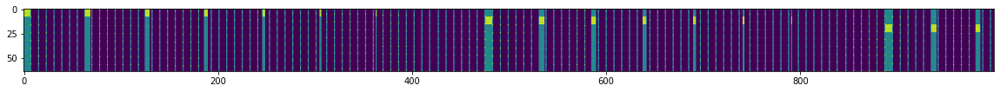

In [32]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

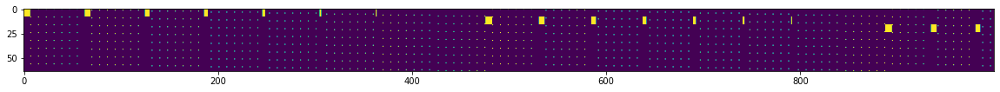

In [33]:
plt.figure(figsize = figsize)
plt.imshow(xy[figrange[0]:figrange[1], figrange[2]:figrange[3]])

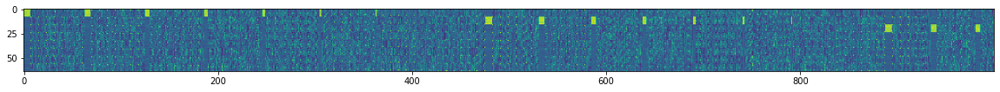

In [34]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_div_xyind_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

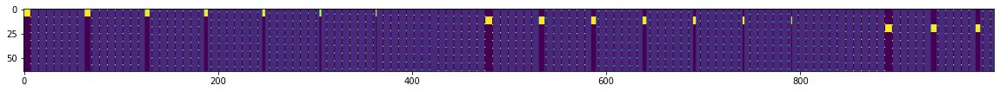

In [35]:
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

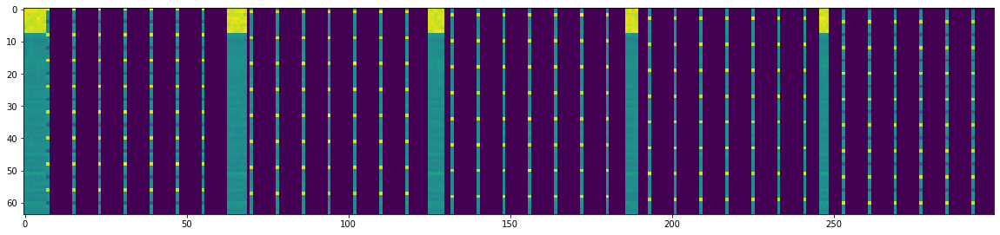

In [37]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

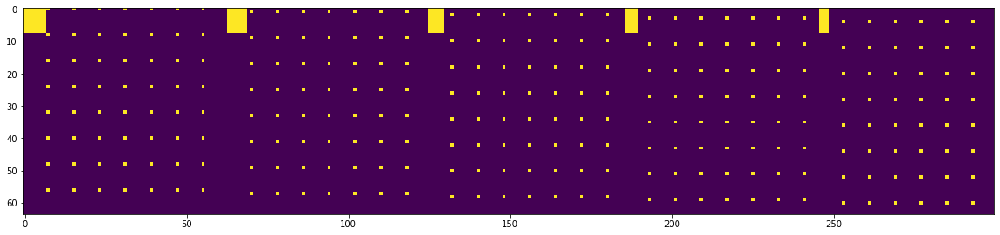

In [38]:
plt.figure(figsize = figsize)
plt.imshow(xy[figrange[0]:figrange[1], figrange[2]:figrange[3]])

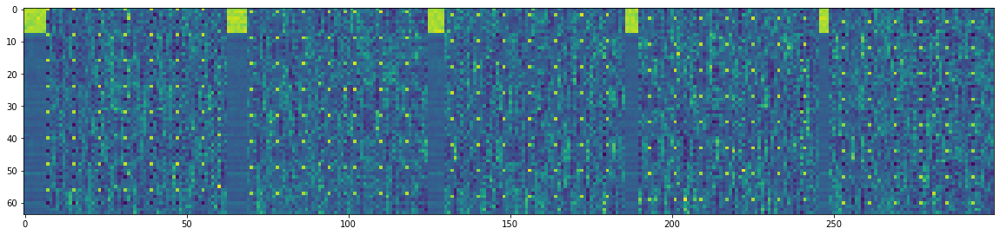

In [39]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_div_xyind_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

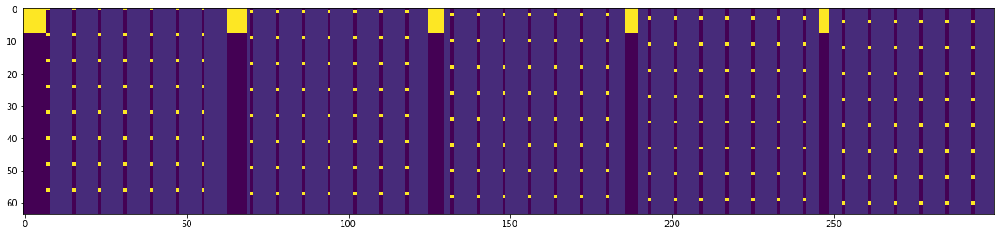

In [40]:
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

## Continue Training from checkpoint

In [ ]:
checkpoint_PATH = os.path.join(ckpt_dir_PATH, 'last.ckpt')
run_PATH = os.path.join(project_name, '1kaqbywv') # also from wandb interface

wandb.restore(checkpoint_PATH, run_path=run_PATH)
checkpoint = torch.load(checkpoint_PATH, map_location=lambda storage, loc: storage)
trainmodule.load_state_dict(checkpoint['state_dict'])

In [ ]:
trainer = pl.Trainer(
    gpus=[1], 
    min_epochs=2, max_epochs=800, 
    precision=32, 
    logger=wd_logger,
    log_gpu_memory='all',
    weights_summary = 'full',
    gradient_clip_val=hparams['gradient_clip_val'],
    replace_sampler_ddp=False,
    callbacks=[checkpoint_callback]
)

with torch.autograd.detect_anomaly():
    trainer.fit(trainmodule, game_datamodule)
    
wandb.save(os.path.join(ckpt_dir_PATH, 'last.ckpt'))

## Test after reloading checkpoint

In [ ]:
checkpoint_PATH = os.path.join(ckpt_dir_PATH, 'last.ckpt')
run_PATH = os.path.join(project_name, '1kaqbywv') # also from wandb interface

wandb.restore(checkpoint_PATH, run_path=run_PATH)
checkpoint = torch.load(checkpoint_PATH, map_location=lambda storage, loc: storage)
trainmodule.load_state_dict(checkpoint['state_dict'])

trainer = pl.Trainer(
    gpus=[1], 
    min_epochs=2, max_epochs=300, 
    precision=32, 
    logger=wd_logger,
    log_gpu_memory='all',
    weights_summary = 'full',
    gradient_clip_val=hparams['gradient_clip_val'],
    replace_sampler_ddp=False,
#     callbacks=[checkpoint_callback]
)

In [ ]:
test_loader = DataLoader(
            GameTestFullDataset(raw_data=game_data, debug=True), 
            batch_size=hparams['batch_size'], shuffle=False
        )
res = trainer.test(model=trainmodule, test_dataloaders=test_loader)

In [ ]:
model_distribution_res = trainmodule.pull_model_distribution(debug=True)
print('xy_hat_rank:', model_distribution_res['xy_hat_rank'])
print('xy_div_xyind_hat_rank:', model_distribution_res['xy_div_xyind_hat_rank'])
print('mi_hat:', model_distribution_res['mi_hat'])
print('mi_gt_minus_hat:', model_distribution_res['mi_gt_minus_hat'])
print('kl_div:', model_distribution_res['kl_div'])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow(xy[figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_div_xyind_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])